In [38]:
import os
import time
import copy
import json
from dataclasses import dataclass, asdict
from torch.utils.data import Subset, random_split   # این دو تا رو اگر هنوز وارد نکردی، اضافه کن

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

import pennylane as qml

from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder

from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix
)

import matplotlib.pyplot as plt
import seaborn as sns

torch.set_float32_matmul_precision('high')


In [11]:
import math
import os
import json
import numpy as np
import torch
from dataclasses import dataclass, asdict, field


@dataclass
class ExperimentConfig:
    seed: int = 43

    # Dataset
    dataset_name: str = "MNIST"  # گزینه‌ها: "MNIST" یا "CIFAR10"
    data_root: str = "./data"
    custom_train_dir: str = None
    custom_test_dir: str = None
    val_ratio: float = 0.1
    dataset_fraction: float = 0.1
    in_channels: int = 1  # برای CIFAR برابر با 3، برای MNIST برابر با 1

    # Training
    batch_size: int = 32  # مناسب برای پایداری Amplitude QNN
    epochs: int = 10
    lr: float = 1e-3
    weight_decay: float = 1e-4
    optimizer_name: str = "adamw"
    scheduler_name: str = "cosine"
    num_workers: int = 0  # 0 برای جلوگیری از Deadlock در پردازش کوانتومی چندرشته‌ای
    zz_scale: float = 0.25

    # Feature Dimensions
    num_classes: int = 10
    feature_dim: int = 64  # بعد بردار نهایی برای Amplitude (2**6) یا Angle

    # Spatial Feature Map Grid (ابعاد فیزیکی خروجی انکودر کانولوشنی)
    spatial_h: int = 8
    spatial_w: int = 8

    # Quantum
    n_qubits: int = 6       # برای Amplitude: 2**7 = 128
    n_q_layers: int = 3
    n_parallel: int = 3
    q_device_name: str = "default.qubit"
    shots: int = None

    # Runtime
    use_amp: bool = False
    save_dir: str = "./results_hybrid_parallel"

    def __post_init__(self):
        # اعتبارسنجی ابعاد برای حالت Amplitude
        assert 2 ** self.n_qubits == self.feature_dim, (
            f"مغایرت کوانتومی: feature_dim ({self.feature_dim}) باید دقیقا برابر با 2**n_qubits ({2**self.n_qubits}) باشد."
        )


cfg = ExperimentConfig()

print(f"✅ Config Initialized Successfully:")
print(f" - Feature Dim: {cfg.feature_dim}")
print(f" - Spatial Feature Map: {cfg.spatial_h} x {cfg.spatial_w} (Total: {cfg.spatial_h * cfg.spatial_w})")
print(f" - Qubits: {cfg.n_qubits} (Hilbert Space Dim: {2**cfg.n_qubits})")
print(f" - Parallel Heads: {cfg.n_parallel}")


✅ Config Initialized Successfully:
 - Feature Dim: 64
 - Spatial Feature Map: 8 x 8 (Total: 64)
 - Qubits: 6 (Hilbert Space Dim: 64)
 - Parallel Heads: 3


In [12]:
from torch.utils.data import Subset, random_split


class DatasetFactory:
    @staticmethod
    def get_transforms(dataset_name):
        name = dataset_name.lower()

        if name in ["mnist", "fashionmnist", "fashion"]:
            train_tf = transforms.Compose([
                transforms.Resize((32, 32)),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,))
            ])
            test_tf = transforms.Compose([
                transforms.Resize((32, 32)),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,))
            ])
            in_channels = 1

        elif name in ["cifar10", "custom"]:
            train_tf = transforms.Compose([
                transforms.Resize((32, 32)),
                transforms.RandomHorizontalFlip(),
                transforms.RandomCrop(32, padding=4),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=(0.4914, 0.4822, 0.4465),
                    std=(0.2023, 0.1994, 0.2010)
                )
            ])
            test_tf = transforms.Compose([
                transforms.Resize((32, 32)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=(0.4914, 0.4822, 0.4465),
                    std=(0.2023, 0.1994, 0.2010)
                )
            ])
            in_channels = 3

        else:
            raise ValueError(f"Unknown dataset_name: {dataset_name}")

        return train_tf, test_tf, in_channels

    @staticmethod
    def build_datasets(cfg, selected_ratio=None):
        name = cfg.dataset_name.lower()
        train_tf, test_tf, in_channels = DatasetFactory.get_transforms(name)
        
        # اگر کاربر صریحاً آرگومان داد، اولویت با اونه؛ در غیر این صورت از cfg می‌خواند
        if selected_ratio is None:
            selected_ratio = getattr(cfg, "dataset_fraction", 1.0)

        # === ساخت دیتاست‌های کامل train و test ===
        if name == "mnist":
            train_ds = datasets.MNIST(
                root=cfg.data_root, train=True,
                transform=train_tf, download=True
            )
            test_ds = datasets.MNIST(
                root=cfg.data_root, train=False,
                transform=test_tf, download=True
            )
        elif name in ["fashionmnist", "fashion"]:
            train_ds = datasets.FashionMNIST(
                root=cfg.data_root, train=True,
                transform=train_tf, download=True
            )
            test_ds = datasets.FashionMNIST(
                root=cfg.data_root, train=False,
                transform=test_tf, download=True
            )
        elif name == "cifar10":
            train_ds = datasets.CIFAR10(
                root=cfg.data_root, train=True,
                transform=train_tf, download=True
            )
            test_ds = datasets.CIFAR10(
                root=cfg.data_root, train=False,
                transform=test_tf, download=True
            )
        elif name == "custom":
            if cfg.custom_train_dir is None or cfg.custom_test_dir is None:
                raise ValueError(
                    "Set custom_train_dir and custom_test_dir for custom dataset."
                )
            train_ds = ImageFolder(cfg.custom_train_dir, transform=train_tf)
            test_ds = ImageFolder(cfg.custom_test_dir, transform=test_tf)
        else:
            raise ValueError(f"Unsupported dataset: {name}")

        # === انتخاب X٪ از دیتاست آموزش ===
        if selected_ratio < 1.0:
            num_samples = max(int(len(train_ds) * selected_ratio), 10)
            num_samples = min(num_samples, len(train_ds))
            # تولید اندیس‌ها با seed مشخص برای تکرارپذیری
            generator = torch.Generator().manual_seed(cfg.seed)
            indices = torch.randperm(len(train_ds), generator=generator)[:num_samples].tolist()
            train_ds = Subset(train_ds, indices)

        # === استخراج تعداد کلاس‌ها ===
        base_ds = train_ds.dataset if isinstance(train_ds, Subset) else train_ds
        if hasattr(base_ds, "classes"):
            num_classes = len(base_ds.classes)
        else:
            num_classes = cfg.num_classes

        return train_ds, test_ds, in_channels, num_classes

    @staticmethod
    def build_loaders(cfg, selected_ratio=None):
        train_ds, test_ds, in_channels, num_classes = DatasetFactory.build_datasets(
            cfg, selected_ratio=selected_ratio
        )

        n_total = len(train_ds)
        n_val = int(cfg.val_ratio * n_total)
        n_train = n_total - n_val

        if n_val <= 0 or n_train <= 0:
            raise ValueError(
                f"Invalid split: n_train={n_train}, n_val={n_val} "
                f"(val_ratio={cfg.val_ratio}, total={n_total})"
            )

        train_subset, val_subset = random_split(
            train_ds,
            [n_train, n_val],
            generator=torch.Generator().manual_seed(cfg.seed)
        )

        loader_kwargs = dict(
            batch_size=cfg.batch_size,
            num_workers=cfg.num_workers,
            pin_memory=torch.cuda.is_available()
        )

        train_loader = DataLoader(train_subset, shuffle=True, **loader_kwargs)
        val_loader = DataLoader(val_subset, shuffle=False, **loader_kwargs)
        test_loader = DataLoader(test_ds, shuffle=False, **loader_kwargs)

        return train_loader, val_loader, test_loader, in_channels, num_classes


In [13]:
# خروجی build_loaders رو بگیر
train_loader, val_loader, test_loader, in_channels, num_classes = DatasetFactory.build_loaders(cfg, selected_ratio=0.2)

# موقع ساخت مدل، in_channels رو پاس بده

print(f"Train samples: {len(train_loader.dataset)}")
print(f"Validation samples: {len(val_loader.dataset)}")
print(f"Test samples: {len(test_loader.dataset)}")
print(f"In channels: {in_channels}, Num classes: {num_classes}")

Train samples: 10800
Validation samples: 1200
Test samples: 10000
In channels: 1, Num classes: 10


In [14]:
in_channels

1

In [39]:
class ClassicalBackbone(nn.Module):

    def __init__(self, in_channels=1, feature_dim=32, use_projector=True):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 8, 3, padding=1, bias=True),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2), # 16*16

            nn.Conv2d(8, 16, 3, padding=1, bias=True),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2), # 8*8

           # nn.Conv2d(32, 64, 3, padding=1, bias=True),
           # nn.BatchNorm2d(64),
           # nn.ReLU(inplace=True),
        )
        self.use_projector = use_projector

        # ✅ تشخیص خودکار تعداد channel خروجی
        self.out_channels = 16

        self.pool = nn.Sequential(
            nn.AdaptiveAvgPool2d((4, 4))
        )

        with torch.no_grad():
            dummy = torch.zeros(1, in_channels, 32, 32)
            feat = self.pool(self.encoder(dummy))
            flat_dim = feat.view(1, -1).shape[1]
        
        if use_projector:
            self.projector = nn.Sequential(
                nn.Flatten(),
                nn.Linear(flat_dim, feature_dim),
            )
        else:
            self.projector = None

    def forward(self, x):

        x = x.float()
 
        feature_map = self.encoder(x)

        pooled = self.pool(feature_map)
        if self.projector is not None:
            feature_vec = self.projector(pooled)
        else:
            feature_vec = None

        return feature_vec, feature_map

In [40]:
import math
import torch


def _first_n_primes(n: int):
    primes = []
    x = 2
    while len(primes) < n:
        is_prime = True
        r = int(math.sqrt(x)) + 1
        for p in range(2, r):
            if x % p == 0:
                is_prime = False
                break
        if is_prime:
            primes.append(x)
        x += 1
    return primes


def _coprime_geq(start: int, n: int):
    x = max(1, start)
    while math.gcd(x, n) != 1:
        x += 1
    return x


def _grid_identity(h, w):
    return torch.arange(h * w, dtype=torch.long)


def _grid_reverse(h, w):
    return torch.arange(h * w - 1, -1, -1, dtype=torch.long)


def _grid_serpentine(h, w):
    rows = []
    for r in range(h):
        if r % 2 == 0:
            row = torch.arange(r * w, (r + 1) * w, dtype=torch.long)
        else:
            row = torch.arange((r + 1) * w - 1, r * w - 1, -1, dtype=torch.long)
        rows.append(row)
    return torch.cat(rows)


def _grid_col_major(h, w):
    return (torch.arange(w)[None, :] * h + torch.arange(h)[:, None]).reshape(-1).long()


def _grid_col_major_reverse_cols(h, w):
    col_order = torch.arange(w - 1, -1, -1)
    return (col_order[None, :] * h + torch.arange(h)[:, None]).reshape(-1).long()


def _grid_checkerboard(h, w):
    coords = [(r, c) for r in range(h) for c in range(w)]
    even = [r * w + c for r, c in coords if (r + c) % 2 == 0]
    odd = [r * w + c for r, c in coords if (r + c) % 2 == 1]
    return torch.tensor(even + odd, dtype=torch.long)


def _grid_row_shift_prime(h, w, p):
    rows = []
    for r in range(h):
        shift = (r * p) % w
        cols = (torch.arange(w) + shift) % w
        rows.append(r * w + cols)
    return torch.cat(rows).long()


def _grid_col_shift_prime(h, w, p):
    cols = []
    for c in range(w):
        shift = (c * p) % h
        rows = (torch.arange(h) + shift) % h
        cols.append(rows * w + c)
    return torch.cat(cols).long()


def _grid_affine_flat(h, w, a, b):
    n = h * w
    idx = torch.arange(n, dtype=torch.long)
    return ((a * idx + b) % n).long()


def _grid_diagonal_wrap(h, w, p):
    used = torch.zeros(h, w, dtype=torch.bool)
    out = []

    for start in range(h + w - 1):
        diag = []
        for r in range(h):
            c = start - r
            if 0 <= c < w:
                diag.append((r, c))

        if len(diag) == 0:
            continue

        shift = p % len(diag)
        diag = diag[shift:] + diag[:shift]

        for r, c in diag:
            if not used[r, c]:
                out.append(r * w + c)
                used[r, c] = True

    return torch.tensor(out, dtype=torch.long)


def make_spatial_permutations(h=8, w=8, n_heads=8):
    """
    تولید permutation برای هر تعداد head به صورت deterministic و scalable.

    خروجی:
        perms[head_idx] -> torch.LongTensor of shape [h*w]
    """
    n = h * w
    primes = _first_n_primes(max(n_heads * 2, 16))

    families = [
        "identity",
        "serpentine",
        "checkerboard",
        "row_shift_prime",
        "col_shift_prime",
        "col_major_reverse",
        "reverse",
        "affine_flat",
        "diagonal_wrap",
    ]

    perms = []
    seen = set()

    for head in range(n_heads):
        family = families[head % len(families)]
        p = primes[head]
        q = primes[head + 1]

        if family == "identity":
            perm = _grid_identity(h, w)

        elif family == "serpentine":
            perm = _grid_serpentine(h, w)

        elif family == "checkerboard":
            perm = _grid_checkerboard(h, w)

        elif family == "row_shift_prime":
            perm = _grid_row_shift_prime(h, w, p)

        elif family == "col_shift_prime":
            perm = _grid_col_shift_prime(h, w, p)

        elif family == "col_major_reverse":
            perm = _grid_col_major_reverse_cols(h, w)

        elif family == "reverse":
            perm = _grid_reverse(h, w)

        elif family == "affine_flat":
            a = _coprime_geq(p, n)
            b = q % n
            perm = _grid_affine_flat(h, w, a, b)

        elif family == "diagonal_wrap":
            perm = _grid_diagonal_wrap(h, w, p)

        else:
            perm = _grid_identity(h, w)

        key = tuple(perm.tolist())

        # اگر تکراری شد، fallback به affine جدید
        if key in seen:
            a = _coprime_geq(p + head + 1, n)
            b = (q + head * 7) % n
            perm = _grid_affine_flat(h, w, a, b)
            key = tuple(perm.tolist())

        seen.add(key)
        perms.append(perm)

    return perms


In [41]:
import numpy as np
import pennylane as qml
import torch
import torch.nn as nn

# =========================================================
# Updated Entanglement Patterns (Dynamic Routing / Imprinting)
# =========================================================

def ring_entanglement(n_qubits, shift=0):
    """Circular / Ring – با پشتیبانی از شیفت داینامیک"""
    for q in range(n_qubits):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])


def pairwise_entanglement(n_qubits, shift=0):
    """Pairwise – با پشتیبانی از شیفت داینامیک"""
    # لایه اول: زوج‌ها
    for q in range(0, n_qubits - 1, 2):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])
    # لایه دوم: فردها
    for q in range(1, n_qubits - 1, 2):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])


def ring_skip_entanglement(n_qubits, shift=0):
    """Circular + long-range skip (فاصله ۲) – با پشتیبانی از شیفت داینامیک"""
    for q in range(n_qubits):
        src = q
        tgt1 = (q + 1 + shift) % n_qubits
        tgt2 = (q + 2 + shift) % n_qubits
        if src != tgt1:
            qml.CNOT(wires=[src, tgt1])
        if src != tgt2:
            qml.CNOT(wires=[src, tgt2])

# لیست الگوها برای n_parallel تا head
ENTANGLEMENT_PATTERNS = [ring_entanglement, pairwise_entanglement, ring_skip_entanglement]

# =========================================================
# Hybrid QNode Factory
# =========================================================

class HybridQNodeFactory:
    """یک QNode برداری برای هر mode می‌سازد (نسخه دو-Rotation با Imprinting Shift)."""

    SUPPORTED_MODES = {
        "amplitude",
        "zz",
        "dense_angle",
    }

    def __init__(self, cfg, mode, head_idx=0):
        if mode not in self.SUPPORTED_MODES:
            raise ValueError(
                f"Unknown mode={mode!r}; "
                f"expected one of {sorted(self.SUPPORTED_MODES)}"
            )

        self.cfg = cfg
        self.mode = mode
        self.head_idx = head_idx
        self.n_qubits = cfg.n_qubits
        self.n_layers = cfg.n_q_layers

        self.dev = qml.device(
            cfg.q_device_name,
            wires=self.n_qubits,
            shots=cfg.shots,
        )

        self.ring_pairs = tuple(
            (q, (q + 1) % self.n_qubits)
            for q in range(self.n_qubits)
        )

        self.zz_pairs = tuple(
            (i, j)
            for i in range(self.n_qubits)
            for j in range(i + 1, self.n_qubits)
        )

        self.qnode = self._build_qnode()

    def _build_qnode(self):
        mode = self.mode
        n_qubits = self.n_qubits
        n_layers = self.n_layers
        head_idx = self.head_idx
        # شدت interaction داده‌محور ZZ
        zz_scale = float(getattr(self.cfg, "zz_scale", 0.25))

        # جلوگیری از مقدار نامعتبر
        if zz_scale < 0.0:
            raise ValueError("cfg.zz_scale باید بزرگ‌تر یا مساوی صفر باشد.")

        @qml.qnode(
            self.dev,
            interface="torch",
            diff_method="backprop",
        )
        def circuit(feat_batch, amp_batch, weight_batch):
            """
            weight_batch باید شکل زیر را داشته باشد:
            (N, n_layers, 2, n_qubits, 3)
            """

            # -------------------------------------------------------
            # Embedding اولیه
            # -------------------------------------------------------
            if mode == "amplitude":
                qml.AmplitudeEmbedding(
                    features=amp_batch,
                    wires=range(n_qubits),
                    normalize=True,
                    pad_with=0.0,
                )

            # -------------------------------------------------------
            # لایه‌های variational: Rot → Ent → Rot
            # -------------------------------------------------------
            entangle_fn = ENTANGLEMENT_PATTERNS[head_idx % len(ENTANGLEMENT_PATTERNS)]

            for layer in range(n_layers):
                # Encoding data in eath layer (برای modeهای dense_angle و zz)
                
                if mode == "dense_angle":
                    chunk = feat_batch[:, layer, :]              # (B, 2*n_qubits)  -- Comment fix: technically 3*n_qubits for dense_angle
                    chunk = (chunk - chunk.mean(dim=-1, keepdim=True)) / (chunk.std(dim=-1, keepdim=True) + 1e-6)  # نرمال‌سازی

                    angles_y = torch.tanh(chunk[:, :n_qubits]) * torch.pi
                    angles_z = torch.tanh(chunk[:, n_qubits:2*n_qubits]) * torch.pi
                    angles_x = torch.tanh(chunk[:, 2 * n_qubits:]) * torch.pi

                    if layer == 0:
                        for q in range(n_qubits):
                            qml.Hadamard(wires=q)

                    for q in range(n_qubits):
                        qml.RX(angles_x[:, q], wires=q)
                        qml.RY(angles_y[:, q], wires=q)
                        j = (q + 1) % n_qubits

                        # interaction دو feature مجاور
                        phi = (
                            zz_scale
                            * angles_x[:, q]
                            * angles_y[:, j]
                            / torch.pi
                        )

                        qml.CNOT(wires=[q, j])

                        qml.RZ(
                            2.0 * phi,
                            wires=j,
                        )                        
                        qml.CNOT(wires=[q, j])
                        qml.RZ(angles_z[:, q], wires=q)


                # ========== Re-uploading مخصوص ZZ ==========
                if mode == "zz":
                    # feat_batch: (B, n_layers, 2 * n_qubits)
                    raw = feat_batch[:, layer, :]

                    if raw.shape[-1] != 2 * n_qubits:
                        raise ValueError(
                            "برای mode='zz' انتظار می‌رود آخرین بعد feat_batch "
                            f"برابر 2*n_qubits باشد، اما shape={raw.shape}"
                        )

                    # --------------------------------------------------
                    # نرمال‌سازی مشترک دو کانال هر layer
                    # --------------------------------------------------
                    raw = (
                        raw - raw.mean(dim=-1, keepdim=True)
                    ) / (
                        raw.std(dim=-1, keepdim=True) + 1e-6
                    )

                    # --------------------------------------------------
                    # جداسازی دو embedding مستقل برای هر qubit
                    # --------------------------------------------------
                    angles_y = torch.tanh(raw[:, :n_qubits]) * torch.pi
                    angles_z = torch.tanh(raw[:, n_qubits:]) * torch.pi

                    # آماده‌سازی superposition فقط در ابتدای مدار
                    if layer == 0:
                        for q in range(n_qubits):
                            qml.Hadamard(wires=q)

                    # Embedding اول و دوم روی هر qubit
                    for q in range(n_qubits):
                        qml.RY(angles_y[:, q], wires=q)
                        qml.RZ(angles_z[:, q], wires=q)

                    # Data-dependent Ring ZZ
                    if n_qubits > 1:
                        for q in range(n_qubits):
                            j = (q + 1) % n_qubits
                            phi = (
                                zz_scale
                                * angles_z[:, q]
                                * angles_z[:, j]
                                / torch.pi
                            )
                            qml.CNOT(wires=[q, j])
                            qml.RZ(2.0 * phi, wires=j)
                            qml.CNOT(wires=[q, j])

                # ========== بلوک variational (همه modeها) ==========
                
                # 1. Rotation اول
                for q in range(n_qubits):
                    qml.Rot(
                        weight_batch[..., layer, 0, q, 0],
                        weight_batch[..., layer, 0, q, 1],
                        weight_batch[..., layer, 0, q, 2],
                        wires=q,
                    )

                # 2. Entanglement (اعمال شیفت داینامیک بر اساس لایه فعلی)
                current_shift = layer % n_qubits
                entangle_fn(n_qubits, shift=current_shift)

                # 3. Rotation دوم
                for q in range(n_qubits):
                    qml.Rot(
                        weight_batch[..., layer, 1, q, 0],
                        weight_batch[..., layer, 1, q, 1],
                        weight_batch[..., layer, 1, q, 2],
                        wires=q,
                    )

            # اندازه‌گیری (اجباری)
            # برای هر کیوبیت: <X>, <Z>
            return (
                [qml.expval(qml.PauliX(q)) for q in range(n_qubits)]
                 + [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]
            )

        return circuit


In [42]:
class BaseParallelQNNLayer(nn.Module):
    """
    Base class for parallel QNNs (vectorized version).
    Children define how inputs are prepared for each head.
    
    Features→Head-specific preparation→Parallel QNodes→Concatenate→Quantum feature vector


    """

    def __init__(self, cfg, mode):
        super().__init__()

        self.cfg = cfg
        self.n_qubits = cfg.n_qubits
        self.n_layers = cfg.n_q_layers
        self.n_parallel = cfg.n_parallel
        self.feature_dim = cfg.feature_dim
        # برای هر head یک qnode مستقل (همان mode) می‌سازیم
        self.factories = []
        for p in range(self.n_parallel):
            factory = HybridQNodeFactory(cfg, mode, head_idx=p)  # ← اینجا
            self.factories.append(factory)
        
        # هر head یک qnode مستقل دارد  
        self.qnodes = [f.qnode for f in self.factories]

        # وزن مشترک ansatz، اما برای هر head مستقل
        self.weights = nn.Parameter(
            0.01 * torch.randn(
                self.n_parallel,
                self.n_layers,
                2,                  # دو بلوک Rot در هر لایه
                self.n_qubits,
                3
            ) #(P, n_layers, 2, n_qubits, 3)
        )

        # هر head خروجی n_qubits → مجموعاً n_parallel * n_qubits
        self.n_obs = 2  # X, Z measurements per qubit
        self.out_dim = self.n_parallel * self.n_qubits * self.n_obs
    def prepare_inputs_for_heads(self, features):
        """
        باید در کلاس فرزند override شود.

        ورودی:
            features: (BatchSize, feature_dim)
        خروجی:
            feature_heads: (B, n_parallel, ...)
            amp_heads:     (B, n_parallel, 2**n_qubits)
        """
        raise NotImplementedError

    def forward(self, features):

        if isinstance(features, (tuple, list)):
            original_device = features[1].device   # feature_map
        else:
            original_device = features.device

        feature_heads, amp_heads = self.prepare_inputs_for_heads(features)

        B = amp_heads.shape[0]

        feature_heads = feature_heads.to("cpu")
        amp_heads = amp_heads.to("cpu")

        outputs = []

        for p in range(self.n_parallel):
            f_p = feature_heads[:, p]
            a_p = amp_heads[:, p]

            w_p = (
                self.weights[p]
                .unsqueeze(0)
                .expand(B, -1, -1, -1, -1)
                .to("cpu")
            )

            out_p = self.qnodes[p](f_p, a_p, w_p)

            # خروجی QNode شامل X و Z است
            out_p = torch.stack(out_p, dim=-1).float()

            outputs.append(out_p)

        outputs = torch.cat(outputs, dim=-1)

        return outputs.to(original_device)


In [43]:
class ParallelAmplitudeQNNLayer(BaseParallelQNNLayer):

    def __init__(self, cfg, in_channels):
        super().__init__(
            cfg,
            mode="amplitude"
        )

        self.n_qubits = cfg.n_qubits
        self.n_parallel = cfg.n_parallel
        self.amp_dim = 2 ** self.n_qubits

        self.pool = nn.AdaptiveAvgPool2d((4, 4))
        self.in_channels = in_channels

        # پروژکتور برای تبدیل 64*4*4=1024 به 128
        self.projector = nn.Linear(
            self.in_channels * 4 * 4,
            self.amp_dim,
            bias=False
        )

        # Permutation دقیقا روی ابعاد فضایی 8x8 خروجی انکودر
        perms = make_spatial_permutations(
            h=8,
            w=8,
            n_heads=cfg.n_parallel,
        )

        for i in range(self.n_parallel):
            self.register_buffer(f"perm{i}", perms[i])

    def _apply_spatial_permutation(self, feature_map, perm):
        B, C, H, W = feature_map.shape
        x = feature_map.reshape(B, C, H * W)
        x = x[:, :, perm]
        x = x.reshape(B, C, H, W)
        return x

    def _prepare_one_head(self, feature_map, perm):
        x = self._apply_spatial_permutation(feature_map, perm)
        x = self.pool(x)
        x = x.flatten(1)
        return self.projector(x)

    def prepare_inputs_for_heads(self, features):
        if isinstance(features, (tuple, list)):
            feature_vec, feature_map = features
        else:
            feature_map = features
            feature_vec = None

        amp_list = []
        for i in range(self.n_parallel):
            perm = getattr(self, f"perm{i}")
            amp_i = self._prepare_one_head(feature_map, perm)
            amp_list.append(amp_i)

        # [B, n_parallel, 128]
        amp_heads = torch.stack(amp_list, dim=1)

        B = feature_map.shape[0]
        if feature_vec is not None:
            feature_heads = feature_vec.unsqueeze(1).expand(-1, self.n_parallel, -1)
        else:
            feature_heads = torch.zeros(B, self.n_parallel, 1, device=feature_map.device)

        return feature_heads, amp_heads


In [44]:
class ParallelZZFeatureQNNLayer(BaseParallelQNNLayer):
    def __init__(self, cfg):
        super().__init__(cfg, mode="zz")

        self.in_features = cfg.feature_dim

        if self.in_features is None:
            raise ValueError("cfg.feature_dim باید مشخص باشد.")

        # برای هر qubit دو feature داریم:
        # channel 1 -> RY
        # channel 2 -> RZ
        #
        # ظرفیت کل:
        # P × L × 2Q
        self.q_input_dim = (
            self.n_parallel
            * self.n_layers
            * 2
            * self.n_qubits
        )

        # فقط در صورت بزرگ‌تر بودن feature_dim، فشرده‌سازی trainable
        if self.in_features > self.q_input_dim:
            self.proj = nn.Linear(
                self.in_features,
                self.q_input_dim,
                bias=False,
            )

            # مقداردهی اولیه‌ی کنترل‌شده
            nn.init.normal_(
                self.proj.weight,
                mean=0.0,
                std=0.1,
            )
        else:
            self.proj = nn.Identity()

    def prepare_inputs_for_heads(self, features):
        """
        ورودی:
            features: (B, feature_dim)

        خروجی:
            feature_heads: (B, P, L, 2Q)
            amp_heads:     (B, P, 2**Q)
        """
        if features.ndim != 2:
            raise ValueError(
                f"features باید دو‌بعدی باشد، اما shape={features.shape}"
            )

        B, D_in = features.shape
        D_q = self.q_input_dim

        # --------------------------------------------------
        # حالت ۱: فشرده‌سازی trainable
        # --------------------------------------------------
        if D_in > D_q:
            x = self.proj(features)

        # --------------------------------------------------
        # حالت ۲: ورود مستقیم
        # --------------------------------------------------
        elif D_in == D_q:
            x = features

        # --------------------------------------------------
        # حالت ۳: تکرار cyclic
        # --------------------------------------------------
        else:
            if D_in == 0:
                raise ValueError("feature_dim نمی‌تواند صفر باشد.")

            repeat_factor = (D_q + D_in - 1) // D_in
            x = features.repeat(1, repeat_factor)[:, :D_q]

        # --------------------------------------------------
        # (B, P*L*2Q) -> (B, P, L, 2Q)
        # --------------------------------------------------
        feature_heads = x.reshape(
            B,
            self.n_parallel,
            self.n_layers,
            2 * self.n_qubits,
        )

        # برای حفظ signature مشترک QNode
        amp_dim = 2 ** self.n_qubits

        amp_heads = torch.zeros(
            B,
            self.n_parallel,
            amp_dim,
            device=features.device,
            dtype=features.dtype,
        )

        return feature_heads, amp_heads


In [45]:
class ParallelDenseAngleQNNLayer(BaseParallelQNNLayer):
    def __init__(self, cfg):
        super().__init__(cfg, mode="dense_angle")

        self.n_q = self.n_qubits
        self.in_features = cfg.feature_dim

        if self.in_features is None:
            raise ValueError("cfg.feature_dim باید مشخص باشد.")

        # ورودی موردنیاز کل مدار:
        # P head × L layer × (RY + RZ) × Q qubit
        self.q_input_dim = (
            self.n_parallel
            * self.n_layers
            * 3
            * self.n_q
        )

        # فقط وقتی خروجی Classical Backbone بزرگ‌تر است، Linear برای compression بزن
        if self.in_features > self.q_input_dim:
            self.feature_proj = nn.Linear(
                self.in_features,
                self.q_input_dim,
                bias=False,
            )
            nn.init.normal_(self.feature_proj.weight, mean=0.0, std=0.01)

        else:
            # در حالت برابر یا کوچک‌تر: هیچ پارامتر/Linear اضافه نمی‌شود
            self.feature_proj = nn.Identity()

    def prepare_inputs_for_heads(self, features):
        """
        ورودی:
            features: (B, feature_dim)

        خروجی:
            angle_heads: (B, n_parallel, n_layers, 2*n_qubits)
            amp_heads:   dummy
        """
        B, D_in = features.shape
        D_q = self.q_input_dim

        # -------------------------------------------------------
        # حالت 1: D_in > D_q
        # فشرده‌سازی trainable با Linear
        # -------------------------------------------------------
        if D_in > D_q:
            x = self.feature_proj(features)  # (B, D_q)

        # -------------------------------------------------------
        # حالت 2: D_in == D_q
        # ورود مستقیم، بدون Linear
        # -------------------------------------------------------
        elif D_in == D_q:
            x = features  # (B, D_q)

        # -------------------------------------------------------
        # حالت 3: D_in < D_q
        # بدون Linear: تکرار cyclic ویژگی‌ها تا رسیدن به D_q
        # -------------------------------------------------------
        else:
            repeat_factor = (D_q + D_in - 1) // D_in
            x = features.repeat(1, repeat_factor)[:, :D_q]
            # shape: (B, D_q)

        # (B, P*L*2Q) -> (B, P, L, 2Q)
        angle_heads = x.reshape(
            B,
            self.n_parallel,
            self.n_layers,
            3 * self.n_q,
        )

        # فقط برای signature ثابت Base/QNode
        amp_dim = 2 ** self.n_q
        amp_heads = torch.zeros(
            B,
            self.n_parallel,
            amp_dim,
            device=features.device,
            dtype=features.dtype,
        )

        return angle_heads, amp_heads


In [46]:
class BaseHybridParallelModel(nn.Module):
    """
    ClassicalBackbone -> Parallel QNN Layer -> Classifier
    """

    def __init__(self, backbone, q_layer, cfg):
        super().__init__()

        self.backbone = backbone
        self.q_layer = q_layer

        self.classifier = nn.Sequential(
            nn.Linear(self.q_layer.out_dim, cfg.num_classes),
        )

    def forward(self, x):
        features = self.backbone(x)
        
        # backbone حالا tuple برمی‌گرداند → فقط بردار را بردار
        if isinstance(features, (tuple, list)):
            features = features[0]          # feature_vec
        
        q_features = self.q_layer(features)
        logits = self.classifier(q_features)
        return logits


In [47]:
class HybridAmplitudeParallelModel(nn.Module):

    def __init__(self, in_channels, cfg):          # ← in_channels را اضافه کن
        super().__init__()

        self.backbone = ClassicalBackbone(
            in_channels=in_channels,               # ← از پارامتر استفاده کن
            feature_dim=cfg.feature_dim,
            use_projector=False
        )

        self.qnn_layer = ParallelAmplitudeQNNLayer(
            cfg,
            in_channels=self.backbone.out_channels
        )

        qnn_out_dim = (
            cfg.n_parallel
            * 2
            * cfg.n_qubits
        )

        self.classifier = nn.Linear(
            qnn_out_dim,
            cfg.num_classes
        )

    def forward(self, x):

        # -----------------------------------------------------
        # CNN
        # -----------------------------------------------------
        feature_vec, feature_map = self.backbone(x)
        # shape:
        # (B,64,8,8)

        # -----------------------------------------------------
        # Parallel Quantum Heads
        # -----------------------------------------------------
        qnn_out = self.qnn_layer(feature_map)
        # مثلا:
        # (B, 3 × 6 × 2)
        # = (B,36)

        # -----------------------------------------------------
        # Classifier
        # -----------------------------------------------------
        logits = self.classifier(
            qnn_out
        )

        return logits


class HybridZZFeatureParallelModel(BaseHybridParallelModel):
    def __init__(self, in_channels, cfg):
        backbone = ClassicalBackbone(in_channels, cfg.feature_dim)
        q_layer = ParallelZZFeatureQNNLayer(cfg)
        super().__init__(backbone, q_layer, cfg)


class HybridDenseAnglearallelModel(BaseHybridParallelModel):
    def __init__(self, in_channels, cfg):
        backbone = ClassicalBackbone(in_channels, cfg.feature_dim)
        q_layer = ParallelDenseAngleQNNLayer(cfg)
        super().__init__(backbone, q_layer, cfg)


class FullClassicalBaselineModel(nn.Module):
    def __init__(self, in_channels, cfg):
        super().__init__()

        self.backbone = ClassicalBackbone(in_channels, cfg.feature_dim)

        self.classifier = nn.Sequential(
            nn.Linear(cfg.feature_dim, 64),
            nn.ReLU(inplace=True),
            nn.Linear(64, 32),
            nn.SELU(inplace=True),
            nn.Linear(32, cfg.num_classes)
        )

    def forward(self, x):
        features, _ = self.backbone(x)
        logits = self.classifier(features)
        return logits


In [48]:
model = HybridAmplitudeParallelModel(in_channels=cfg.in_channels, cfg=cfg)

x = torch.randn(
    2,
    cfg.in_channels,
    32,
    32
)

with torch.no_grad():

    # Backbone دو خروجی دارد
    feature_vec, feature_map = model.backbone(x)

    print("Feature vector:", feature_vec)   # None برای Amplitude
    print("Feature map:", feature_map.shape)

    # فقط feature_map وارد spatial permutation می‌شود
    feature_heads, amp_heads = \
        model.qnn_layer.prepare_inputs_for_heads(
            feature_map
        )

    for i, amp in enumerate(amp_heads):
        print(
            f"Head {i} amplitude:",
            amp.shape
        )

    # تست کل مدل
    out = model(x)

    print(
        "Final output:",
        out.shape
    )

Feature vector: None
Feature map: torch.Size([2, 16, 8, 8])
Head 0 amplitude: torch.Size([3, 64])
Head 1 amplitude: torch.Size([3, 64])
Final output: torch.Size([2, 10])


In [49]:
import torch
import numpy as np
import random

def set_seed(seed=42):
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

set_seed(42) # حتما فراخوانی شود


In [23]:
import numpy as np
from scipy.stats import entropy
import pennylane as qml
import torch
import pandas as pd
from IPython.display import display, HTML


# =========================================================
# Entanglement patterns — دقیقاً مطابق کد جدید تو
# =========================================================
def ring_entanglement(n_qubits):
    """Circular / Ring"""
    for q in range(n_qubits):
        qml.CNOT(wires=[q, (q + 1) % n_qubits])


def pairwise_entanglement(n_qubits):
    """Pairwise"""
    for q in range(0, n_qubits - 1, 2):
        qml.CNOT(wires=[q, q + 1])
    for q in range(1, n_qubits - 1, 2):
        qml.CNOT(wires=[q, q + 1])


def ring_skip_entanglement(n_qubits):
    """Circular + long-range skip (distance 2)"""
    for q in range(n_qubits):
        qml.CNOT(wires=[q, (q + 1) % n_qubits])
    for q in range(n_qubits):
        qml.CNOT(wires=[q, (q + 2) % n_qubits])


ENTANGLEMENT_PATTERNS = [ring_entanglement, pairwise_entanglement, ring_skip_entanglement]
ENTANGLEMENT_NAMES   = ["ring", "pairwise", "ring_skip"]


# =========================================================
# Circuit factory — 100% matched to your NEW HybridQNodeFactory
# =========================================================
def make_state_circuit(mode, n_qubits, n_layers, head_idx=0, zz_scale=0.25):
    dev = qml.device("default.qubit", wires=n_qubits)
    entangle_fn = ENTANGLEMENT_PATTERNS[head_idx % len(ENTANGLEMENT_PATTERNS)]

    @qml.qnode(dev, interface="torch")
    def circuit(feat, weights):
        # Amplitude Embedding فقط یک‌بار
        if mode == "amplitude":
            qml.AmplitudeEmbedding(
                features=feat,
                wires=range(n_qubits),
                normalize=True,
                pad_with=0.0,
            )

        for layer in range(n_layers):

            # ---------------- dense_angle ----------------
            if mode == "dense_angle":
                chunk = feat[layer]  # (3 * n_qubits,)
                chunk = (chunk - chunk.mean()) / (chunk.std() + 1e-6)

                angles_y = torch.tanh(chunk[:n_qubits]) * torch.pi
                angles_z = torch.tanh(chunk[n_qubits:2*n_qubits]) * torch.pi
                angles_x = torch.tanh(chunk[2*n_qubits:3*n_qubits]) * torch.pi

                if layer == 0:
                    for q in range(n_qubits):
                        qml.Hadamard(wires=q)

                for q in range(n_qubits):
                    qml.RX(angles_x[q], wires=q)
                    qml.RY(angles_y[q], wires=q)

                    j = (q + 1) % n_qubits
                    phi = zz_scale * angles_x[q] * angles_y[j] / torch.pi

                    qml.CNOT(wires=[q, j])
                    qml.RZ(2.0 * phi, wires=j)
                    qml.RZ(angles_z[q], wires=q)
                    qml.CNOT(wires=[q, j])

            # ---------------- zz ----------------
            elif mode == "zz":
                raw = feat[layer]  # (2 * n_qubits,)
                raw = (raw - raw.mean()) / (raw.std() + 1e-6)

                angles_y = torch.tanh(raw[:n_qubits]) * torch.pi
                angles_z = torch.tanh(raw[n_qubits:]) * torch.pi

                if layer == 0:
                    for q in range(n_qubits):
                        qml.Hadamard(wires=q)

                for q in range(n_qubits):
                    qml.RY(angles_y[q], wires=q)
                    qml.RZ(angles_z[q], wires=q)

                if n_qubits > 1:
                    for q in range(n_qubits):
                        j = (q + 1) % n_qubits
                        phi = zz_scale * angles_z[q] * angles_z[j] / torch.pi
                        qml.CNOT(wires=[q, j])
                        qml.RZ(2.0 * phi, wires=j)
                        qml.CNOT(wires=[q, j])

            # ---------------- Ansatz: Rot → Ent → Rot ----------------
            for q in range(n_qubits):
                qml.Rot(
                    weights[layer, 0, q, 0],
                    weights[layer, 0, q, 1],
                    weights[layer, 0, q, 2],
                    wires=q,
                )

            entangle_fn(n_qubits)

            for q in range(n_qubits):
                qml.Rot(
                    weights[layer, 1, q, 0],
                    weights[layer, 1, q, 1],
                    weights[layer, 1, q, 2],
                    wires=q,
                )

        return qml.state()

    return circuit


def _sample_inputs(mode, n_qubits, n_layers):
    if mode == "amplitude":
        feat = torch.randn(2 ** n_qubits) * 0.5
    elif mode == "zz":
        feat = torch.randn(n_layers, 2 * n_qubits) * 0.8
    elif mode == "dense_angle":
        feat = torch.randn(n_layers, 3 * n_qubits) * 0.5
    else:
        raise ValueError(mode)

    weights = torch.randn(n_layers, 2, n_qubits, 3) * 0.4
    return feat, weights


def partial_trace_single_qubit(state, n_qubits, target_qubit):
    state = np.asarray(state, dtype=np.complex128).reshape([2] * n_qubits)
    axes = list(range(n_qubits))
    axes.remove(target_qubit)
    return np.tensordot(state, state.conj(), axes=(axes, axes))


def compute_expressibility(mode, n_qubits, n_layers, head_idx=0, zz_scale=0.25,
                           n_samples=50, n_bins=50):
    circuit = make_state_circuit(mode, n_qubits, n_layers, head_idx, zz_scale)
    fidelities = []
    for _ in range(n_samples):
        f1, w1 = _sample_inputs(mode, n_qubits, n_layers)
        f2, w2 = _sample_inputs(mode, n_qubits, n_layers)
        s1 = circuit(f1, w1)
        s2 = circuit(f2, w2)
        fid = torch.abs(torch.vdot(s1, s2)) ** 2
        fidelities.append(fid.item())

    # Histogram تجربی fidelity
    hist, bin_edges = np.histogram(
        fidelities,
        bins=n_bins,
        range=(0.0, 1.0),
        density=False,      # شمارش خام؛ سپس خودمان normalize می‌کنیم
    )

    eps = 1e-12
    hist = hist.astype(np.float64) + eps
    hist /= hist.sum()

    # ---------------------------------------------------------
    # Haar fidelity distribution for d = 2^n Hilbert space:
    # P_Haar(F) = (d - 1) * (1 - F)^(d - 2)
    # ---------------------------------------------------------
    d = 2 ** n_qubits

    # مرکز هر bin، نه لبهٔ آن
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    haar = (d - 1) * np.power(1.0 - bin_centers, d - 2)
    haar = haar + eps
    haar /= haar.sum()

    return float(entropy(hist, haar))



def compute_meyer_wallach(mode, n_qubits, n_layers, head_idx=0, zz_scale=0.25,
                          n_samples=15):
    circuit = make_state_circuit(mode, n_qubits, n_layers, head_idx, zz_scale)
    values = []
    for _ in range(n_samples):
        feat, weights = _sample_inputs(mode, n_qubits, n_layers)
        state = circuit(feat, weights).detach().cpu().numpy()
        mw = 0.0
        for i in range(n_qubits):
            rho = partial_trace_single_qubit(state, n_qubits, i)
            purity = np.real(np.trace(rho @ rho))
            mw += (1.0 - purity)
        mw *= (2.0 / n_qubits)
        values.append(mw)
    return float(np.mean(values))


# =========================================================
# Main evaluation
# =========================================================
def evaluate_quantum_properties(cfg, n_samples_expr=200, n_samples_ent=20):
    modes = ["amplitude", "zz", "dense_angle"]
    n_qubits   = cfg.n_qubits
    n_layers   = cfg.n_q_layers
    n_parallel = cfg.n_parallel
    zz_scale   = float(getattr(cfg, "zz_scale", 0.25))

    rows = []
    for mode in modes:
        for head_idx in range(n_parallel):
            ent_name = ENTANGLEMENT_NAMES[head_idx % len(ENTANGLEMENT_NAMES)]

            expr = compute_expressibility(
                mode, n_qubits, n_layers,
                head_idx=head_idx, zz_scale=zz_scale,
                n_samples=n_samples_expr
            )
            mw = compute_meyer_wallach(
                mode, n_qubits, n_layers,
                head_idx=head_idx, zz_scale=zz_scale,
                n_samples=n_samples_ent
            )

            rows.append({
                "Mode": mode,
                "Head": head_idx,
                "Entanglement": ent_name,
                "Expressibility (KL) ↓": round(expr, 4),
                "Meyer-Wallach ↑": round(mw, 4),
            })

    df = pd.DataFrame(rows)

    display(HTML(f"""
        <h3 style='text-align:center; margin-bottom:4px;'>
            Quantum Properties — Matched to New Entanglement Patterns
        </h3>
        <p style='text-align:center; color:#444; font-size:14px; margin-top:0;'>
            <b>n_qubits = {n_qubits}</b> &nbsp;|&nbsp;
            <b>n_layers = {n_layers}</b> &nbsp;|&nbsp;
            n_parallel = {n_parallel} &nbsp;|&nbsp;
            zz_scale = {zz_scale}
        </p>
        <p style='text-align:center; color:#666; font-size:13px;'>
            Patterns: ring &nbsp;|&nbsp; pairwise &nbsp;|&nbsp; ring_skip
        </p>
    """))

    styled = (
        df.style
        .format({
            "Expressibility (KL) ↓": "{:.4f}",
            "Meyer-Wallach ↑": "{:.4f}"
        })
        .background_gradient(subset=["Expressibility (KL) ↓"], cmap="RdYlGn_r")
        .background_gradient(subset=["Meyer-Wallach ↑"], cmap="RdYlGn")
        .set_properties(**{"text-align": "center", "font-size": "13px"})
        .set_table_styles([
            {"selector": "th", "props": [
                ("text-align", "center"),
                ("font-weight", "bold"),
                ("background-color", "#1f4e79"),
                ("color", "white"),
                ("padding", "8px")
            ]}
        ])
    )

    display(styled)
    return df


# ====================== اجرا ======================
# quantum_df = evaluate_quantum_properties(cfg)

In [29]:
quantum_df = evaluate_quantum_properties(cfg)

,Mode,Head,Entanglement,Expressibility (KL) ↓,Meyer-Wallach ↑
0,amplitude,0,ring,0.0369,0.9499
1,amplitude,1,pairwise,0.0067,0.9505
2,amplitude,2,ring_skip,0.0070,0.9559
3,zz,0,ring,0.0091,0.9534
4,zz,1,pairwise,0.0101,0.9180
5,zz,2,ring_skip,0.0043,0.9511
6,dense_angle,0,ring,0.0162,0.9554
7,dense_angle,1,pairwise,0.0126,0.9225
8,dense_angle,2,ring_skip,0.0209,0.9513


In [31]:
import numpy as np
import pandas as pd
import torch
import pennylane as qml
from scipy.stats import entropy
from IPython.display import display, HTML


# =========================================================
# Entanglement patterns
# =========================================================
def ring_entanglement(n_qubits):
    for q in range(n_qubits):
        qml.CNOT(wires=[q, (q + 1) % n_qubits])


def pairwise_entanglement(n_qubits):
    for q in range(0, n_qubits - 1, 2):
        qml.CNOT(wires=[q, q + 1])
    for q in range(1, n_qubits - 1, 2):
        qml.CNOT(wires=[q, q + 1])


def ring_skip_entanglement(n_qubits):
    for q in range(n_qubits):
        qml.CNOT(wires=[q, (q + 1) % n_qubits])
    for q in range(n_qubits):
        qml.CNOT(wires=[q, (q + 2) % n_qubits])


ENTANGLEMENT_PATTERNS = [
    ring_entanglement,
    pairwise_entanglement,
    ring_skip_entanglement,
]
ENTANGLEMENT_NAMES = ["ring", "pairwise", "ring_skip"]


# =========================================================
# Baseline / Imprinting entanglement routing
# =========================================================
def apply_entanglement(n_qubits, layer, base_pattern="ring", use_imprinting_shift=False):
    """
    If use_imprinting_shift=True, target wire shifts by layer % n_qubits.
    Only entanglement routing changes; embedding and ansatz remain intact.
    """
    shift = (layer % n_qubits) if use_imprinting_shift else 0

    if base_pattern == "ring":
        for q in range(n_qubits):
            src = q
            tgt = (q + 1 + shift) % n_qubits
            if src != tgt:
                qml.CNOT(wires=[src, tgt])

    elif base_pattern == "pairwise":
        for q in range(0, n_qubits - 1, 2):
            src = q
            tgt = (q + 1 + shift) % n_qubits
            if src != tgt:
                qml.CNOT(wires=[src, tgt])

        for q in range(1, n_qubits - 1, 2):
            src = q
            tgt = (q + 1 + shift) % n_qubits
            if src != tgt:
                qml.CNOT(wires=[src, tgt])

    elif base_pattern == "ring_skip":
        for q in range(n_qubits):
            src = q
            tgt1 = (q + 1 + shift) % n_qubits
            tgt2 = (q + 2 + shift) % n_qubits
            if src != tgt1:
                qml.CNOT(wires=[src, tgt1])
            if src != tgt2:
                qml.CNOT(wires=[src, tgt2])

    else:
        raise ValueError(f"Unknown base_pattern: {base_pattern}")


# =========================================================
# Circuit factory
# =========================================================
def make_state_circuit(
    mode,
    n_qubits,
    n_layers,
    head_idx=0,
    zz_scale=0.25,
    use_imprinting_shift=False,
):
    dev = qml.device("default.qubit", wires=n_qubits)
    ent_name = ENTANGLEMENT_NAMES[head_idx % len(ENTANGLEMENT_NAMES)]

    @qml.qnode(dev, interface="torch")
    def circuit(feat, weights):

        # -------------------------------------------------
        # amplitude embedding
        # -------------------------------------------------
        if mode == "amplitude":
            qml.AmplitudeEmbedding(
                features=feat,
                wires=range(n_qubits),
                normalize=True,
                pad_with=0.0,
            )

        # -------------------------------------------------
        # layered ansatz
        # -------------------------------------------------
        for layer in range(n_layers):

            # ---------------- dense_angle ----------------
            if mode == "dense_angle":
                chunk = feat[layer]
                chunk = (chunk - chunk.mean()) / (chunk.std() + 1e-6)

                angles_y = torch.tanh(chunk[:n_qubits]) * torch.pi
                angles_z = torch.tanh(chunk[n_qubits:2 * n_qubits]) * torch.pi
                angles_x = torch.tanh(chunk[2 * n_qubits:3 * n_qubits]) * torch.pi

                if layer == 0:
                    for q in range(n_qubits):
                        qml.Hadamard(wires=q)

                for q in range(n_qubits):
                    qml.RX(angles_x[q], wires=q)
                    qml.RY(angles_y[q], wires=q)

                    j = (q + 1) % n_qubits
                    phi = zz_scale * angles_x[q] * angles_y[j] / torch.pi

                    qml.CNOT(wires=[q, j])
                    qml.RZ(2.0 * phi, wires=j)
                    qml.RZ(angles_z[q], wires=q)
                    qml.CNOT(wires=[q, j])

            # ---------------- zz ----------------
            elif mode == "zz":
                raw = feat[layer]
                raw = (raw - raw.mean()) / (raw.std() + 1e-6)

                angles_y = torch.tanh(raw[:n_qubits]) * torch.pi
                angles_z = torch.tanh(raw[n_qubits:]) * torch.pi

                if layer == 0:
                    for q in range(n_qubits):
                        qml.Hadamard(wires=q)

                for q in range(n_qubits):
                    qml.RY(angles_y[q], wires=q)
                    qml.RZ(angles_z[q], wires=q)

                if n_qubits > 1:
                    for q in range(n_qubits):
                        j = (q + 1) % n_qubits
                        phi = zz_scale * angles_z[q] * angles_z[j] / torch.pi
                        qml.CNOT(wires=[q, j])
                        qml.RZ(2.0 * phi, wires=j)
                        qml.CNOT(wires=[q, j])

            # -------------------------------------------------
            # Rot -> Ent -> Rot
            # -------------------------------------------------
            for q in range(n_qubits):
                qml.Rot(
                    weights[layer, 0, q, 0],
                    weights[layer, 0, q, 1],
                    weights[layer, 0, q, 2],
                    wires=q,
                )

            apply_entanglement(
                n_qubits=n_qubits,
                layer=layer,
                base_pattern=ent_name,
                use_imprinting_shift=use_imprinting_shift,
            )

            for q in range(n_qubits):
                qml.Rot(
                    weights[layer, 1, q, 0],
                    weights[layer, 1, q, 1],
                    weights[layer, 1, q, 2],
                    wires=q,
                )

        return qml.state()

    return circuit


# =========================================================
# Helpers
# =========================================================
def _sample_inputs(mode, n_qubits, n_layers):
    if mode == "amplitude":
        feat = torch.randn(2 ** n_qubits) * 0.5
    elif mode == "zz":
        feat = torch.randn(n_layers, 2 * n_qubits) * 0.8
    elif mode == "dense_angle":
        feat = torch.randn(n_layers, 3 * n_qubits) * 0.5
    else:
        raise ValueError(mode)

    weights = torch.randn(n_layers, 2, n_qubits, 3) * 0.4
    return feat, weights


def partial_trace_single_qubit(state, n_qubits, target_qubit):
    state = np.asarray(state, dtype=np.complex128).reshape([2] * n_qubits)
    axes = list(range(n_qubits))
    axes.remove(target_qubit)
    return np.tensordot(state, state.conj(), axes=(axes, axes))


# =========================================================
# Metrics
# =========================================================
def compute_expressibility(
    mode,
    n_qubits,
    n_layers,
    head_idx=0,
    zz_scale=0.25,
    use_imprinting_shift=False,
    n_samples=50,
    n_bins=50,
):
    circuit = make_state_circuit(
        mode=mode,
        n_qubits=n_qubits,
        n_layers=n_layers,
        head_idx=head_idx,
        zz_scale=zz_scale,
        use_imprinting_shift=use_imprinting_shift,
    )

    fidelities = []
    for _ in range(n_samples):
        f1, w1 = _sample_inputs(mode, n_qubits, n_layers)
        f2, w2 = _sample_inputs(mode, n_qubits, n_layers)

        s1 = circuit(f1, w1)
        s2 = circuit(f2, w2)

        fid = torch.abs(torch.vdot(s1, s2)) ** 2
        fidelities.append(fid.item())

    hist, bin_edges = np.histogram(
        fidelities, bins=n_bins, range=(0.0, 1.0), density=False
    )

    eps = 1e-12
    hist = hist.astype(np.float64) + eps
    hist /= hist.sum()

    d = 2 ** n_qubits
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    haar = (d - 1) * np.power(1.0 - bin_centers, d - 2)
    haar = haar + eps
    haar /= haar.sum()

    return float(entropy(hist, haar))


def compute_meyer_wallach(
    mode,
    n_qubits,
    n_layers,
    head_idx=0,
    zz_scale=0.25,
    use_imprinting_shift=False,
    n_samples=15,
):
    circuit = make_state_circuit(
        mode=mode,
        n_qubits=n_qubits,
        n_layers=n_layers,
        head_idx=head_idx,
        zz_scale=zz_scale,
        use_imprinting_shift=use_imprinting_shift,
    )

    values = []
    for _ in range(n_samples):
        feat, weights = _sample_inputs(mode, n_qubits, n_layers)
        state = circuit(feat, weights).detach().cpu().numpy()

        mw = 0.0
        for i in range(n_qubits):
            rho = partial_trace_single_qubit(state, n_qubits, i)
            purity = np.real(np.trace(rho @ rho))
            mw += (1.0 - purity)

        mw *= (2.0 / n_qubits)
        values.append(mw)

    return float(np.mean(values))


# =========================================================
# Main evaluation
# =========================================================
def evaluate_quantum_properties(
    cfg,
    use_imprinting_shift=False,
    n_samples_expr=200,
    n_samples_ent=20,
):
    modes = ["amplitude", "zz", "dense_angle"]
    n_qubits = cfg.n_qubits
    n_layers = cfg.n_q_layers
    n_parallel = cfg.n_parallel
    zz_scale = float(getattr(cfg, "zz_scale", 0.25))

    rows = []
    for mode in modes:
        for head_idx in range(n_parallel):
            ent_name = ENTANGLEMENT_NAMES[head_idx % len(ENTANGLEMENT_NAMES)]

            expr = compute_expressibility(
                mode=mode,
                n_qubits=n_qubits,
                n_layers=n_layers,
                head_idx=head_idx,
                zz_scale=zz_scale,
                use_imprinting_shift=use_imprinting_shift,
                n_samples=n_samples_expr,
            )

            mw = compute_meyer_wallach(
                mode=mode,
                n_qubits=n_qubits,
                n_layers=n_layers,
                head_idx=head_idx,
                zz_scale=zz_scale,
                use_imprinting_shift=use_imprinting_shift,
                n_samples=n_samples_ent,
            )

            rows.append({
                "Mode": mode,
                "Head": head_idx,
                "Entanglement": ent_name,
                "Expr (KL) ↓": round(expr, 4),
                "MW ↑": round(mw, 4),
            })

    df = pd.DataFrame(rows)

    display(HTML(f"""
        <h3 style='text-align:center; margin-bottom:4px;'>
            Quantum Properties — {'Imprinting Shift' if use_imprinting_shift else 'Baseline'}
        </h3>
        <p style='text-align:center; color:#444; font-size:14px; margin-top:0;'>
            <b>n_qubits = {n_qubits}</b> &nbsp;|&nbsp;
            <b>n_layers = {n_layers}</b> &nbsp;|&nbsp;
            n_parallel = {n_parallel} &nbsp;|&nbsp;
            zz_scale = {zz_scale}
        </p>
    """))

    styled = (
        df.style
        .format({
            "Expr (KL) ↓": "{:.4f}",
            "MW ↑": "{:.4f}",
        })
        .background_gradient(subset=["Expr (KL) ↓"], cmap="RdYlGn_r")
        .background_gradient(subset=["MW ↑"], cmap="RdYlGn")
        .set_properties(**{"text-align": "center", "font-size": "13px"})
        .set_table_styles([
            {"selector": "th", "props": [
                ("text-align", "center"),
                ("font-weight", "bold"),
                ("background-color", "#1f4e79"),
                ("color", "white"),
                ("padding", "8px")
            ]}
        ])
    )

    display(styled)
    return df


# =========================================================
# Compare baseline vs imprinting
# =========================================================
def compare_baseline_vs_imprinting(cfg, n_samples_expr=200, n_samples_ent=20):
    df_base = evaluate_quantum_properties(
        cfg,
        use_imprinting_shift=False,
        n_samples_expr=n_samples_expr,
        n_samples_ent=n_samples_ent,
    )

    df_imp = evaluate_quantum_properties(
        cfg,
        use_imprinting_shift=True,
        n_samples_expr=n_samples_expr,
        n_samples_ent=n_samples_ent,
    )

    df = df_base.merge(
        df_imp,
        on=["Mode", "Head", "Entanglement"],
        suffixes=(" Base", " Imprint"),
    )

    df["ΔExpr"] = df["Expr (KL) ↓ Imprint"] - df["Expr (KL) ↓ Base"]
    df["ΔMW"] = df["MW ↑ Imprint"] - df["MW ↑ Base"]

    display(HTML("""
        <h3 style='text-align:center; margin-bottom:4px;'>
            Baseline vs Imprinting Shift — Delta Comparison
        </h3>
    """))

    styled = (
        df.style
        .format({
            "Expr (KL) ↓ Base": "{:.4f}",
            "Expr (KL) ↓ Imprint": "{:.4f}",
            "ΔExpr": "{:.4f}",
            "MW ↑ Base": "{:.4f}",
            "MW ↑ Imprint": "{:.4f}",
            "ΔMW": "{:.4f}",
        })
        .background_gradient(subset=["ΔExpr"], cmap="coolwarm")
        .background_gradient(subset=["ΔMW"], cmap="coolwarm")
        .set_properties(**{"text-align": "center", "font-size": "13px"})
        .set_table_styles([
            {"selector": "th", "props": [
                ("text-align", "center"),
                ("font-weight", "bold"),
                ("background-color", "#1f4e79"),
                ("color", "white"),
                ("padding", "8px")
            ]}
        ])
    )

    display(styled)
    return df


# =========================================================
# Usage
# =========================================================
# df_base = evaluate_quantum_properties(cfg, use_imprinting_shift=False)
# df_imp = evaluate_quantum_properties(cfg, use_imprinting_shift=True)
# df_cmp = compare_baseline_vs_imprinting(cfg)


In [32]:
quantum_df = evaluate_quantum_properties(cfg)


,Mode,Head,Entanglement,Expr (KL) ↓,MW ↑
0,amplitude,0,ring,0.0047,0.9554
1,amplitude,1,pairwise,0.0244,0.9472
2,amplitude,2,ring_skip,0.0275,0.9569
3,zz,0,ring,0.0325,0.9534
4,zz,1,pairwise,0.0189,0.9222
5,zz,2,ring_skip,0.0092,0.9548
6,dense_angle,0,ring,0.0210,0.9517
7,dense_angle,1,pairwise,0.0188,0.9288
8,dense_angle,2,ring_skip,0.0123,0.9552


In [47]:
import numpy as np
from scipy.stats import entropy
import pennylane as qml
import torch
import pandas as pd
from IPython.display import display, HTML


# =========================================================
# Entanglement with Imprinting
# =========================================================
def ring_entanglement(n_qubits, shift=0):
    for q in range(n_qubits):
        qml.CNOT(wires=[(q + shift) % n_qubits, (q + 1 + shift) % n_qubits])

def pairwise_entanglement(n_qubits, shift=0):
    for q in range(0, n_qubits - 1, 2):
        a = (q + shift) % n_qubits
        b = (q + 1 + shift) % n_qubits
        if a != b:
            qml.CNOT(wires=[a, b])
    for q in range(1, n_qubits - 1, 2):
        a = (q + shift) % n_qubits
        b = (q + 1 + shift) % n_qubits
        if a != b:
            qml.CNOT(wires=[a, b])

def ring_skip_entanglement(n_qubits, shift=0):
    for q in range(n_qubits):
        qml.CNOT(wires=[(q + shift) % n_qubits, (q + 1 + shift) % n_qubits])
    for q in range(n_qubits):
        qml.CNOT(wires=[(q + shift) % n_qubits, (q + 2 + shift) % n_qubits])

ENTANGLEMENT_PATTERNS = [ring_entanglement, pairwise_entanglement, ring_skip_entanglement]
ENTANGLEMENT_NAMES   = ["ring", "pairwise", "ring_skip"]


# =========================================================
# Circuit با Imprinting + 3×Rot
# =========================================================
def make_state_circuit(mode, n_qubits, n_layers, head_idx=0, zz_scale=0.25):
    dev = qml.device("default.qubit", wires=n_qubits)
    entangle_fn = ENTANGLEMENT_PATTERNS[head_idx % len(ENTANGLEMENT_PATTERNS)]

    @qml.qnode(dev, interface="torch")
    def circuit(feat, weights):
        # weights shape: (n_layers, 3, n_qubits, 3)

        if mode == "amplitude":
            qml.AmplitudeEmbedding(features=feat, wires=range(n_qubits),
                                   normalize=True, pad_with=0.0)

        for layer in range(n_layers):
            shift = layer % n_qubits          # Imprinting

            if mode == "dense_angle":
                chunk = feat[layer]
                chunk = (chunk - chunk.mean()) / (chunk.std() + 1e-6)
                angles_x = torch.tanh(chunk[0*n_qubits:1*n_qubits]) * torch.pi
                angles_y = torch.tanh(chunk[1*n_qubits:2*n_qubits]) * torch.pi
                angles_z = torch.tanh(chunk[2*n_qubits:3*n_qubits]) * torch.pi

                if layer == 0:
                    for q in range(n_qubits):
                        qml.Hadamard(wires=q)

                for q in range(n_qubits):
                    qml.RX(angles_x[q], wires=q)
                    qml.RY(angles_y[q], wires=q)
                    j = (q + 1) % n_qubits
                    phi = zz_scale * angles_x[q] * angles_y[j] / torch.pi
                    qml.CNOT(wires=[q, j])
                    qml.RZ(2.0 * phi, wires=j)
                    qml.RZ(angles_z[q], wires=q)
                    qml.CNOT(wires=[q, j])

            elif mode == "zz":
                raw = feat[layer]
                raw = (raw - raw.mean()) / (raw.std() + 1e-6)
                angles_y = torch.tanh(raw[:n_qubits]) * torch.pi
                angles_z = torch.tanh(raw[n_qubits:]) * torch.pi

                if layer == 0:
                    for q in range(n_qubits):
                        qml.Hadamard(wires=q)

                for q in range(n_qubits):
                    qml.RY(angles_y[q], wires=q)
                    qml.RZ(angles_z[q], wires=q)

                if n_qubits > 1:
                    for q in range(n_qubits):
                        j = (q + 1) % n_qubits
                        phi = zz_scale * angles_z[q] * angles_z[j] / torch.pi
                        qml.CNOT(wires=[q, j])
                        qml.RZ(2.0 * phi, wires=j)
                        qml.CNOT(wires=[q, j])

            # ===== Rot → Ent → Rot → Ent → Rot =====
            for q in range(n_qubits):
                qml.Rot(weights[layer, 0, q, 0],
                        weights[layer, 0, q, 1],
                        weights[layer, 0, q, 2], wires=q)

            entangle_fn(n_qubits, shift=shift)

            for q in range(n_qubits):
                qml.Rot(weights[layer, 1, q, 0],
                        weights[layer, 1, q, 1],
                        weights[layer, 1, q, 2], wires=q)

            entangle_fn(n_qubits, shift=shift + 1)

            for q in range(n_qubits):
                qml.Rot(weights[layer, 2, q, 0],
                        weights[layer, 2, q, 1],
                        weights[layer, 2, q, 2], wires=q)

        return qml.state()

    return circuit


def _sample_inputs(mode, n_qubits, n_layers):
    if mode == "amplitude":
        feat = torch.randn(2 ** n_qubits) * 0.5
    elif mode == "zz":
        feat = torch.randn(n_layers, 2 * n_qubits) * 0.8
    elif mode == "dense_angle":
        feat = torch.randn(n_layers, 3 * n_qubits) * 0.5
    else:
        raise ValueError(mode)

    weights = torch.randn(n_layers, 3, n_qubits, 3) * 0.4
    return feat, weights


def partial_trace_single_qubit(state, n_qubits, target_qubit):
    state = np.asarray(state, dtype=np.complex128).reshape([2] * n_qubits)
    axes = list(range(n_qubits))
    axes.remove(target_qubit)
    return np.tensordot(state, state.conj(), axes=(axes, axes))


def compute_expressibility(mode, n_qubits, n_layers, head_idx=0, zz_scale=0.25,
                           n_samples=50, n_bins=50):
    circuit = make_state_circuit(mode, n_qubits, n_layers, head_idx, zz_scale)
    fidelities = []
    for _ in range(n_samples):
        f1, w1 = _sample_inputs(mode, n_qubits, n_layers)
        f2, w2 = _sample_inputs(mode, n_qubits, n_layers)
        s1 = circuit(f1, w1)
        s2 = circuit(f2, w2)
        fid = torch.abs(torch.vdot(s1, s2)) ** 2
        fidelities.append(fid.item())

    # Histogram تجربی fidelity
    hist, bin_edges = np.histogram(
        fidelities,
        bins=n_bins,
        range=(0.0, 1.0),
        density=False,      # شمارش خام؛ سپس خودمان normalize می‌کنیم
    )

    eps = 1e-12
    hist = hist.astype(np.float64) + eps
    hist /= hist.sum()

    # ---------------------------------------------------------
    # Haar fidelity distribution for d = 2^n Hilbert space:
    # P_Haar(F) = (d - 1) * (1 - F)^(d - 2)
    # ---------------------------------------------------------
    d = 2 ** n_qubits

    # مرکز هر bin، نه لبهٔ آن
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    haar = (d - 1) * np.power(1.0 - bin_centers, d - 2)
    haar = haar + eps
    haar /= haar.sum()

    return float(entropy(hist, haar))



def compute_meyer_wallach(mode, n_qubits, n_layers, head_idx=0, zz_scale=0.25,
                          n_samples=15):
    circuit = make_state_circuit(mode, n_qubits, n_layers, head_idx, zz_scale)
    values = []
    for _ in range(n_samples):
        feat, weights = _sample_inputs(mode, n_qubits, n_layers)
        state = circuit(feat, weights).detach().cpu().numpy()
        mw = 0.0
        for i in range(n_qubits):
            rho = partial_trace_single_qubit(state, n_qubits, i)
            purity = np.real(np.trace(rho @ rho))
            mw += (1.0 - purity)
        mw *= (2.0 / n_qubits)
        values.append(mw)
    return float(np.mean(values))


def evaluate_quantum_properties(cfg, n_samples_expr=200, n_samples_ent=20):
    modes = ["amplitude", "zz", "dense_angle"]
    n_qubits   = cfg.n_qubits
    n_layers   = cfg.n_q_layers
    n_parallel = cfg.n_parallel
    zz_scale   = float(getattr(cfg, "zz_scale", 0.25))

    rows = []
    for mode in modes:
        for head_idx in range(n_parallel):
            ent_name = ENTANGLEMENT_NAMES[head_idx % len(ENTANGLEMENT_NAMES)]

            expr = compute_expressibility(
                mode, n_qubits, n_layers,
                head_idx=head_idx, zz_scale=zz_scale,
                n_samples=n_samples_expr
            )
            mw = compute_meyer_wallach(
                mode, n_qubits, n_layers,
                head_idx=head_idx, zz_scale=zz_scale,
                n_samples=n_samples_ent
            )

            rows.append({
                "Mode": mode,
                "Head": head_idx,
                "Entanglement": ent_name,
                "Expressibility (KL) ↓": round(expr, 4),
                "Meyer-Wallach ↑": round(mw, 4),
            })

    df = pd.DataFrame(rows)

    display(HTML(f"""
        <h3 style='text-align:center; margin-bottom:4px;'>
            Test — Improved Ansatz (Imprinting + 3×Rot)
        </h3>
        <p style='text-align:center; color:#444; font-size:14px; margin-top:0;'>
            <b>n_qubits = {n_qubits}</b> &nbsp;|&nbsp;
            <b>n_layers = {n_layers}</b> &nbsp;|&nbsp;
            n_parallel = {n_parallel} &nbsp;|&nbsp;
            zz_scale = {zz_scale}
        </p>
    """))

    styled = (
        df.style
        .format({
            "Expressibility (KL) ↓": "{:.4f}",
            "Meyer-Wallach ↑": "{:.4f}"
        })
        .background_gradient(subset=["Expressibility (KL) ↓"], cmap="RdYlGn_r")
        .background_gradient(subset=["Meyer-Wallach ↑"], cmap="RdYlGn")
        .set_properties(**{"text-align": "center", "font-size": "13px"})
        .set_table_styles([
            {"selector": "th", "props": [
                ("text-align", "center"),
                ("font-weight", "bold"),
                ("background-color", "#1f4e79"),
                ("color", "white"),
                ("padding", "8px")
            ]}
        ])
    )

    display(styled)
    return df

In [23]:
quantum_df = evaluate_quantum_properties(cfg)

,Mode,Head,Entanglement,Expressibility (KL) ↓,Meyer-Wallach ↑
0,amplitude,0,ring,0.0151,0.9608
1,amplitude,1,pairwise,0.0127,0.9558
2,amplitude,2,ring_skip,0.0182,0.9479
3,zz,0,ring,0.0106,0.9524
4,zz,1,pairwise,0.0148,0.9229
5,zz,2,ring_skip,0.0226,0.9579
6,dense_angle,0,ring,0.0062,0.9545
7,dense_angle,1,pairwise,0.0117,0.9438
8,dense_angle,2,ring_skip,0.0112,0.9593


In [50]:
from typing import Dict, Any
import torch
from torch.nn import Module
from torch.utils.data import DataLoader

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def count_trainable_params(model: Module) -> int:
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def build_all_models(in_channels: int, cfg: Any) -> Dict[str, Module]:
    models_dict: Dict[str, Module] = {
        "HybridAmplitudeParallel": HybridAmplitudeParallelModel(in_channels, cfg),
        "HybridZZFeatureParallel": HybridZZFeatureParallelModel(in_channels, cfg),
        "HybridDenseAngleParallel": HybridDenseAnglearallelModel(in_channels, cfg),
        "FullClassicalBaseline": FullClassicalBaselineModel(in_channels, cfg),
    }

    for name in models_dict:
        models_dict[name] = models_dict[name].to(DEVICE)

    print("\nTrainable Parameters per Model:")
    print("=" * 60)
    for name, model in models_dict.items():
        n_params = count_trainable_params(model)
        print(f"{name:30s}: {n_params:,} params")
    print("=" * 60)

    return models_dict


# ==================== مقداردهی اولیه ====================
in_channels = 3  # این خط رو حتماً تنظیم کن (مثلاً 3 برای CIFAR10، 1 برای MNIST و ...)
models = build_all_models(in_channels, cfg)


Trainable Parameters per Model:
HybridAmplitudeParallel       : 18,518 params
HybridZZFeatureParallel       : 18,582 params
HybridDenseAngleParallel      : 18,582 params
FullClassicalBaseline         : 24,458 params


In [159]:
class OptimizerFactory:
    @staticmethod
    def build_optimizer(model, cfg):
        if cfg.optimizer_name.lower() == "adamw":
            return AdamW(
                model.parameters(),
                lr=cfg.lr,
                weight_decay=cfg.weight_decay
            )
        elif cfg.optimizer_name.lower() == "adam":
            return torch.optim.Adam(
                model.parameters(),
                lr=cfg.lr,
                weight_decay=cfg.weight_decay
            )
        else:
            raise ValueError(f"Unknown optimizer: {cfg.optimizer_name}")

    @staticmethod
    def build_scheduler(optimizer, cfg):
        if cfg.scheduler_name is None:
            return None

        name = cfg.scheduler_name.lower()
        if name == "cosine":
            return CosineAnnealingLR(
                optimizer,
                T_max=cfg.epochs,
                eta_min=cfg.lr * 0.01
            )
        else:
            return None


optimizers = {}
schedulers = {}

for name, model in models.items():
    optimizers[name] = OptimizerFactory.build_optimizer(model, cfg)
    schedulers[name] = OptimizerFactory.build_scheduler(optimizers[name], cfg)


In [160]:
import time
import numpy as np
import torch
import torch.nn.functional as F
from sklearn.metrics import f1_score


class Trainer:
    def __init__(self, cfg, device):
        self.cfg = cfg
        self.device = torch.device(device)

        self.amp_enabled = bool(
            cfg.use_amp and self.device.type == "cuda"
        )

        self.scaler = torch.amp.GradScaler(
            "cuda",
            enabled=self.amp_enabled
        )

    def train_one_epoch(self, model, loader, optimizer):
        model.train()

        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        num_batches = len(loader)
        next_part = 1
        epoch_start = time.time()

        print(
            f"    Training started | batches={num_batches} | "
            f"amp={self.amp_enabled}",
            flush=True
        )

        for batch_idx, (x, y) in enumerate(loader, start=1):
            x = x.to(self.device, non_blocking=True)
            y = y.to(self.device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            with torch.amp.autocast(
                device_type=self.device.type,
                enabled=self.amp_enabled
            ):
                logits = model(x)
                loss = F.cross_entropy(logits, y)

            self.scaler.scale(loss).backward()
            self.scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            self.scaler.step(optimizer)
            self.scaler.update()

            preds = logits.argmax(dim=1)
            batch_size = y.size(0)

            total_loss += loss.item() * batch_size
            total_correct += (preds == y).sum().item()
            total_samples += batch_size

            while (
                next_part <= 5 and
                batch_idx / num_batches >= next_part / 5
            ):
                current_loss = total_loss / max(total_samples, 1)
                current_acc = total_correct / max(total_samples, 1)
                elapsed = time.time() - epoch_start

                print(
                    f"    Train Part {next_part}/5 | "
                    f"Batch {batch_idx}/{num_batches} | "
                    f"Progress={next_part * 20:3d}% | "
                    f"loss={current_loss:.4f} | "
                    f"acc={current_acc:.4f} | "
                    f"time={elapsed:.1f}s",
                    flush=True
                )

                next_part += 1

        avg_loss = total_loss / max(total_samples, 1)
        avg_acc = total_correct / max(total_samples, 1)

        return avg_loss, avg_acc

    @torch.no_grad()
    def evaluate(self, model, loader):
        model.eval()

        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        all_preds = []
        all_targets = []

        for x, y in loader:
            x = x.to(self.device, non_blocking=True)
            y = y.to(self.device, non_blocking=True)

            with torch.amp.autocast(
                device_type=self.device.type,
                enabled=self.amp_enabled
            ):
                logits = model(x)
                loss = F.cross_entropy(logits, y)

            preds = logits.argmax(dim=1)
            batch_size = y.size(0)

            total_loss += loss.item() * batch_size
            total_correct += (preds == y).sum().item()
            total_samples += batch_size

            all_preds.append(preds.detach().cpu().numpy())
            all_targets.append(y.detach().cpu().numpy())

        all_preds = np.concatenate(all_preds)
        all_targets = np.concatenate(all_targets)

        avg_loss = total_loss / max(total_samples, 1)
        avg_acc = total_correct / max(total_samples, 1)

        macro_f1 = f1_score(
            all_targets,
            all_preds,
            average="macro",
            zero_division=0
        )

        weighted_f1 = f1_score(
            all_targets,
            all_preds,
            average="weighted",
            zero_division=0
        )

        return {
            "loss": avg_loss,
            "acc": avg_acc,
            "macro_f1": macro_f1,
            "weighted_f1": weighted_f1,
            "preds": all_preds,
            "targets": all_targets
        }


In [161]:
def train_one_model(name, model, optimizer, scheduler, train_loader, val_loader, cfg, device,
                    patience: int = 5, min_delta: float = 1e-4):
    """
    patience  : چند epoch متوالی بدون بهبود مجاز است
    min_delta : حداقل بهبود لازم برای اینکه «بهبود» حساب شود
    """
    trainer = Trainer(cfg, device)

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": [],
        "val_macro_f1": [],
        "val_weighted_f1": [],
        "epoch_time": []
    }

    best_state = None
    best_val_acc = -1.0
    epochs_without_improve = 0          # ← شمارنده early stopping

    save_dir = os.path.join(cfg.save_dir, "models")
    os.makedirs(save_dir, exist_ok=True)

    for epoch in range(1, cfg.epochs + 1):
        print(f"\n[{name}] Epoch [{epoch}/{cfg.epochs}]")
        print("-" * 80)

        start_time = time.time()

        train_loss, train_acc = trainer.train_one_epoch(model, train_loader, optimizer)
        val_metrics = trainer.evaluate(model, val_loader)

        val_loss = val_metrics["loss"]
        val_acc = val_metrics["acc"]
        val_macro_f1 = val_metrics["macro_f1"]
        val_weighted_f1 = val_metrics["weighted_f1"]

        if scheduler is not None:
            scheduler.step()

        elapsed = time.time() - start_time

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)
        history["val_macro_f1"].append(val_macro_f1)
        history["val_weighted_f1"].append(val_weighted_f1)
        history["epoch_time"].append(elapsed)

        # ----- چک بهبود -----
        if val_acc > best_val_acc + min_delta:
            best_val_acc = val_acc
            best_state = copy.deepcopy(model.state_dict())
            torch.save(best_state, os.path.join(save_dir, f"{name}_best.pth"))
            epochs_without_improve = 0
            print(f"  ✓ New best val_acc={val_acc:.4f}  (saved)")
        else:
            epochs_without_improve += 1
            print(f"  · No improvement ({epochs_without_improve}/{patience})")

        print(
            f"{name:25s} | "
            f"train_loss={train_loss:.4f} | train_acc={train_acc:.4f} | "
            f"val_loss={val_loss:.4f} | val_acc={val_acc:.4f} | "
            f"val_macro_f1={val_macro_f1:.4f} | time={elapsed:.1f}s"
        )

        # ----- Early Stopping -----
        if epochs_without_improve >= patience:
            print(f"\n⏹ Early stopping triggered at epoch {epoch} "
                  f"(no improvement for {patience} epochs)")
            print(f"   Best val_acc = {best_val_acc:.4f}")
            break

    return history, best_state

In [162]:
@torch.no_grad()
def evaluate_one_model_on_test(name, model, best_state, test_loader, cfg, device):
    trainer = Trainer(cfg, device)

    if best_state is not None:
        model.load_state_dict(best_state)

    metrics = trainer.evaluate(model, test_loader)

    y_true = metrics["targets"]
    y_pred = metrics["preds"]

    report = classification_report(
        y_true,
        y_pred,
        output_dict=True,
        zero_division=0
    )

    cm = confusion_matrix(y_true, y_pred)

    print("\n" + "=" * 80)
    print(f"TEST RESULT: {name}")
    print("=" * 80)
    print(f"Loss       : {metrics['loss']:.4f}")
    print(f"Accuracy   : {metrics['acc']:.4f}")
    print(f"Macro F1   : {metrics['macro_f1']:.4f}")
    print(f"Weighted F1: {metrics['weighted_f1']:.4f}")

    return {
        "loss": metrics["loss"],
        "acc": metrics["acc"],
        "macro_f1": metrics["macro_f1"],
        "weighted_f1": metrics["weighted_f1"],
        "classification_report": report,
        "confusion_matrix": cm
    }


In [28]:
"""
Paper-ready, modular circuit diagrams for Hybrid Parallel QNN
Fully driven by your cfg object and matching HybridQNodeFactory exactly.
Figures are both saved AND displayed inline in Jupyter.
"""

import pennylane as qml
import matplotlib.pyplot as plt
from pathlib import Path
import torch
import numpy as np
from matplotlib.gridspec import GridSpec


def generate_circuit_figures(cfg, show=True):
    """
    Generate all circuit diagrams according to the current architecture.
    Uses cfg.n_qubits, cfg.n_q_layers, cfg.n_parallel, cfg.feature_dim, cfg.save_dir

    Parameters
    ----------
    cfg : object
        Your configuration object.
    show : bool
        If True, display figures inline in Jupyter (default True).
    """

    # ------------------------------------------------------------------
    # Config extraction
    # ------------------------------------------------------------------
    n_qubits    = cfg.n_qubits
    n_layers    = cfg.n_q_layers
    n_parallel  = cfg.n_parallel
    feature_dim = cfg.feature_dim
    amp_dim     = 2 ** n_qubits
    n_obs       = 2                      # ⟨X⟩, ⟨Z⟩ only
    zz_scale    = float(getattr(cfg, "zz_scale", 0.25))

    fig_dir = Path(cfg.save_dir) / "figures" / "circuits"
    fig_dir.mkdir(parents=True, exist_ok=True)

    dev = qml.device("default.qubit", wires=n_qubits)

    # ------------------------------------------------------------------
    # Exact entanglement patterns (with dynamic shift)
    # ------------------------------------------------------------------
    def ring_entanglement(n, shift=0):
        for q in range(n):
            src, tgt = q, (q + 1 + shift) % n
            if src != tgt:
                qml.CNOT(wires=[src, tgt])

    def pairwise_entanglement(n, shift=0):
        for q in range(0, n - 1, 2):
            src, tgt = q, (q + 1 + shift) % n
            if src != tgt:
                qml.CNOT(wires=[src, tgt])
        for q in range(1, n - 1, 2):
            src, tgt = q, (q + 1 + shift) % n
            if src != tgt:
                qml.CNOT(wires=[src, tgt])

    def ring_skip_entanglement(n, shift=0):
        for q in range(n):
            src = q
            tgt1 = (q + 1 + shift) % n
            tgt2 = (q + 2 + shift) % n
            if src != tgt1:
                qml.CNOT(wires=[src, tgt1])
            if src != tgt2:
                qml.CNOT(wires=[src, tgt2])

    ENTANGLE_FNS = {
        "ring":      ring_entanglement,
        "pairwise":  pairwise_entanglement,
        "ring_skip": ring_skip_entanglement,
    }
    ENTANGLE_NAMES = list(ENTANGLE_FNS.keys())

    # ------------------------------------------------------------------
    # Variational block
    # ------------------------------------------------------------------
    def variational_block(entangle_name: str, layer: int, n: int):
        for q in range(n):
            qml.Rot(0.12, 0.34, 0.56, wires=q)
        shift = layer % n
        ENTANGLE_FNS[entangle_name](n, shift=shift)
        for q in range(n):
            qml.Rot(0.65, 0.43, 0.21, wires=q)

    def measure_xz(n: int):
        return (
            [qml.expval(qml.PauliX(q)) for q in range(n)]
            + [qml.expval(qml.PauliZ(q)) for q in range(n)]
        )

    # ------------------------------------------------------------------
    # Drawing helper – saves + optionally shows
    # ------------------------------------------------------------------
    def save_and_show(qnode, filename: str, title: str, style="pennylane"):
        fig, ax = qml.draw_mpl(
            qnode,
            decimals=2,
            style=style,
            show_all_wires=True,
            wire_order=range(n_qubits),
        )()
        fig.suptitle(title, fontsize=11, fontweight="bold", y=1.08)
        fig.tight_layout()

        # Save high-quality versions
        fig.savefig(fig_dir / f"{filename}.png", dpi=350, bbox_inches="tight")
        fig.savefig(fig_dir / f"{filename}.pdf", bbox_inches="tight")
        print(f"✓ Saved → {filename}")

        if show:
            plt.show()          # displays under the cell in Jupyter
        else:
            plt.close(fig)

    # ==================================================================
    # 1. Amplitude Embedding
    # ==================================================================
    def make_amplitude_circuit(entangle_name: str):
        @qml.qnode(dev)
        def circuit():
            feats = torch.randn(amp_dim)
            feats = feats / (torch.norm(feats) + 1e-8)
            qml.AmplitudeEmbedding(feats, wires=range(n_qubits), normalize=False)
            variational_block(entangle_name, layer=0, n=n_qubits)
            return measure_xz(n_qubits)
        return circuit

    print("\n=== Amplitude Embedding ===")
    for name in ENTANGLE_NAMES:
        save_and_show(
            make_amplitude_circuit(name),
            f"circuit_amplitude_{name}",
            f"Amplitude Embedding + Ansatz ({name})\n"
            f"In: (B, {amp_dim}) → AmplitudeEmbedding → "
            f"Rot-Ent(shift)-Rot ×{n_layers} (shown: 1) → ⟨X⟩,⟨Z⟩\n"
            f"n_qubits={n_qubits} | n_parallel={n_parallel} | total q-out: (B, {n_parallel * n_qubits * n_obs})",
        )

    # ==================================================================
    # 2. ZZ mode
    # ==================================================================
    def make_zz_circuit(entangle_name: str):
        @qml.qnode(dev)
        def circuit():
            angles_y = torch.tanh(torch.randn(n_qubits) * 0.7) * np.pi
            angles_z = torch.tanh(torch.randn(n_qubits) * 0.7) * np.pi

            for q in range(n_qubits):
                qml.Hadamard(wires=q)
            for q in range(n_qubits):
                qml.RY(angles_y[q].item(), wires=q)
                qml.RZ(angles_z[q].item(), wires=q)

            for q in range(n_qubits):
                j = (q + 1) % n_qubits
                phi = zz_scale * angles_z[q].item() * angles_z[j].item() / np.pi
                qml.CNOT(wires=[q, j])
                qml.RZ(2.0 * phi, wires=j)
                qml.CNOT(wires=[q, j])

            variational_block(entangle_name, layer=0, n=n_qubits)
            return measure_xz(n_qubits)
        return circuit

    print("\n=== ZZ Feature Map ===")
    for name in ENTANGLE_NAMES:
        save_and_show(
            make_zz_circuit(name),
            f"circuit_zz_{name}",
            f"ZZ Feature Map (re-upload + data-dep. ZZ) + Ansatz ({name})\n"
            f"In: (B, {n_layers}, 2·{n_qubits}) → RY/RZ + ring-ZZ → "
            f"Rot-Ent(shift)-Rot ×{n_layers} → ⟨X⟩,⟨Z⟩\n"
            f"n_qubits={n_qubits} | n_parallel={n_parallel}",
        )

    # ==================================================================
    # 3. Dense-Angle mode
    # ==================================================================
    def make_dense_angle_circuit(entangle_name: str):
        @qml.qnode(dev)
        def circuit():
            chunk = torch.randn(3 * n_qubits) * 0.6
            angles_x = torch.tanh(chunk[0:n_qubits]) * np.pi
            angles_y = torch.tanh(chunk[n_qubits:2*n_qubits]) * np.pi
            angles_z = torch.tanh(chunk[2*n_qubits:]) * np.pi

            for q in range(n_qubits):
                qml.Hadamard(wires=q)

            for q in range(n_qubits):
                qml.RX(angles_x[q].item(), wires=q)
                qml.RY(angles_y[q].item(), wires=q)
                j = (q + 1) % n_qubits
                phi = zz_scale * angles_x[q].item() * angles_y[j].item() / np.pi
                qml.CNOT(wires=[q, j])
                qml.RZ(2.0 * phi, wires=j)
                qml.CNOT(wires=[q, j])
                qml.RZ(angles_z[q].item(), wires=q)

            variational_block(entangle_name, layer=0, n=n_qubits)
            return measure_xz(n_qubits)
        return circuit

    print("\n=== Dense-Angle Embedding ===")
    for name in ENTANGLE_NAMES:
        save_and_show(
            make_dense_angle_circuit(name),
            f"circuit_dense_angle_{name}",
            f"Dense-Angle Embedding (RX/RY/RZ + data-dep.) + Ansatz ({name})\n"
            f"In: (B, {n_layers}, 3·{n_qubits}) → RX/RY + interaction + RZ → "
            f"Rot-Ent(shift)-Rot ×{n_layers} → ⟨X⟩,⟨Z⟩\n"
            f"n_qubits={n_qubits} | n_parallel={n_parallel}",
        )

    # ==================================================================
    # 4. Side-by-side comparison of the three entanglement patterns
    # ==================================================================
    def make_entangle_only(entangle_name: str):
        @qml.qnode(dev)
        def circ():
            for q in range(n_qubits):
                qml.Hadamard(wires=q)
            variational_block(entangle_name, layer=0, n=n_qubits)
            return measure_xz(n_qubits)
        return circ

    print("\n=== Entanglement Comparison (side-by-side) ===")
    individual_figs = []
    for name in ENTANGLE_NAMES:
        fig, ax = qml.draw_mpl(
            make_entangle_only(name),
            decimals=2,
            style="pennylane",
            show_all_wires=True,
        )()
        fig.suptitle(f"{name.upper()} Entanglement", fontsize=12, fontweight="bold")
        individual_figs.append(fig)

    # Combined horizontal figure
    combined = plt.figure(figsize=(18, 5.5))
    gs = GridSpec(1, 3, figure=combined, wspace=0.05)

    for i, (fig, name) in enumerate(zip(individual_figs, ENTANGLE_NAMES)):
        fig.canvas.draw()
        # Modern matplotlib-compatible way (fixes the tostring_rgb error)
        img = np.asarray(fig.canvas.buffer_rgba())[..., :3]   # drop alpha channel
        ax = combined.add_subplot(gs[0, i])
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(
            f"{name.upper()}\n(shift = layer % n_qubits)",
            fontsize=12, fontweight="bold", pad=8
        )
        plt.close(fig)   # close the temporary individual figures

    combined.suptitle(
        "Variational Block – Three Dynamic Entanglement Patterns\n"
        f"Rot → Entanglement(shift) → Rot   |   n_qubits = {n_qubits}",
        fontsize=14, fontweight="bold", y=1.05
    )
    combined.savefig(fig_dir / "circuit_entangle_comparison.png", dpi=350, bbox_inches="tight")
    combined.savefig(fig_dir / "circuit_entangle_comparison.pdf", bbox_inches="tight")
    print("✓ Saved → circuit_entangle_comparison")

    if show:
        plt.show()      # displays the combined figure under the cell
    else:
        plt.close(combined)

    # ==================================================================
    # 5. Dimension summary
    # ==================================================================
    summary = f"""
Hybrid Parallel QNN — Dimension Map (exact match to HybridQNodeFactory)
=======================================================================
Input image                : (B, C, 32, 32)
Classical backbone         : (B, {feature_dim})

Per-head quantum input
  amplitude                : (B, {amp_dim})
  zz                       : (B, {n_layers}, 2·{n_qubits})
  dense_angle              : (B, {n_layers}, 3·{n_qubits})

Ansatz (each layer)        : Rot → Entanglement(shift = layer % n_qubits) → Rot
Entanglement patterns      : ring | pairwise | ring_skip
                             (selected by head_idx % 3)
Layers                     : {n_layers}
Parallel heads             : {n_parallel}

Measurement per qubit      : ⟨X⟩, ⟨Z⟩
Per-head output            : (B, {n_qubits * n_obs})
Concatenated quantum feats : (B, {n_parallel * n_qubits * n_obs})
Classifier                 : Linear({n_parallel * n_qubits * n_obs} → … → num_classes)
"""
    print(summary)
    with open(fig_dir / "dimensions.txt", "w", encoding="utf-8") as f:
        f.write(summary)
    print(f"✓ Saved dimension summary → {fig_dir / 'dimensions.txt'}")
    print(f"\nAll figures saved in: {fig_dir}")


# ------------------------------------------------------------------
# Usage in Jupyter
# ------------------------------------------------------------------
# Simply call:
# generate_circuit_figures(cfg)
#
# or if you only want to save without showing:
# generate_circuit_figures(cfg, show=False)

In [24]:
"""
========================================================================================
Paper-Ready Quantum State Preparation & Embedding Circuits
Target: Hybrid Quantum-Classical Architectures (QCQ-CNN / HybridZZFeatureParallel)
========================================================================================
Description:
    Modular visualization of three core quantum data-encoding schemes:
    1. Amplitude Embedding:
       - Maps classical vector x in R^(2^N) to state |psi> = sum(x_i |i>).
       - Space complexity: O(2^N) compression with unitary normalization.
    2. YZ-Angle Embedding with Data-Dependent ZZ Entanglement:
       - Maps x = [theta_y, theta_z] in R^(2N) via H -> RY(theta_y) -> RZ(theta_z)
       - Entangling kernel: exp(-i * phi * Z_j (x) Z_(j+1)), phi = s * theta_z,j * theta_z,j+1 / pi
    3. Dense-Angle Embedding:
       - Maps x = [theta_x, theta_y, theta_z] in R^(3N) via H -> RX(theta_x) -> RY(theta_y)
       - Interaction phase: RZ(2 * phi_xy) between adjacent qubits followed by RZ(theta_z).

Outputs:
    - High-resolution standalone figures (PNG/PDF) per embedding.
    - Side-by-side unified comparison panel for thesis/journal publication.
    - Dimension mapping & telemetry log.
========================================================================================
"""

import pennylane as qml
import matplotlib.pyplot as plt
from pathlib import Path
import torch
import numpy as np
from matplotlib.gridspec import GridSpec


def generate_embedding_figures(cfg, show: bool = True):
    """
    Generate and visualize high-res circuit diagrams for Amplitude, YZ, and Dense embeddings.
    
    Parameters
    ----------
    cfg : object
        Configuration container containing:
        - cfg.n_qubits    : Number of quantum wires (N)
        - cfg.n_q_layers  : Number of variational layers
        - cfg.n_parallel  : Number of parallel quantum heads
        - cfg.feature_dim : Classical feature backbone dimension
        - cfg.save_dir    : Output base directory
        - cfg.zz_scale    : Scaling factor for ZZ coupling (default: 0.25)
    show : bool
        Whether to display inline plots in Jupyter notebook.
    """
    # ------------------------------------------------------------------
    # 1. Parameter Extraction & Environment Setup
    # ------------------------------------------------------------------
    n_qubits   = cfg.n_qubits
    n_layers   = cfg.n_q_layers
    n_parallel = cfg.n_parallel
    amp_dim    = 2 ** n_qubits
    zz_scale   = float(getattr(cfg, "zz_scale", 0.25))

    fig_dir = Path(cfg.save_dir) / "figures" / "embeddings"
    fig_dir.mkdir(parents=True, exist_ok=True)

    dev = qml.device("default.qubit", wires=n_qubits)

    # ------------------------------------------------------------------
    # 2. Embedding Subroutines (Pure Encodings without Ansatz noise)
    # ------------------------------------------------------------------
    def apply_amplitude_embedding():
        feats = torch.randn(amp_dim, dtype=torch.float32)
        feats = feats / (torch.norm(feats) + 1e-8)
        qml.AmplitudeEmbedding(feats, wires=range(n_qubits), normalize=False)

    def apply_yz_embedding():
        angles_y = torch.tanh(torch.randn(n_qubits) * 0.7) * np.pi
        angles_z = torch.tanh(torch.randn(n_qubits) * 0.7) * np.pi
        
        # State Initialization
        for q in range(n_qubits):
            qml.Hadamard(wires=q)
        # Local Single-Qubit Rotations
        for q in range(n_qubits):
            qml.RY(angles_y[q].item(), wires=q)
            qml.RZ(angles_z[q].item(), wires=q)
        # Data-Driven Non-Linear ZZ Coupling
        for q in range(n_qubits):
            j = (q + 1) % n_qubits
            phi = zz_scale * angles_z[q].item() * angles_z[j].item() / np.pi
            qml.CNOT(wires=[q, j])
            qml.RZ(2.0 * phi, wires=j)
            qml.CNOT(wires=[q, j])

    def apply_dense_angle_embedding():
        chunk = torch.randn(3 * n_qubits, dtype=torch.float32) * 0.6
        angles_x = torch.tanh(chunk[0:n_qubits]) * np.pi
        angles_y = torch.tanh(chunk[n_qubits:2*n_qubits]) * np.pi
        angles_z = torch.tanh(chunk[2*n_qubits:]) * np.pi

        for q in range(n_qubits):
            qml.Hadamard(wires=q)
        for q in range(n_qubits):
            qml.RX(angles_x[q].item(), wires=q)
            qml.RY(angles_y[q].item(), wires=q)
            j = (q + 1) % n_qubits
            phi = zz_scale * angles_x[q].item() * angles_y[j].item() / np.pi
            qml.CNOT(wires=[q, j])
            qml.RZ(2.0 * phi, wires=j)
            qml.CNOT(wires=[q, j])
            qml.RZ(angles_z[q].item(), wires=q)

    # ------------------------------------------------------------------
    # 3. Individual QNode Generation and Standalone Export
    # ------------------------------------------------------------------
    embedding_catalog = {
        "amplitude": {
            "fn": apply_amplitude_embedding,
            "title": f"Amplitude State Preparation ($2^{n_qubits} = {amp_dim}$ Features)",
            "subtitle": f"Input: (B, {amp_dim}) | Hilbert Dim: $\\mathcal{{H}}_{{2^{n_qubits}}}$ | Isometric State Prep",
            "file": "embedding_1_amplitude"
        },
        "yz_angle": {
            "fn": apply_yz_embedding,
            "title": f"YZ-Angle Embedding + Non-Linear $ZZ(\\Phi)$ Interaction",
            "subtitle": f"Input: (B, {2 * n_qubits}) | RY-RZ Rotations + Entangling Phase Kernel $\\phi_{{ij}}$",
            "file": "embedding_2_yz_angle"
        },
        "dense_angle": {
            "fn": apply_dense_angle_embedding,
            "title": f"Dense-Angle Embedding ($3N$ Features + Coupling)",
            "subtitle": f"Input: (B, {3 * n_qubits}) | RX-RY-RZ Rotations + Non-Local Cross-Phase Interaction",
            "file": "embedding_3_dense_angle"
        }
    }

    standalone_figs = []

    print("\n================ Generating Embedding Figures ================")
    for key, item in embedding_catalog.items():
        @qml.qnode(dev)
        def emb_circuit():
            item["fn"]()
            return [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]

        fig, ax = qml.draw_mpl(
            emb_circuit,
            decimals=2,
            style="pennylane",
            show_all_wires=True,
            wire_order=range(n_qubits),
        )()
        
        full_title = f"{item['title']}\n{item['subtitle']}"
        fig.suptitle(full_title, fontsize=10, fontweight="bold", y=1.08)
        fig.tight_layout()

        # Save Standalone
        fig.savefig(fig_dir / f"{item['file']}.png", dpi=350, bbox_inches="tight")
        fig.savefig(fig_dir / f"{item['file']}.pdf", bbox_inches="tight")
        print(f"✓ Standalone saved → {item['file']}.(png/pdf)")
        
        standalone_figs.append((fig, item["title"]))

        if show:
            plt.show()
        else:
            plt.close(fig)

    # ------------------------------------------------------------------
    # 4. Unified Publication-Ready Side-by-Side Panel
    # ------------------------------------------------------------------
    print("\n=== Generating Unified Embedding Comparison Panel ===")
    panel_fig = plt.figure(figsize=(20, 6), dpi=300)
    gs = GridSpec(1, 3, figure=panel_fig, wspace=0.08)

    for i, (fig_obj, title) in enumerate(standalone_figs):
        fig_obj.canvas.draw()
        img = np.asarray(fig_obj.canvas.buffer_rgba())[..., :3]  # Strip alpha
        ax = panel_fig.add_subplot(gs[0, i])
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"[{chr(65+i)}] {title.split('(')[0].strip()}", fontsize=11, fontweight="bold", pad=10)
        plt.close(fig_obj)

    panel_fig.suptitle(
        f"Comparison of Quantum Embedding Topologies ($N = {n_qubits}$ Wires)\n"
        f"HybridZZFeatureParallel Model | Classical-to-Quantum Encodings",
        fontsize=13,
        fontweight="bold",
        y=1.02
    )

    panel_path_png = fig_dir / "embedding_comparison_panel.png"
    panel_path_pdf = fig_dir / "embedding_comparison_panel.pdf"
    panel_fig.savefig(panel_path_png, dpi=350, bbox_inches="tight")
    panel_fig.savefig(panel_path_pdf, bbox_inches="tight")
    print(f"✓ Master panel saved → {panel_path_png.name} & {panel_path_pdf.name}")

    if show:
        plt.show()
    else:
        plt.close(panel_fig)

    # ------------------------------------------------------------------
    # 5. Technical Dimensions & Theoretical Summary
    # ------------------------------------------------------------------
    dim_report = f"""
===============================================================================
Hybrid Parallel Quantum Architecture — Embedding Dimension & Complexity Map
===============================================================================
Number of Qubits (N)         : {n_qubits}
Hilbert Space Dimension (2^N): {amp_dim}
Parallel Quantum Heads (P)   : {n_parallel}
ZZ Interaction Scaling       : {zz_scale}

Encoding Theoretical Breakdown:
-------------------------------------------------------------------------------
1. Amplitude Embedding:
   - Input Vector Size       : (B, {amp_dim})
   - State Representation    : |x> = \\sum_{{i=0}}^{{2^N-1}} x_i |i>
   - Parameter Efficiency    : Exponential compression O(2^N) per head.

2. YZ-Angle + ZZ Entanglement:
   - Input Vector Size       : (B, {2 * n_qubits}) [or (B, {n_layers}, {2 * n_qubits}) with re-upload]
   - Rotation Structure      : RY(\\theta_y) -> RZ(\\theta_z)
   - Two-Qubit Phase Coupling: exp(-i \\cdot s \\cdot \\frac{{\\theta_{{z,q}} \\theta_{{z,j}}}}{{\\pi}} Z_q Z_j)

3. Dense-Angle Embedding:
   - Input Vector Size       : (B, {3 * n_qubits}) [or (B, {n_layers}, {3 * n_qubits}) with re-upload]
   - Rotation Structure      : RX(\\theta_x) -> RY(\\theta_y) -> RZ(\\theta_z)
   - Coupling Topology       : Cross-feature entangler \\Phi(X_q, Y_j)
-------------------------------------------------------------------------------
Outputs successfully stored in: {fig_dir}
===============================================================================
"""
    print(dim_report)
    with open(fig_dir / "embedding_specs.txt", "w", encoding="utf-8") as f:
        f.write(dim_report)
    print(f"✓ Specification log stored at: {fig_dir / 'embedding_specs.txt'}\n")


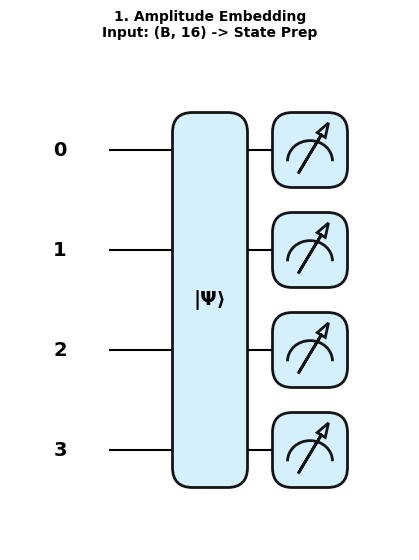

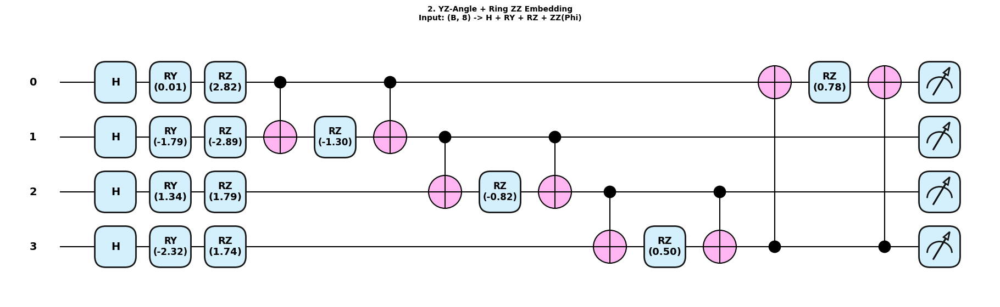

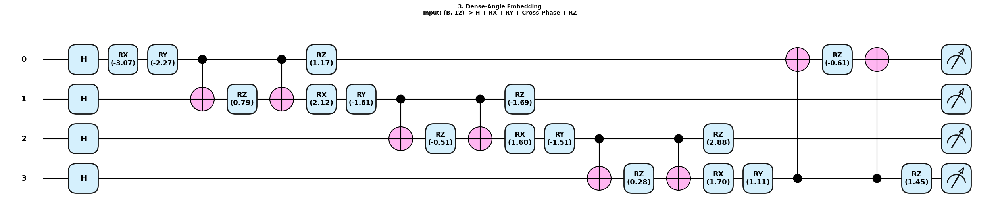

In [27]:
import pennylane as qml
import matplotlib.pyplot as plt
import torch
import numpy as np

# -------------------------------------------------------------
# ۱. پارامترهای منطبق بر فکتوری
# -------------------------------------------------------------
n_qubits = 4
amp_dim = 2 ** n_qubits  # 16
zz_scale = 0.25
dev = qml.device("default.qubit", wires=n_qubits)

# -------------------------------------------------------------
# ۲. مدارها (دقیقاً کپی لاجیک فکتوری شما)
# -------------------------------------------------------------

# [1] Mode: Amplitude
@qml.qnode(dev)
def draw_amplitude():
    feats = torch.randn(amp_dim)
    qml.AmplitudeEmbedding(features=feats, wires=range(n_qubits), normalize=True, pad_with=0.0)
    return [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]


# [2] Mode: ZZ (Layer 0 Encoding)
@qml.qnode(dev)
def draw_zz():
    raw = torch.randn(2 * n_qubits)
    raw = (raw - raw.mean()) / (raw.std() + 1e-6)

    angles_y = (torch.tanh(raw[:n_qubits]) * np.pi).tolist()
    angles_z = (torch.tanh(raw[n_qubits:]) * np.pi).tolist()

    # Superposition اول مدار
    for q in range(n_qubits):
        qml.Hadamard(wires=q)

    # تک‌کیوبیتی
    for q in range(n_qubits):
        qml.RY(angles_y[q], wires=q)
        qml.RZ(angles_z[q], wires=q)

    # تعامل Data-dependent Ring ZZ
    for q in range(n_qubits):
        j = (q + 1) % n_qubits
        phi = float(zz_scale * angles_z[q] * angles_z[j] / np.pi)
        qml.CNOT(wires=[q, j])
        qml.RZ(2.0 * phi, wires=j)
        qml.CNOT(wires=[q, j])

    return [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]


# [3] Mode: Dense-Angle (Layer 0 Encoding)
@qml.qnode(dev)
def draw_dense_angle():
    chunk = torch.randn(3 * n_qubits)
    chunk = (chunk - chunk.mean()) / (chunk.std() + 1e-6)

    angles_y = (torch.tanh(chunk[:n_qubits]) * np.pi).tolist()
    angles_z = (torch.tanh(chunk[n_qubits:2*n_qubits]) * np.pi).tolist()
    angles_x = (torch.tanh(chunk[2*n_qubits:]) * np.pi).tolist()

    # Superposition اول مدار
    for q in range(n_qubits):
        qml.Hadamard(wires=q)

    for q in range(n_qubits):
        qml.RX(angles_x[q], wires=q)
        qml.RY(angles_y[q], wires=q)
        j = (q + 1) % n_qubits

        phi = float(zz_scale * angles_x[q] * angles_y[j] / np.pi)

        qml.CNOT(wires=[q, j])
        qml.RZ(2.0 * phi, wires=j)
        qml.CNOT(wires=[q, j])
        qml.RZ(angles_z[q], wires=q)  # روی سیم q

    return [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]

# -------------------------------------------------------------
# ۳. رسم مستقیم در ژوپیتر
# -------------------------------------------------------------
circuits = [
    (draw_amplitude, "1. Amplitude Embedding", f"Input: (B, {amp_dim}) -> State Prep"),
    (draw_zz, "2. YZ-Angle + Ring ZZ Embedding", f"Input: (B, {2*n_qubits}) -> H + RY + RZ + ZZ(Phi)"),
    (draw_dense_angle, "3. Dense-Angle Embedding", f"Input: (B, {3*n_qubits}) -> H + RX + RY + Cross-Phase + RZ")
]

for circ_fn, title, subtitle in circuits:
    fig, ax = qml.draw_mpl(circ_fn, decimals=2, style="pennylane", show_all_wires=True)()
    fig.suptitle(f"{title}\n{subtitle}", fontsize=10, fontweight="bold", y=1.08)
    plt.show()



================ Generating Embedding Figures ================


C:\Users\Acer\AppData\Local\Temp\ipykernel_7160\2752551798.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Standalone saved → embedding_1_amplitude.(png/pdf)


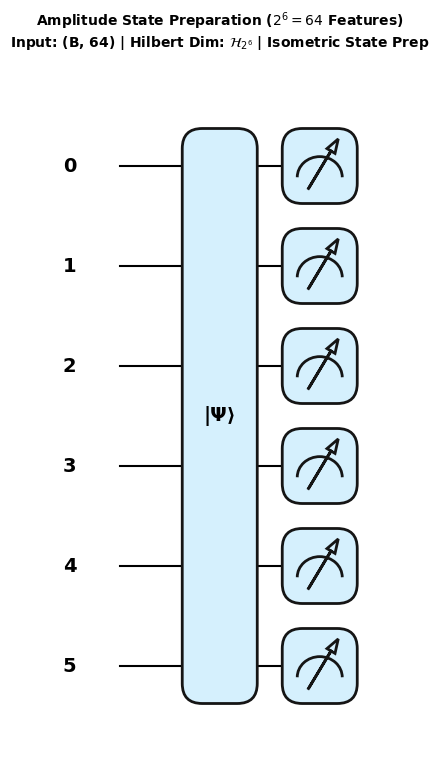

C:\Users\Acer\AppData\Local\Temp\ipykernel_7160\2752551798.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Standalone saved → embedding_2_yz_angle.(png/pdf)


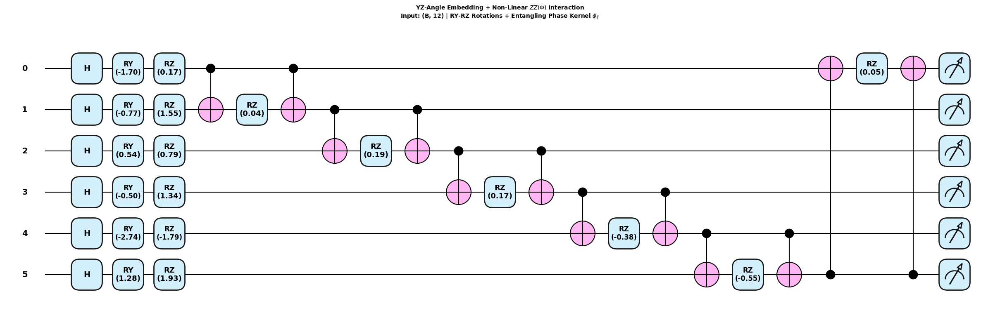

C:\Users\Acer\AppData\Local\Temp\ipykernel_7160\2752551798.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Standalone saved → embedding_3_dense_angle.(png/pdf)


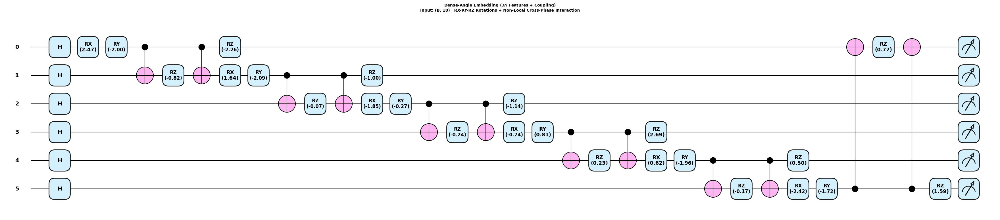


=== Generating Unified Embedding Comparison Panel ===
✓ Master panel saved → embedding_comparison_panel.png & embedding_comparison_panel.pdf


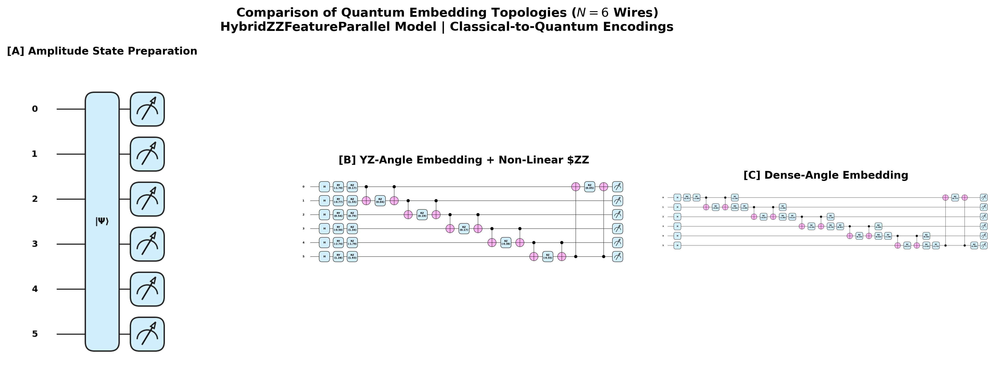


Hybrid Parallel Quantum Architecture — Embedding Dimension & Complexity Map
Number of Qubits (N)         : 6
Hilbert Space Dimension (2^N): 64
Parallel Quantum Heads (P)   : 3
ZZ Interaction Scaling       : 0.25

Encoding Theoretical Breakdown:
-------------------------------------------------------------------------------
1. Amplitude Embedding:
   - Input Vector Size       : (B, 64)
   - State Representation    : |x> = \sum_{i=0}^{2^N-1} x_i |i>
   - Parameter Efficiency    : Exponential compression O(2^N) per head.

2. YZ-Angle + ZZ Entanglement:
   - Input Vector Size       : (B, 12) [or (B, 3, 12) with re-upload]
   - Rotation Structure      : RY(\theta_y) -> RZ(\theta_z)
   - Two-Qubit Phase Coupling: exp(-i \cdot s \cdot \frac{\theta_{z,q} \theta_{z,j}}{\pi} Z_q Z_j)

3. Dense-Angle Embedding:
   - Input Vector Size       : (B, 18) [or (B, 3, 18) with re-upload]
   - Rotation Structure      : RX(\theta_x) -> RY(\theta_y) -> RZ(\theta_z)
   - Coupling Topology       : Cross-feat

In [25]:
# نمایش در ژوپیتر نوت‌بوک و ذخیره همزمان فایل‌ها
generate_embedding_figures(cfg, show=True)

# فقط ذخیره فایل‌ها در دایرکتوری (بدون نمایش در خروجی سلول ژوپیتر)
# generate_embedding_figures(cfg, show=False)



=== Amplitude Embedding ===


C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_amplitude_ring


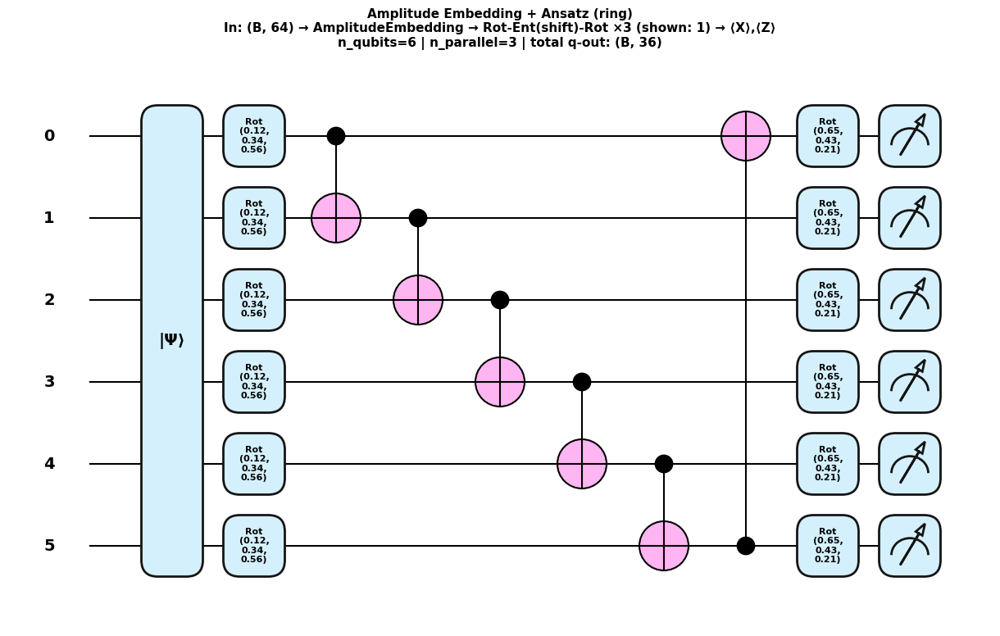

C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_amplitude_pairwise


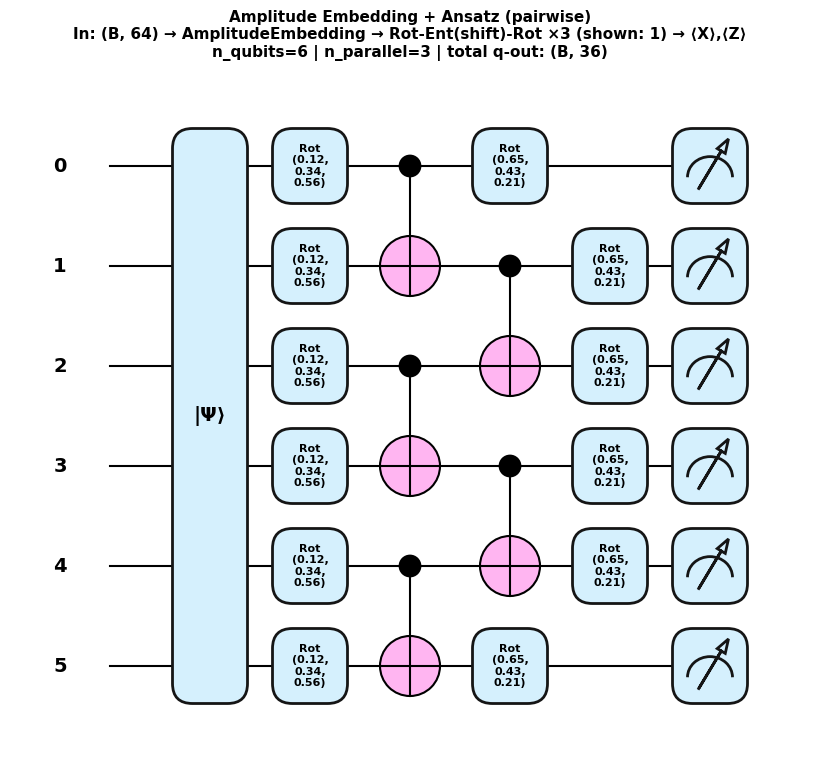

C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_amplitude_ring_skip


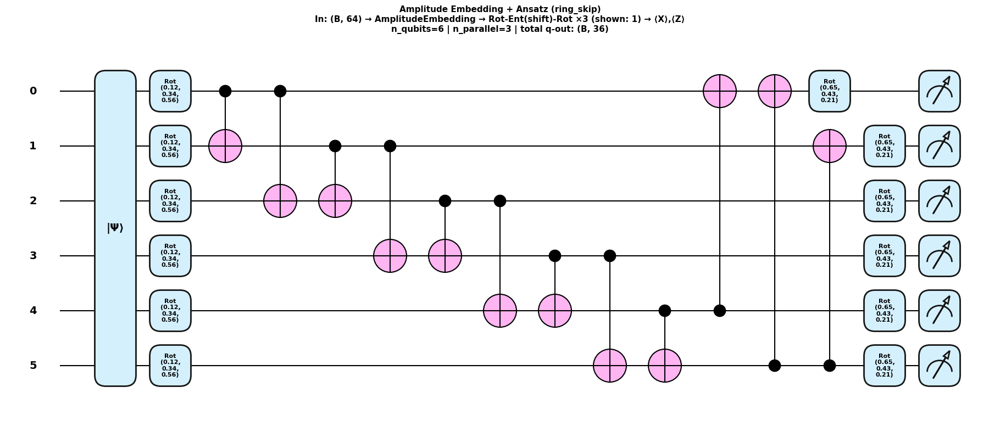


=== ZZ Feature Map ===


C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_zz_ring


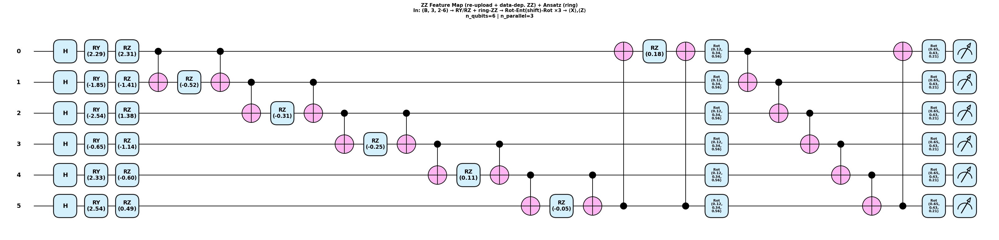

C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_zz_pairwise


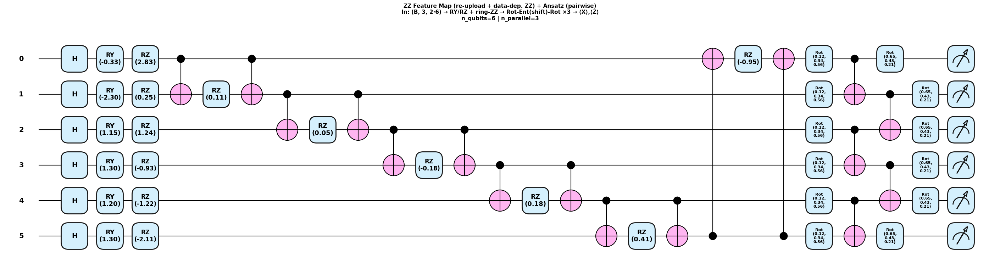

C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_zz_ring_skip


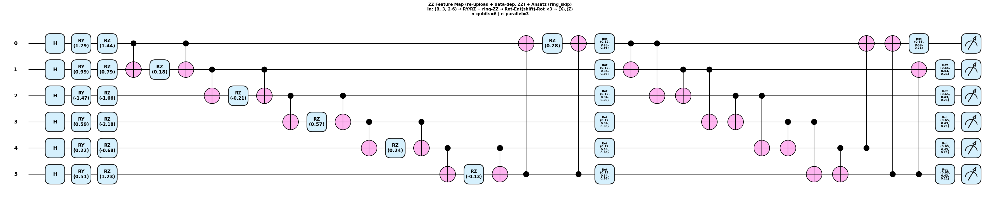


=== Dense-Angle Embedding ===


C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_dense_angle_ring


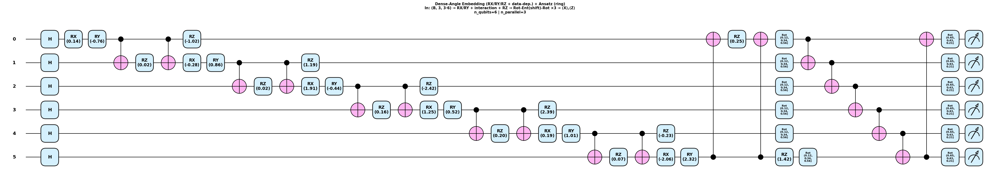

C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_dense_angle_pairwise


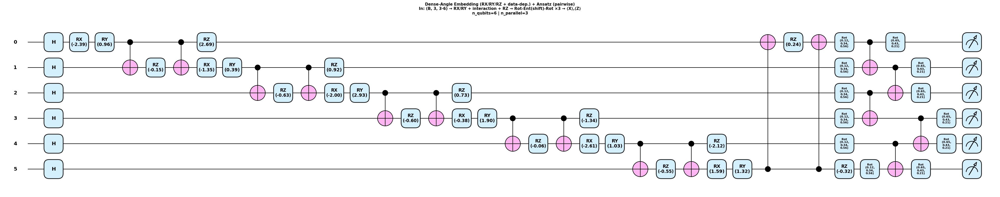

C:\Users\Acer\AppData\Local\Temp\ipykernel_24980\3674524714.py:109: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


✓ Saved → circuit_dense_angle_ring_skip


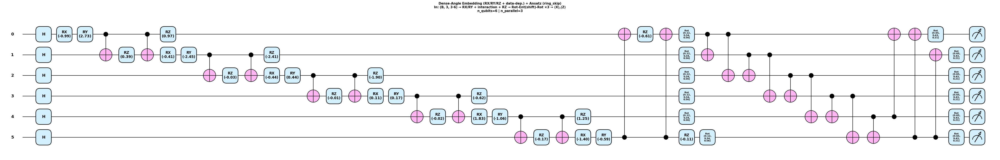


=== Entanglement Comparison (side-by-side) ===
✓ Saved → circuit_entangle_comparison


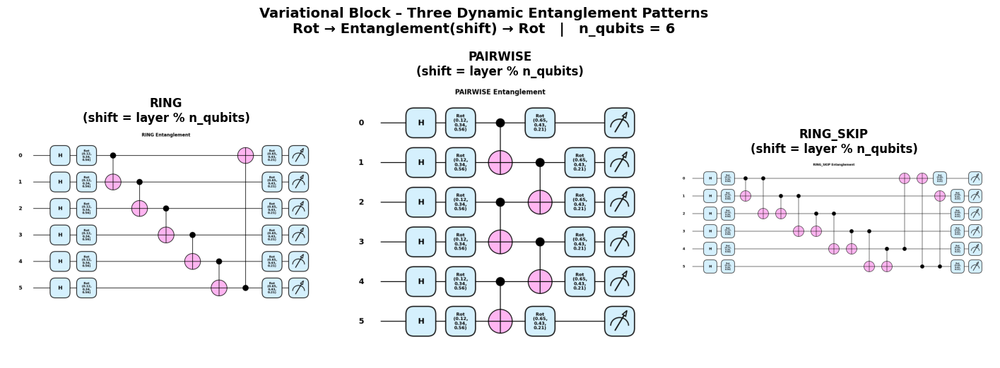


Hybrid Parallel QNN — Dimension Map (exact match to HybridQNodeFactory)
Input image                : (B, C, 32, 32)
Classical backbone         : (B, 64)

Per-head quantum input
  amplitude                : (B, 64)
  zz                       : (B, 3, 2·6)
  dense_angle              : (B, 3, 3·6)

Ansatz (each layer)        : Rot → Entanglement(shift = layer % n_qubits) → Rot
Entanglement patterns      : ring | pairwise | ring_skip
                             (selected by head_idx % 3)
Layers                     : 3
Parallel heads             : 3

Measurement per qubit      : ⟨X⟩, ⟨Z⟩
Per-head output            : (B, 12)
Concatenated quantum feats : (B, 36)
Classifier                 : Linear(36 → … → num_classes)

✓ Saved dimension summary → results_hybrid_parallel\figures\circuits\dimensions.txt

All figures saved in: results_hybrid_parallel\figures\circuits


In [29]:
generate_circuit_figures(cfg)

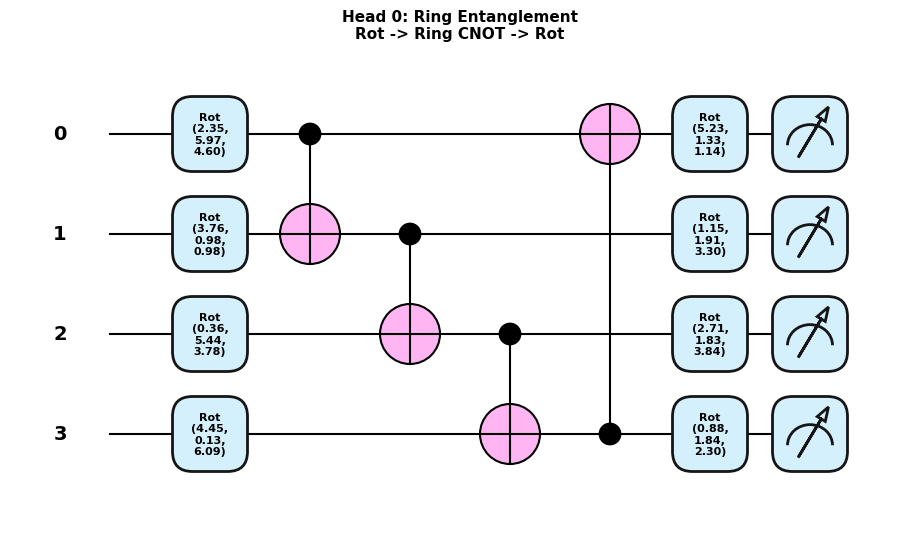

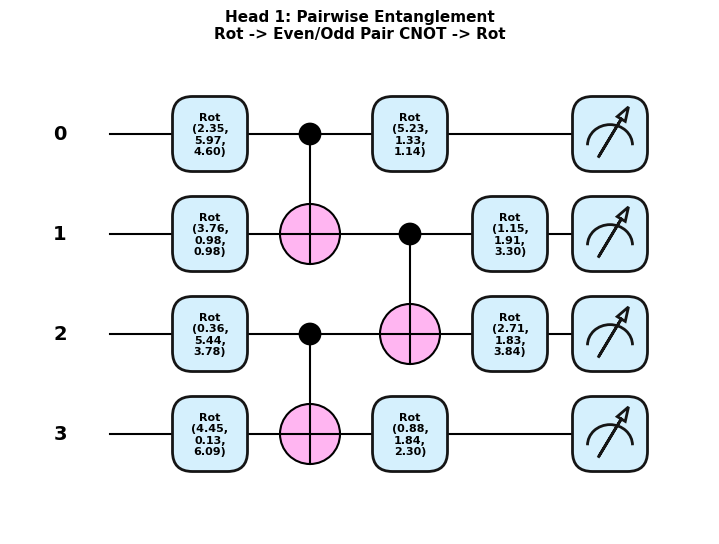

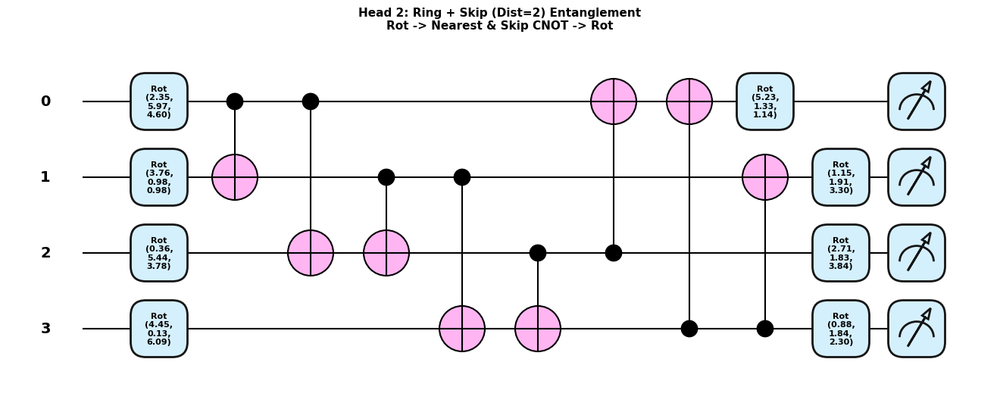

In [29]:
import pennylane as qml
import matplotlib.pyplot as plt
import numpy as np

# =========================================================
# ۱. الگوهای درهم‌تنیدگی دقیقاً مطابق سورس شما
# =========================================================

def ring_entanglement(n_qubits, shift=0):
    """Circular / Ring – با پشتیبانی از شیفت داینامیک"""
    for q in range(n_qubits):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])


def pairwise_entanglement(n_qubits, shift=0):
    """Pairwise – با پشتیبانی از شیفت داینامیک"""
    # لایه اول: زوج‌ها
    for q in range(0, n_qubits - 1, 2):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])
    # لایه دوم: فردها
    for q in range(1, n_qubits - 1, 2):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])


def ring_skip_entanglement(n_qubits, shift=0):
    """Circular + long-range skip (فاصله ۲) – با پشتیبانی از شیفت داینامیک"""
    for q in range(n_qubits):
        src = q
        tgt1 = (q + 1 + shift) % n_qubits
        tgt2 = (q + 2 + shift) % n_qubits
        if src != tgt1:
            qml.CNOT(wires=[src, tgt1])
        if src != tgt2:
            qml.CNOT(wires=[src, tgt2])

ENTANGLEMENT_PATTERNS = [
    (ring_entanglement, "Head 0: Ring Entanglement", "Rot -> Ring CNOT -> Rot"),
    (pairwise_entanglement, "Head 1: Pairwise Entanglement", "Rot -> Even/Odd Pair CNOT -> Rot"),
    (ring_skip_entanglement, "Head 2: Ring + Skip (Dist=2) Entanglement", "Rot -> Nearest & Skip CNOT -> Rot"),
]

# =========================================================
# ۲. پارامترهای مدار برای رسم
# =========================================================
n_qubits = 4
n_layers = 1      # تعداد لایه‌های واریانسانی برای نمایش شماتیک
dev = qml.device("default.qubit", wires=n_qubits)

# وزن‌های رندوم شبیه‌سازی شده: شکل (n_layers, 2, n_qubits, 3)
np.random.seed(42)
weights = np.random.uniform(0, 2 * np.pi, size=(n_layers, 2, n_qubits, 3)).tolist()

# =========================================================
# ۳. ساخت و رسم مدارهای آنساتز برای هر سه Head
# =========================================================
for head_idx, (entangle_fn, title, subtitle) in enumerate(ENTANGLEMENT_PATTERNS):

    @qml.qnode(dev)
    def ansatz_circuit():
        for layer in range(n_layers):
            # ۱. Rotation اول
            for q in range(n_qubits):
                qml.Rot(
                    weights[layer][0][q][0],
                    weights[layer][0][q][1],
                    weights[layer][0][q][2],
                    wires=q,
                )

            # ۲. Entanglement داینامیک بر اساس لایه
            current_shift = layer % n_qubits
            entangle_fn(n_qubits, shift=current_shift)

            # ۳. Rotation دوم
            for q in range(n_qubits):
                qml.Rot(
                    weights[layer][1][q][0],
                    weights[layer][1][q][1],
                    weights[layer][1][q][2],
                    wires=q,
                )

        # اندازه‌گیری مطابق سورس فکتوری (<X> و <Z>)
        return (
            [qml.expval(qml.PauliX(q)) for q in range(n_qubits)]
            + [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]
        )

    # رسم با استایل استاندارد پنی‌لین
    fig, ax = qml.draw_mpl(ansatz_circuit, decimals=2, style="pennylane", show_all_wires=True)()
    fig.suptitle(f"{title}\n{subtitle}", fontsize=11, fontweight="bold", y=1.05)
    plt.show()


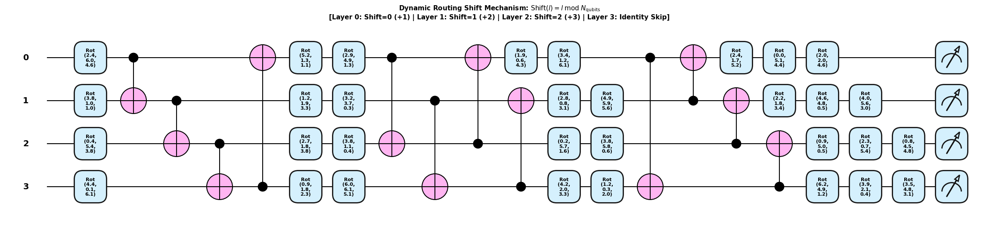

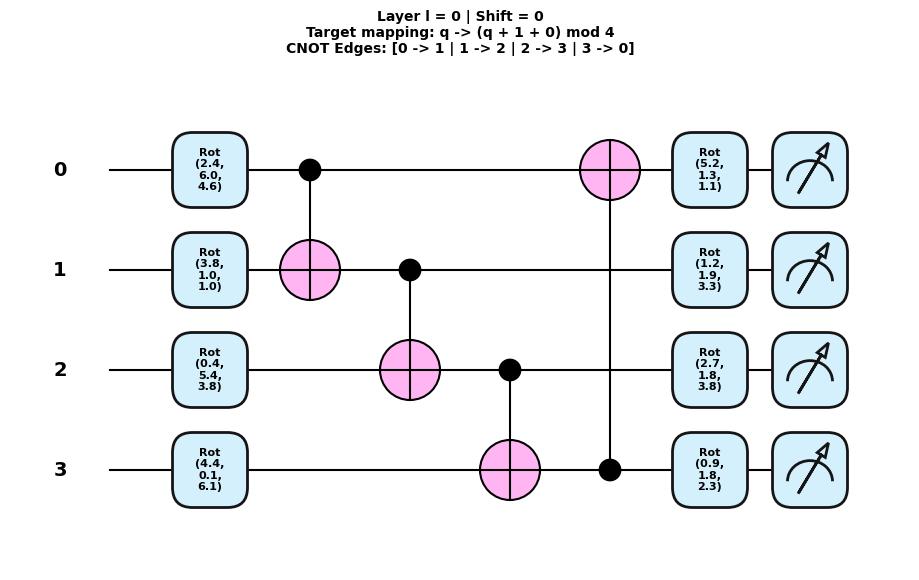

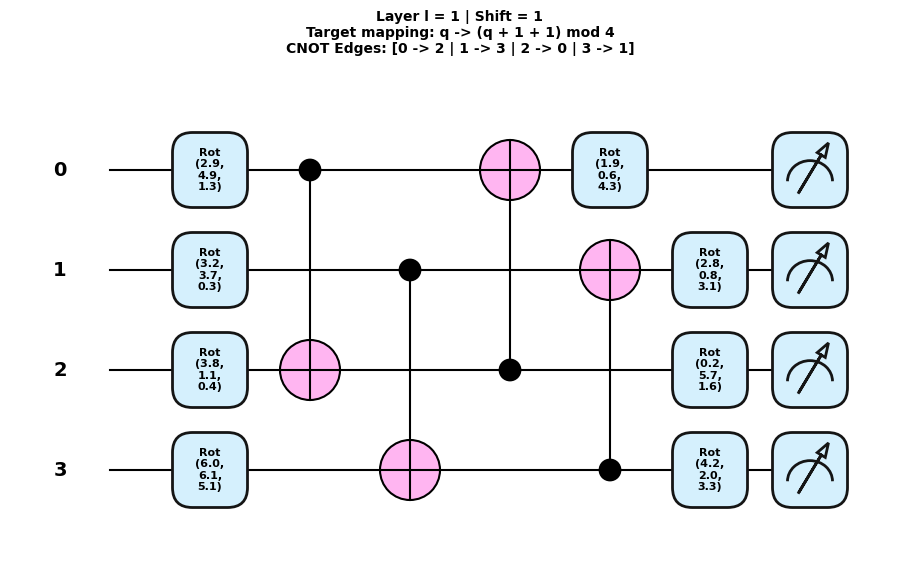

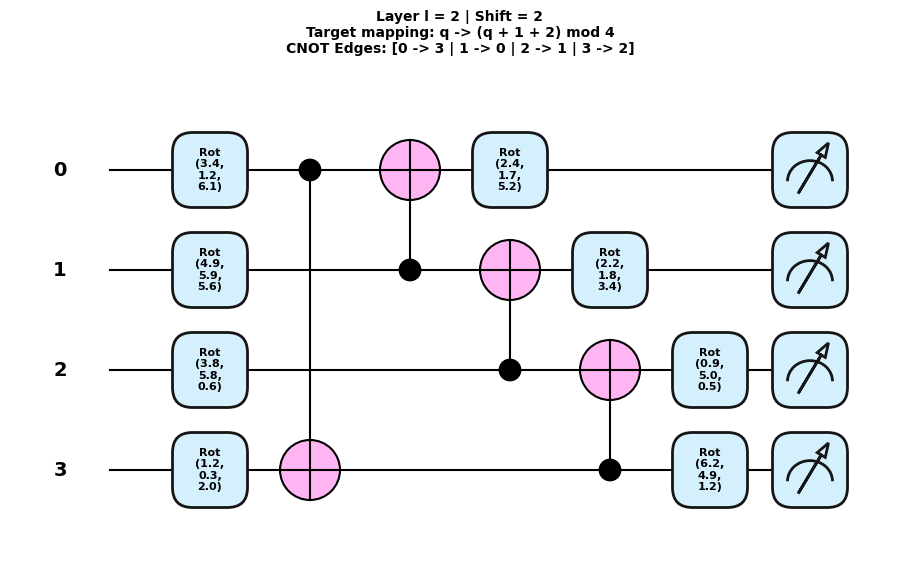

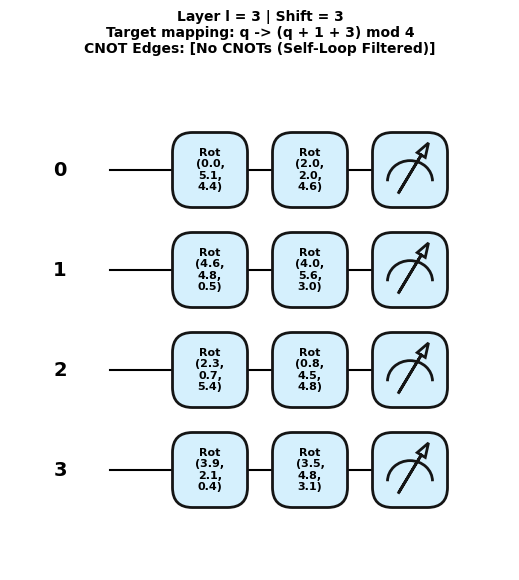

In [31]:
import pennylane as qml
import matplotlib.pyplot as plt
import numpy as np

# =========================================================
# ۱. الگوی Ring با Dynamic Routing Shift (سورس شما)
# =========================================================
def ring_entanglement(n_qubits, shift=0):
    """Circular / Ring با شیفت داینامیک"""
    for q in range(n_qubits):
        src = q
        tgt = (q + 1 + shift) % n_qubits
        if src != tgt:
            qml.CNOT(wires=[src, tgt])

# =========================================================
# ۲. مشخصات سیستم
# =========================================================
n_qubits = 4
n_layers = 4  # ۴ لایه متوالی برای نمایش یک دور کاملِ شیفت (Shift = 0, 1, 2, 3)
dev = qml.device("default.qubit", wires=n_qubits)

# تولید وزن‌های رندوم شبیه‌سازی‌شده (Rot1 و Rot2)
np.random.seed(42)
weights = np.random.uniform(0, 2 * np.pi, size=(n_layers, 2, n_qubits, 3)).tolist()

# =========================================================
# ۳. مدار کامل چندلایه با شیفت داینامیک: shift = layer % n_qubits
# =========================================================
@qml.qnode(dev)
def dynamic_routing_circuit():
    for layer in range(n_layers):
        # 1. Rotation اول
        for q in range(n_qubits):
            qml.Rot(
                weights[layer][0][q][0],
                weights[layer][0][q][1],
                weights[layer][0][q][2],
                wires=q,
            )

        # 2. Dynamic Routing Entanglement: شیفت لایه‌ای
        current_shift = layer % n_qubits
        ring_entanglement(n_qubits, shift=current_shift)

        # 3. Rotation دوم
        for q in range(n_qubits):
            qml.Rot(
                weights[layer][1][q][0],
                weights[layer][1][q][1],
                weights[layer][1][q][2],
                wires=q,
            )

    # اندازه‌گیری‌های نهایی (<X> و <Z>)
    return (
        [qml.expval(qml.PauliX(q)) for q in range(n_qubits)]
        + [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]
    )

# =========================================================
# ۴. رسم مدار پیوسته
# =========================================================
fig, ax = qml.draw_mpl(dynamic_routing_circuit, decimals=1, style="pennylane", show_all_wires=True)()
fig.suptitle(
    r"Dynamic Routing Shift Mechanism: $\mathrm{Shift}(l) = l \;\mathrm{mod}\; N_{\mathrm{qubits}}$"
    "\n[Layer 0: Shift=0 (+1) | Layer 1: Shift=1 (+2) | Layer 2: Shift=2 (+3) | Layer 3: Identity Skip]",
    fontsize=11,
    fontweight="bold",
    y=1.05
)
plt.show()

# =========================================================
# ۵. رسم تفکیک‌شده لایه به لایه (برای مقایسه دقیق اتصالات)
# =========================================================
for layer_idx in range(n_qubits):
    current_shift = layer_idx % n_qubits

    @qml.qnode(dev)
    def single_layer_circuit():
        # Rot 1
        for q in range(n_qubits):
            qml.Rot(weights[layer_idx][0][q][0], weights[layer_idx][0][q][1], weights[layer_idx][0][q][2], wires=q)

        # Entanglement با شیفت لایه
        ring_entanglement(n_qubits, shift=current_shift)

        # Rot 2
        for q in range(n_qubits):
            qml.Rot(weights[layer_idx][1][q][0], weights[layer_idx][1][q][1], weights[layer_idx][1][q][2], wires=q)

        return [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]

    fig, ax = qml.draw_mpl(single_layer_circuit, decimals=1, style="pennylane", show_all_wires=True)()

    # محاسبه اتصالات جهت درج در تایتل
    connections = [f"{q} -> {(q + 1 + current_shift) % n_qubits}" for q in range(n_qubits) if q != (q + 1 + current_shift) % n_qubits]
    conn_str = " | ".join(connections) if connections else "No CNOTs (Self-Loop Filtered)"

    fig.suptitle(
        f"Layer l = {layer_idx} | Shift = {current_shift}\n"
        f"Target mapping: q -> (q + 1 + {current_shift}) mod {n_qubits}\n"
        f"CNOT Edges: [{conn_str}]",
        fontsize=10,
        fontweight="bold",
        y=1.12
    )
    plt.show()


Matplotlib is building the font cache; this may take a moment.


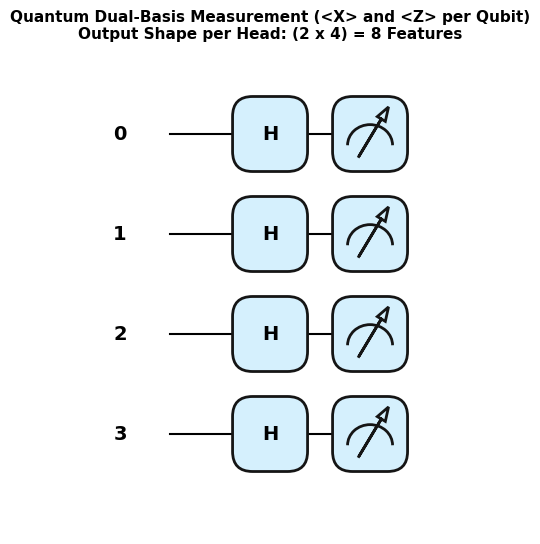

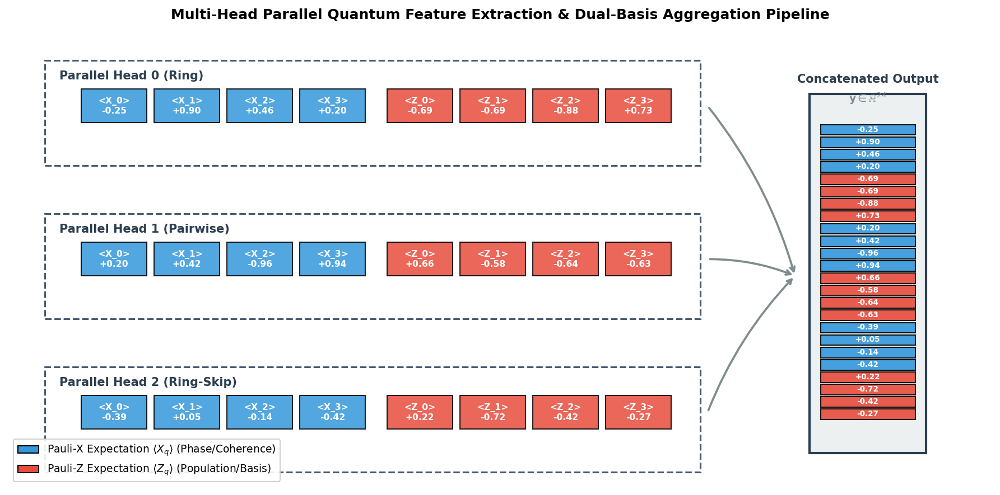

In [32]:
import pennylane as qml
import matplotlib.pyplot as plt
import numpy as np

# =========================================================
# ۱. مشخصات معماری
# =========================================================
n_qubits = 4
n_heads = 3  # تعداد هدهای موازی (Ring, Pairwise, Ring-Skip)
dev = qml.device("default.qubit", wires=n_qubits)

# =========================================================
# ۲. مدار کوانتومی با نمایش بصری هر دو اندازه‌گیری X و Z
# =========================================================
@qml.qnode(dev)
def measurement_circuit():
    # یک لایه ساده به عنوان نمونه
    for q in range(n_qubits):
        qml.Hadamard(wires=q)
    
    # اندازه‌گیری‌های دوگانه فکتوری: ابتدا PauliX سپس PauliZ
    return (
        [qml.expval(qml.PauliX(q)) for q in range(n_qubits)]
        + [qml.expval(qml.PauliZ(q)) for q in range(n_qubits)]
    )

fig, ax = qml.draw_mpl(measurement_circuit, decimals=1, style="pennylane", show_all_wires=True)()
fig.suptitle(
    f"Quantum Dual-Basis Measurement (<X> and <Z> per Qubit)\nOutput Shape per Head: (2 x {n_qubits}) = {2*n_qubits} Features",
    fontsize=11,
    fontweight="bold",
    y=1.05
)
plt.show()

# =========================================================
# ۳. نمودار تحلیلی مقالاتی: پایپ‌لاین تجمیع ویژگی‌ها (Feature Aggregation)
# =========================================================
fig, ax = plt.subplots(figsize=(12, 6), dpi=150)
ax.set_facecolor("#fafafa")

# شبیه‌سازی داده‌های خروجی هدها (Mock Measurement Expectation Values)
np.random.seed(42)
head_outputs = [np.random.uniform(-1, 1, size=2 * n_qubits) for _ in range(n_heads)]
head_names = ["Head 0 (Ring)", "Head 1 (Pairwise)", "Head 2 (Ring-Skip)"]
colors_x = ["#3498db", "#2980b9", "#1f618d"]
colors_z = ["#e74c3c", "#c0392b", "#922b21"]

# رسم بلاک‌های هدهای موازی
for h in range(n_heads):
    y_base = (n_heads - 1 - h) * 3.2
    
    # کادر دور هر هد
    rect = plt.Rectangle((-0.5, y_base - 0.9), 9.0, 2.2, fill=True, facecolor="#ffffff",
                         edgecolor="#34495e", linewidth=1.5, linestyle="--", alpha=0.9, zorder=1)
    ax.add_patch(rect)
    ax.text(-0.3, y_base + 0.9, f"Parallel {head_names[h]}", fontsize=10, fontweight="bold", color="#2c3e50")

    # کامپوننت‌های <X>
    for q in range(n_qubits):
        val = head_outputs[h][q]
        box = plt.Rectangle((q * 1.0, y_base), 0.9, 0.7, facecolor="#3498db", edgecolor="black", alpha=0.85, zorder=2)
        ax.add_patch(box)
        ax.text(q * 1.0 + 0.45, y_base + 0.35, f"<X_{q}>\n{val:+.2f}", ha="center", va="center", fontsize=7.5, color="white", weight="bold")

    # کامپوننت‌های <Z>
    for q in range(n_qubits):
        val = head_outputs[h][n_qubits + q]
        box = plt.Rectangle(((q + 4.2) * 1.0, y_base), 0.9, 0.7, facecolor="#e74c3c", edgecolor="black", alpha=0.85, zorder=2)
        ax.add_patch(box)
        ax.text((q + 4.2) * 1.0 + 0.45, y_base + 0.35, f"<Z_{q}>\n{val:+.2f}", ha="center", va="center", fontsize=7.5, color="white", weight="bold")

    # فلش به سمت بردار تجمیع
    ax.annotate("", xy=(9.8, 3.2), xytext=(8.6, y_base + 0.35),
                arrowprops=dict(arrowstyle="->", lw=1.8, color="#7f8c8d", connectionstyle="arc3,rad=-0.1"))

# رسم بردار تجمیع نهایی (Concatenated Global Feature Vector)
concat_vector = np.concatenate(head_outputs)
total_dim = len(concat_vector)

concat_rect = plt.Rectangle((10.0, -0.5), 1.6, 7.5, fill=True, facecolor="#ecf0f1",
                            edgecolor="#2c3e50", linewidth=2.0, zorder=2)
ax.add_patch(concat_rect)
ax.text(10.8, 7.3, "Concatenated Output", ha="center", va="center", fontsize=10, fontweight="bold", color="#2c3e50")
ax.text(10.8, 6.9, rf"$\mathbf{{y}} \in \mathbb{{R}}^{{{total_dim}}}$", ha="center", va="center", fontsize=9, color="#7f8c8d")

# رسم درایه‌های داخل بردار نهایی
n_boxes = total_dim
box_h = 6.2 / n_boxes
for i in range(n_boxes):
    col = "#3498db" if (i % (2 * n_qubits)) < n_qubits else "#e74c3c"
    v_box = plt.Rectangle((10.15, 6.4 - (i + 1) * box_h), 1.3, box_h * 0.85,
                          facecolor=col, edgecolor="black", alpha=0.9, zorder=3)
    ax.add_patch(v_box)
    ax.text(10.8, 6.4 - (i + 0.55) * box_h, f"{concat_vector[i]:+.2f}",
            ha="center", va="center", fontsize=6.5, color="white", weight="bold")

# راهنما و مقیاس‌ها
ax.set_xlim(-1, 12.5)
ax.set_ylim(-1.2, 8.2)
ax.axis("off")

# افزودن Legend
legend_elements = [
    plt.Rectangle((0, 0), 1, 1, facecolor="#3498db", edgecolor="black", label=r"Pauli-X Expectation $\langle X_q \rangle$ (Phase/Coherence)"),
    plt.Rectangle((0, 0), 1, 1, facecolor="#e74c3c", edgecolor="black", label=r"Pauli-Z Expectation $\langle Z_q \rangle$ (Population/Basis)")
]
ax.legend(handles=legend_elements, loc="lower left", fontsize=9, frameon=True, framealpha=0.9)

plt.title(r"Multi-Head Parallel Quantum Feature Extraction & Dual-Basis Aggregation Pipeline",
          fontsize=12, fontweight="bold", pad=15)
plt.tight_layout()
plt.show()


C:\Users\Acer\AppData\Local\Temp\ipykernel_4348\2042344911.py:237: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


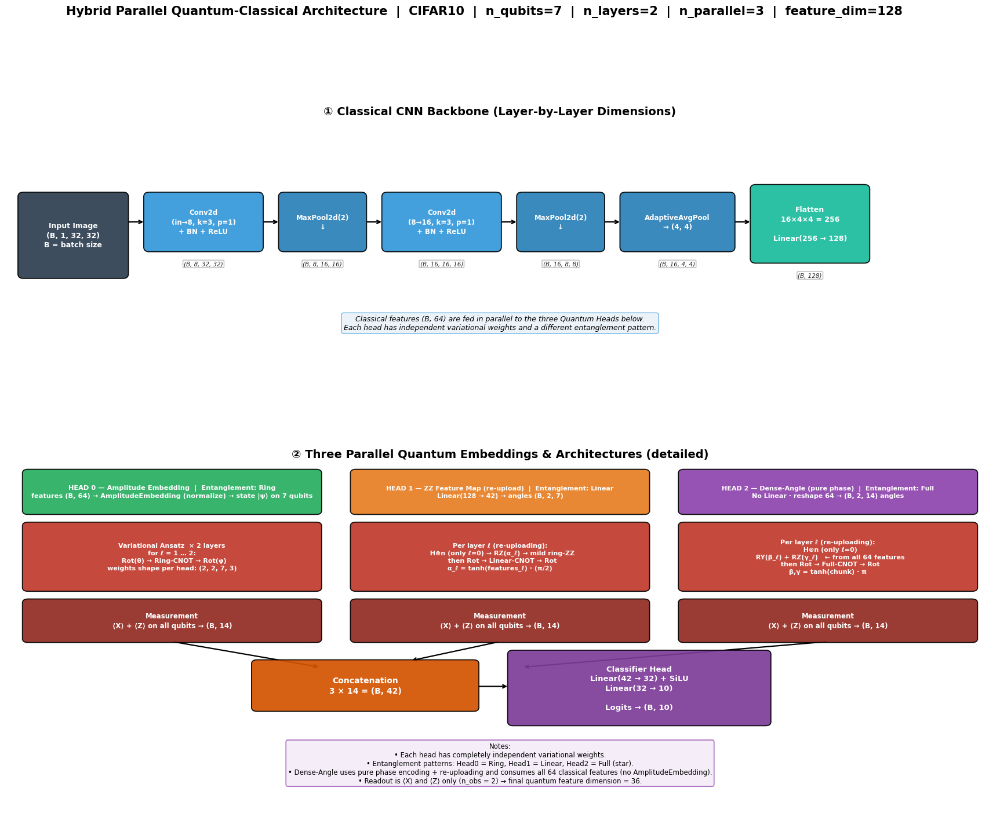

✅ Saved: architecture_detailed_three_embeddings.png / .pdf


In [23]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Rectangle
from pathlib import Path
import numpy as np

# ====================== تنظیمات ======================
fig_dir = Path(cfg.save_dir) / "figures" / "architecture"
fig_dir.mkdir(parents=True, exist_ok=True)

n_qubits   = cfg.n_qubits      # 6
n_layers   = cfg.n_q_layers   # 2
n_parallel = cfg.n_parallel   # 3
feature_dim = cfg.feature_dim # 64
num_classes = cfg.num_classes # 10
in_ch = 1                     # برای MNIST (اگر CIFAR بود ۳ بگذار)

# اندازه‌گیری واقعی مدل شما: X + Z  →  n_obs = 2
n_obs = 2
out_per_head = n_qubits * n_obs          # 12
out_total    = n_parallel * out_per_head # 36

# ====================== توابع کمکی ======================
def rounded_box(ax, x, y, w, h, text, facecolor, fontsize=8.5, 
                edgecolor="black", alpha=0.92, textcolor="white", weight="bold"):
    box = FancyBboxPatch(
        (x, y), w, h,
        boxstyle="round,pad=0.03,rounding_size=0.12",
        facecolor=facecolor, edgecolor=edgecolor,
        linewidth=1.3, alpha=alpha, zorder=3
    )
    ax.add_patch(box)
    ax.text(x + w/2, y + h/2, text, ha="center", va="center",
            fontsize=fontsize, fontweight=weight, color=textcolor,
            linespacing=1.35, zorder=4, wrap=True)

def simple_arrow(ax, x1, y1, x2, y2, color="black", lw=1.6):
    ax.annotate("", xy=(x2, y2), xytext=(x1, y1),
                arrowprops=dict(arrowstyle="->", color=color, lw=lw),
                zorder=2)

def dim_label(ax, x, y, text, fontsize=7.5, color="#222"):
    ax.text(x, y, text, ha="center", va="center",
            fontsize=fontsize, color=color, style="italic",
            bbox=dict(boxstyle="round,pad=0.15", facecolor="white",
                      edgecolor="#aaa", alpha=0.85), zorder=5)

# رنگ‌ها
C_INPUT   = "#2C3E50"
C_CONV    = "#3498DB"
C_POOL    = "#2980B9"
C_FC      = "#1ABC9C"
C_AMP     = "#27AE60"
C_ZZ      = "#E67E22"
C_DENSE   = "#8E44AD"
C_HEAD    = "#C0392B"
C_CONCAT  = "#D35400"
C_CLASS   = "#7D3C98"
C_BG      = "#F8F9F9"

# ====================== شکل اصلی ======================
fig = plt.figure(figsize=(22, 16), facecolor="white")
gs = fig.add_gridspec(2, 1, height_ratios=[1.05, 1.35], hspace=0.18)

# ------------------------------------------------------------
# پنل بالا: Classical Backbone (لایه‌به‌لایه با ابعاد)
# ------------------------------------------------------------
ax0 = fig.add_subplot(gs[0])
ax0.set_xlim(0, 22)
ax0.set_ylim(0, 7.5)
ax0.axis("off")
ax0.set_facecolor(C_BG)

ax0.text(11, 7.15, "① Classical CNN Backbone (Layer-by-Layer Dimensions)",
         ha="center", va="center", fontsize=14, fontweight="bold")

# Input
rounded_box(ax0, 0.3, 2.8, 2.4, 2.2,
            f"Input Image\n(B, {in_ch}, 32, 32)\nB = batch size",
            C_INPUT, fontsize=9)

# Conv1 block
rounded_box(ax0, 3.1, 3.5, 2.6, 1.5,
            "Conv2d\n(in→8, k=3, p=1)\n+ BN + ReLU",
            C_CONV, fontsize=8.5)
dim_label(ax0, 4.4, 3.15, "(B, 8, 32, 32)")

# MaxPool1
rounded_box(ax0, 6.1, 3.5, 1.9, 1.5,
            "MaxPool2d(2)\n↓",
            C_POOL, fontsize=8.5)
dim_label(ax0, 7.05, 3.15, "(B, 8, 16, 16)")

# Conv2 block
rounded_box(ax0, 8.4, 3.5, 2.6, 1.5,
            "Conv2d\n(8→16, k=3, p=1)\n+ BN + ReLU",
            C_CONV, fontsize=8.5)
dim_label(ax0, 9.7, 3.15, "(B, 16, 16, 16)")

# MaxPool2
rounded_box(ax0, 11.4, 3.5, 1.9, 1.5,
            "MaxPool2d(2)\n↓",
            C_POOL, fontsize=8.5)
dim_label(ax0, 12.35, 3.15, "(B, 16, 8, 8)")

# AdaptiveAvgPool
rounded_box(ax0, 13.7, 3.5, 2.5, 1.5,
            "AdaptiveAvgPool\n→ (4, 4)",
            C_POOL, fontsize=8.5)
dim_label(ax0, 14.95, 3.15, "(B, 16, 4, 4)")

# Flatten + Linear
rounded_box(ax0, 16.6, 3.2, 2.6, 2.0,
            f"Flatten\n16×4×4 = 256\n\nLinear(256 → {feature_dim})",
            C_FC, fontsize=9)
dim_label(ax0, 17.9, 2.85, f"(B, {feature_dim})")

# arrows
for x1, x2 in [(2.7, 3.1), (5.7, 6.1), (8.0, 8.4),
               (11.0, 11.4), (13.3, 13.7), (16.2, 16.6)]:
    simple_arrow(ax0, x1, 4.25, x2, 4.25)

# note under backbone
ax0.text(11, 1.6,
         "Classical features (B, 64) are fed in parallel to the three Quantum Heads below.\n"
         "Each head has independent variational weights and a different entanglement pattern.",
         ha="center", va="center", fontsize=9, style="italic",
         bbox=dict(boxstyle="round", facecolor="#EAF2F8", edgecolor="#5DADE2", alpha=0.9))

# ------------------------------------------------------------
# پنل پایین: سه معماری امبدینگ به صورت موازی
# ------------------------------------------------------------
ax1 = fig.add_subplot(gs[1])
ax1.set_xlim(0, 22)
ax1.set_ylim(0, 11.5)
ax1.axis("off")
ax1.set_facecolor(C_BG)

ax1.text(11, 11.15, "② Three Parallel Quantum Embeddings & Architectures (detailed)",
         ha="center", va="center", fontsize=14, fontweight="bold")

# ---------- Head 0 : Amplitude ----------
x0 = 0.4
rounded_box(ax1, x0, 9.3, 6.6, 1.35,
            f"HEAD 0 — Amplitude Embedding  |  Entanglement: Ring\n"
            f"features (B, 64) → AmplitudeEmbedding (normalize) → state |ψ⟩ on {n_qubits} qubits",
            C_AMP, fontsize=8.2)

# layers detail
rounded_box(ax1, x0, 6.9, 6.6, 2.1,
            f"Variational Ansatz  × {n_layers} layers\n"
            f"for ℓ = 1 … {n_layers}:\n"
            f"  Rot(θ) → Ring-CNOT → Rot(φ)\n"
            f"weights shape per head: ({n_layers}, 2, {n_qubits}, 3)",
            C_HEAD, fontsize=8)

rounded_box(ax1, x0, 5.3, 6.6, 1.3,
            f"Measurement\n"
            f"⟨X⟩ + ⟨Z⟩ on all qubits → (B, {out_per_head})",
            "#922B21", fontsize=8.5)

# ---------- Head 1 : ZZ ----------
x1 = 7.7
rounded_box(ax1, x1, 9.3, 6.6, 1.35,
            f"HEAD 1 — ZZ Feature Map (re-upload)  |  Entanglement: Linear\n"
            f"Linear({feature_dim} → {n_parallel*n_layers*n_qubits}) → angles (B, {n_layers}, {n_qubits})",
            C_ZZ, fontsize=8.0)

rounded_box(ax1, x1, 6.9, 6.6, 2.1,
            f"Per layer ℓ (re-uploading):\n"
            f"  H⊗n (only ℓ=0) → RZ(α_ℓ) → mild ring-ZZ\n"
            f"  then Rot → Linear-CNOT → Rot\n"
            f"α_ℓ = tanh(features_ℓ) · (π/2)",
            C_HEAD, fontsize=8)

rounded_box(ax1, x1, 5.3, 6.6, 1.3,
            f"Measurement\n"
            f"⟨X⟩ + ⟨Z⟩ on all qubits → (B, {out_per_head})",
            "#922B21", fontsize=8.5)

# ---------- Head 2 : Dense-Angle (pure phase + re-upload) ----------
x2 = 15.0
rounded_box(ax1, x2, 9.3, 6.6, 1.35,
            f"HEAD 2 — Dense-Angle (pure phase)  |  Entanglement: Full\n"
            f"No Linear · reshape 64 → (B, {n_layers}, {2*n_qubits}) angles",
            C_DENSE, fontsize=8.0)

rounded_box(ax1, x2, 6.9, 6.6, 2.1,
            f"Per layer ℓ (re-uploading):\n"
            f"  H⊗n (only ℓ=0)\n"
            f"  RY(β_ℓ) + RZ(γ_ℓ)   ← from all 64 features\n"
            f"  then Rot → Full-CNOT → Rot\n"
            f"β,γ = tanh(chunk) · π",
            C_HEAD, fontsize=8)

rounded_box(ax1, x2, 5.3, 6.6, 1.3,
            f"Measurement\n"
            f"⟨X⟩ + ⟨Z⟩ on all qubits → (B, {out_per_head})",
            "#922B21", fontsize=8.5)

# ---------- Concat + Classifier ----------
rounded_box(ax1, 5.5, 3.15, 5.0, 1.55,
            f"Concatenation\n"
            f"{n_parallel} × {out_per_head} = (B, {out_total})",
            C_CONCAT, fontsize=10)

rounded_box(ax1, 11.2, 2.7, 5.8, 2.3,
            f"Classifier Head\n"
            f"Linear({out_total} → 32) + SiLU\n"
            f"Linear(32 → {num_classes})\n\n"
            f"Logits → (B, {num_classes})",
            C_CLASS, fontsize=9.5)

# arrows from three heads to concat
simple_arrow(ax1, 3.7, 5.3, 7.0, 4.5)
simple_arrow(ax1, 11.0, 5.3, 9.0, 4.7)
simple_arrow(ax1, 18.3, 5.3, 11.5, 4.5)
simple_arrow(ax1, 10.5, 3.9, 11.2, 3.9)

# footer
ax1.text(11, 1.5,
         "Notes:\n"
         "• Each head has completely independent variational weights.\n"
         "• Entanglement patterns: Head0 = Ring, Head1 = Linear, Head2 = Full (star).\n"
         "• Dense-Angle uses pure phase encoding + re-uploading and consumes all 64 classical features (no AmplitudeEmbedding).\n"
         "• Readout is ⟨X⟩ and ⟨Z⟩ only (n_obs = 2) → final quantum feature dimension = 36.",
         ha="center", va="center", fontsize=8.5,
         bbox=dict(boxstyle="round", facecolor="#F5EEF8", edgecolor="#8E44AD", alpha=0.95))

# title کلی
fig.suptitle(
    f"Hybrid Parallel Quantum-Classical Architecture  |  "
    f"{cfg.dataset_name.upper()}  |  n_qubits={n_qubits}  |  "
    f"n_layers={n_layers}  |  n_parallel={n_parallel}  |  feature_dim={feature_dim}",
    fontsize=15, fontweight="bold", y=0.98
)

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(fig_dir / "architecture_detailed_three_embeddings.png", dpi=300, bbox_inches="tight")
fig.savefig(fig_dir / "architecture_detailed_three_embeddings.pdf", bbox_inches="tight")
plt.show()
print("✅ Saved: architecture_detailed_three_embeddings.png / .pdf")

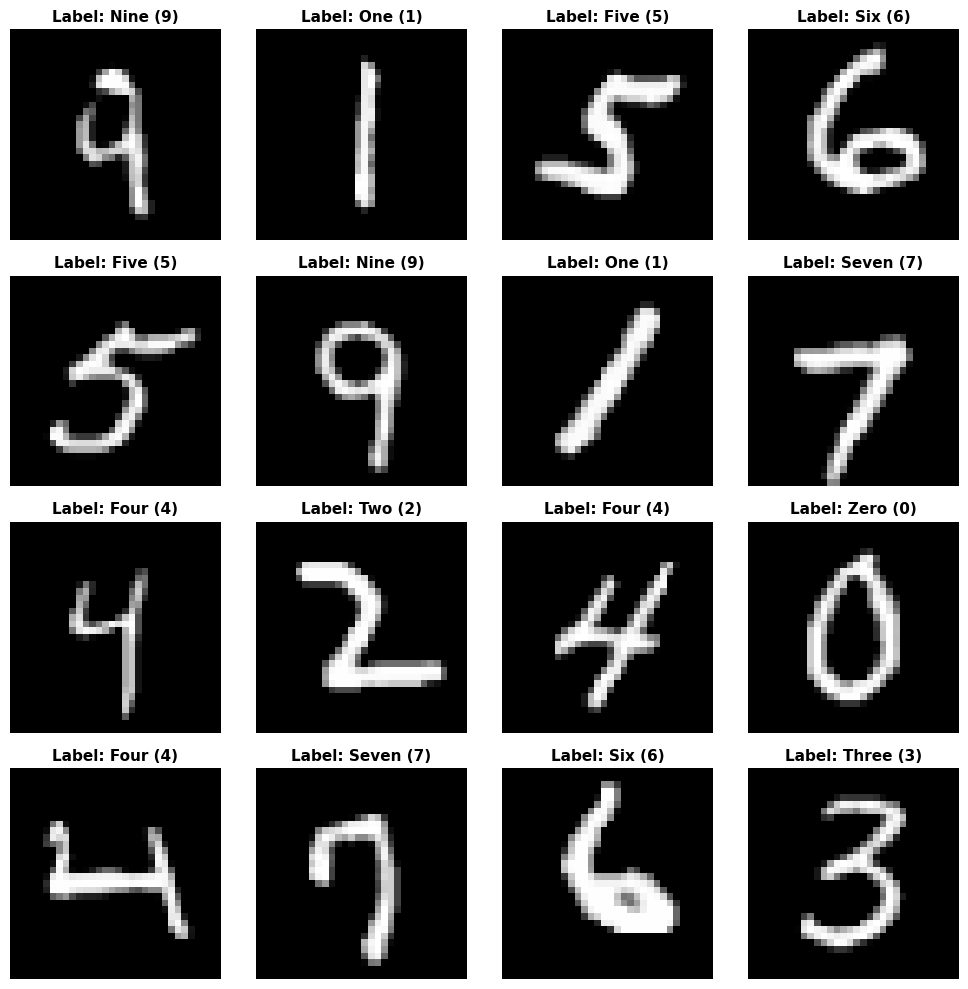

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# نام کلاس‌های MNIST (اعداد ۰ تا ۹)
class_names = ['Zero (0)', 'One (1)', 'Two (2)', 'Three (3)', 'Four (4)',
               'Five (5)', 'Six (6)', 'Seven (7)', 'Eight (8)', 'Nine (9)']

# استخراج اولین بچ از DataLoader
image, labels = next(iter(train_loader))
n_show = min(16, image.size(0)) 
cols = 4 
rows = int(np.ceil(n_show / cols))

# مقادیر نرمالایز استاندارد MNIST
mean = torch.tensor([0.1307]).view(1, 1, 1)
std  = torch.tensor([0.3081]).view(1, 1, 1)

fig, axes = plt.subplots(rows, cols, figsize=(10, 2.5 * rows))
axes = np.array(axes).reshape(-1)

for i in range(n_show):
    img = image[i].detach().cpu()
    
    # Denormalize و Clamp بین 0 و 1
    img = img * std + mean
    img = img.clamp(0, 1)
    
    # تبدیل به (H, W) برای تصویر تک‌کاناله
    img = img.squeeze().numpy()
    
    label_id = labels[i].item()
    label_name = class_names[label_id] if label_id < len(class_names) else str(label_id)
    
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f"Label: {label_name}", fontsize=11, fontweight='bold')
    axes[i].axis("off")
    
for j in range(n_show, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [79]:
name = "HybridAmplitudeParallel"

model = HybridAmplitudeParallelModel(in_channels, cfg).to(DEVICE)
optimizer = OptimizerFactory.build_optimizer(model, cfg)
scheduler = OptimizerFactory.build_scheduler(optimizer, cfg)

history_amp, best_state_amp = train_one_model(
    name=name,
    model=model,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
    patience=4,        # بعد از ۵ epoch بدون پیشرفت متوقف شود
    min_delta=1e-4     # حداقل بهبود معنادار
)

test_result_amp = evaluate_one_model_on_test(
    name=name,
    model=model,
    best_state=best_state_amp,
    test_loader=test_loader,
    cfg=cfg,
    device=DEVICE
)



[HybridAmplitudeParallel] Epoch [1/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | Progress= 20% | loss=1.8753 | acc=0.5694 | time=11.4s
    Train Part 2/5 | Batch 136/338 | Progress= 40% | loss=1.5481 | acc=0.6953 | time=21.9s
    Train Part 3/5 | Batch 203/338 | Progress= 60% | loss=1.3117 | acc=0.7619 | time=32.0s
    Train Part 4/5 | Batch 271/338 | Progress= 80% | loss=1.1326 | acc=0.8027 | time=42.4s
    Train Part 5/5 | Batch 338/338 | Progress=100% | loss=0.9949 | acc=0.8302 | time=52.4s
  ✓ New best val_acc=0.9542  (saved)
HybridAmplitudeParallel   | train_loss=0.9949 | train_acc=0.8302 | val_loss=0.3636 | val_acc=0.9542 | val_macro_f1=0.9536 | time=55.3s

[HybridAmplitudeParallel] Epoch [2/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | Pr

In [80]:
name = "HybridZZFeatureParallel"

model = HybridZZFeatureParallelModel(in_channels, cfg).to(DEVICE)
optimizer = OptimizerFactory.build_optimizer(model, cfg)
scheduler = OptimizerFactory.build_scheduler(optimizer, cfg)

history_zz, best_state_zz = train_one_model(
    name=name,
    model=model,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,   
    patience=3,        # بعد از ۵ epoch بدون پیشرفت متوقف شود
    min_delta=1e-4     # حداقل بهبود معنادار
)

test_result_zz = evaluate_one_model_on_test(
    name=name,
    model=model,
    best_state=best_state_zz,
    test_loader=test_loader,
    cfg=cfg,
    device=DEVICE,

)


[HybridZZFeatureParallel] Epoch [1/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | Progress= 20% | loss=2.1093 | acc=0.3810 | time=19.6s
    Train Part 2/5 | Batch 136/338 | Progress= 40% | loss=1.8602 | acc=0.5244 | time=39.5s
    Train Part 3/5 | Batch 203/338 | Progress= 60% | loss=1.6414 | acc=0.6213 | time=58.7s
    Train Part 4/5 | Batch 271/338 | Progress= 80% | loss=1.4611 | acc=0.6877 | time=78.1s
    Train Part 5/5 | Batch 338/338 | Progress=100% | loss=1.3100 | acc=0.7322 | time=97.1s
  ✓ New best val_acc=0.9150  (saved)
HybridZZFeatureParallel   | train_loss=1.3100 | train_acc=0.7322 | val_loss=0.6251 | val_acc=0.9150 | val_macro_f1=0.9131 | time=102.0s

[HybridZZFeatureParallel] Epoch [2/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | P

In [81]:
name = "HybridDenseAngleParallel"

model = HybridDenseAnglearallelModel(in_channels, cfg).to(DEVICE)
optimizer = OptimizerFactory.build_optimizer(model, cfg)
scheduler = OptimizerFactory.build_scheduler(optimizer, cfg)

history_angle, best_state_angle = train_one_model(
    name=name,
    model=model,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
        
    patience=3,        # بعد از ۵ epoch بدون پیشرفت متوقف شود
    min_delta=1e-4     # حداقل بهبود معنادار
)

test_result_angle = evaluate_one_model_on_test(
    name=name,
    model=model,
    best_state=best_state_angle,
    test_loader=test_loader,
    cfg=cfg,
    device=DEVICE

)


[HybridDenseAngleParallel] Epoch [1/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | Progress= 20% | loss=2.1957 | acc=0.3116 | time=21.4s
    Train Part 2/5 | Batch 136/338 | Progress= 40% | loss=1.9982 | acc=0.4961 | time=42.7s
    Train Part 3/5 | Batch 203/338 | Progress= 60% | loss=1.8120 | acc=0.5905 | time=63.7s
    Train Part 4/5 | Batch 271/338 | Progress= 80% | loss=1.6440 | acc=0.6558 | time=84.7s
    Train Part 5/5 | Batch 338/338 | Progress=100% | loss=1.5027 | acc=0.7000 | time=105.5s
  ✓ New best val_acc=0.9100  (saved)
HybridDenseAngleParallel  | train_loss=1.5027 | train_acc=0.7000 | val_loss=0.8153 | val_acc=0.9100 | val_macro_f1=0.9078 | time=110.6s

[HybridDenseAngleParallel] Epoch [2/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 

In [82]:
name = "FullClassicalBaseline"

model = FullClassicalBaselineModel(in_channels, cfg).to(DEVICE)
optimizer = OptimizerFactory.build_optimizer(model, cfg)
scheduler = OptimizerFactory.build_scheduler(optimizer, cfg)

history_classical, best_state_classical = train_one_model(
    name=name,
    model=model,
    optimizer=optimizer,
    scheduler=scheduler,
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
    patience=3,        # بعد از ۵ epoch بدون پیشرفت متوقف شود
    min_delta=1e-4 
)

test_result_classical = evaluate_one_model_on_test(
    name=name,
    model=model,
    best_state=best_state_classical,
    test_loader=test_loader,
    cfg=cfg,
    device=DEVICE,     # حداقل بهبود معنادار
)


[FullClassicalBaseline] Epoch [1/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | Progress= 20% | loss=1.8187 | acc=0.4490 | time=0.6s
    Train Part 2/5 | Batch 136/338 | Progress= 40% | loss=1.2670 | acc=0.6209 | time=1.1s
    Train Part 3/5 | Batch 203/338 | Progress= 60% | loss=0.9616 | acc=0.7115 | time=1.6s
    Train Part 4/5 | Batch 271/338 | Progress= 80% | loss=0.7825 | acc=0.7634 | time=2.2s
    Train Part 5/5 | Batch 338/338 | Progress=100% | loss=0.6695 | acc=0.7968 | time=2.7s
  ✓ New best val_acc=0.9217  (saved)
FullClassicalBaseline     | train_loss=0.6695 | train_acc=0.7968 | val_loss=0.2380 | val_acc=0.9217 | val_macro_f1=0.9215 | time=2.9s

[FullClassicalBaseline] Epoch [2/10]
--------------------------------------------------------------------------------
    Training started | batches=338 | amp=False
    Train Part 1/5 | Batch 68/338 | Progress= 20

In [83]:
import json
import os
from pathlib import Path

# دیکشنری کامل تاریخچه آموزش
all_histories = {
    "HybridAmplitudeParallel": history_amp,
    "HybridZZFeatureParallel": history_zz,
    "HybridAngleAmpParallel": history_angle,
    "FullClassicalBaseline": history_classical,
}

# دیکشنری کامل نتایج تست
all_test_results = {
    "HybridAmplitudeParallel": {
        "loss": test_result_amp["loss"],
        "acc": test_result_amp["acc"],
        "macro_f1": test_result_amp["macro_f1"],
        "weighted_f1": test_result_amp["weighted_f1"],
        "classification_report": test_result_amp["classification_report"],
        "confusion_matrix": test_result_amp["confusion_matrix"].tolist(),  # برای JSON
    },
    "HybridZZFeatureParallel": {
        "loss": test_result_zz["loss"],
        "acc": test_result_zz["acc"],
        "macro_f1": test_result_zz["macro_f1"],
        "weighted_f1": test_result_zz["weighted_f1"],
        "classification_report": test_result_zz["classification_report"],
        "confusion_matrix": test_result_zz["confusion_matrix"].tolist(),  # برای JSON
    },
    "HybridAngleAmpParallel": {
       "loss": test_result_angle["loss"],
        "acc": test_result_angle["acc"],
        "macro_f1": test_result_angle["macro_f1"],
        "weighted_f1": test_result_angle["weighted_f1"],
        "classification_report": test_result_angle["classification_report"],
        "confusion_matrix": test_result_angle["confusion_matrix"].tolist(),
    },
    "FullClassicalBaseline": {
        "loss": test_result_classical["loss"],
        "acc": test_result_classical["acc"],
        "macro_f1": test_result_classical["macro_f1"],
        "weighted_f1": test_result_classical["weighted_f1"],
        "classification_report": test_result_classical["classification_report"],
        "confusion_matrix": test_result_classical["confusion_matrix"].tolist(),
    },
}

# ذخیره
reports_dir = Path(cfg.save_dir) / "reports"
reports_dir.mkdir(parents=True, exist_ok=True)

with open(reports_dir / "all_histories.json", "w") as f:
    json.dump(all_histories, f, indent=4)

with open(reports_dir / "all_test_results.json", "w") as f:
    json.dump(all_test_results, f, indent=4)

# جدول خلاصه تست برای چاپ سریع
print("\n" + "=" * 90)
print(f"{'Model':<30} | {'Test Acc':>10} | {'Macro F1':>10} | {'Weighted F1':>12} | {'Loss':>8}")
print("-" * 90)
for name, res in all_test_results.items():
    print(f"{name:<30} | {res['acc']:>10.4f} | {res['macro_f1']:>10.4f} | {res['weighted_f1']:>12.4f} | {res['loss']:>8.4f}")
print("=" * 90)

print(f"\nSaved to:\n  {reports_dir / 'all_histories.json'}\n  {reports_dir / 'all_test_results.json'}")


Model                          |   Test Acc |   Macro F1 |  Weighted F1 |     Loss
------------------------------------------------------------------------------------------
HybridAmplitudeParallel        |     0.9835 |     0.9834 |       0.9835 |   0.0591
HybridZZFeatureParallel        |     0.9828 |     0.9828 |       0.9828 |   0.0599
HybridAngleAmpParallel         |     0.9822 |     0.9822 |       0.9822 |   0.0684
FullClassicalBaseline          |     0.9801 |     0.9800 |       0.9801 |   0.0638

Saved to:
  results_hybrid_parallel\reports\all_histories.json
  results_hybrid_parallel\reports\all_test_results.json


In [84]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.offsetbox import AnchoredText
import seaborn as sns
from pathlib import Path

def plot_all_results_scientific(
    all_histories,
    all_test_results,
    cfg,
    save_dir=None,
    figsize_scale=1.0,
    show_plots=True,
    min_epoch_display=13,
    zoom_pre_epochs=3,
    convergence_window=5,
    convergence_eps_acc=0.002,
    convergence_eps_loss=None
):
    # -------------------- Output folder: figures/test_### --------------------
    if save_dir is None:
        base_dir = Path(getattr(cfg, "save_dir", "./outputs")) / "figures"
    else:
        base_dir = Path(save_dir)
    base_dir.mkdir(parents=True, exist_ok=True)

    existing = [d for d in base_dir.iterdir() if d.is_dir() and d.name.startswith("test_")]
    next_idx = 1
    if existing:
        idxs = []
        for d in existing:
            try:
                idxs.append(int(d.name.split("_")[-1]))
            except Exception:
                pass
        if idxs:
            next_idx = max(idxs) + 1

    save_dir = base_dir / f"test_{next_idx:03d}"
    save_dir.mkdir(parents=True, exist_ok=True)

    # -------------------- Validate inputs --------------------
    model_names = list(all_histories.keys())
    if not model_names:
        print("⚠️ all_histories خالی است.")
        return

    test_models = [m for m in model_names if m in all_test_results]

    model_desc = (
        f"{getattr(cfg, 'dataset_name', 'DATA').upper()} | "
        f"Q={getattr(cfg, 'n_qubits', 'N/A')} | "
        f"L={getattr(cfg, 'n_q_layers', 'N/A')} | "
        f"P={getattr(cfg, 'n_parallel', 'N/A')}"
    )

    # -------------------- Journal Style Configuration --------------------
    sns.set_theme(style="ticks", context="paper")
    
    plt.rcParams.update({
        "font.family": "serif",
        "font.size": 10,
        "axes.titlesize": 11,
        "axes.titleweight": "bold",
        "axes.labelsize": 10.5,
        "axes.labelweight": "semibold",
        "xtick.labelsize": 9.5,
        "ytick.labelsize": 9.5,
        "legend.fontsize": 8.5,
        "figure.dpi": 180,
        "savefig.dpi": 500,
        "savefig.bbox": "tight",
        "axes.linewidth": 1.0,
        "xtick.direction": "out",
        "ytick.direction": "out",
        "xtick.major.size": 4.5,
        "ytick.major.size": 4.5,
        "xtick.minor.size": 2.5,
        "ytick.minor.size": 2.5,
    })

    palette = sns.color_palette("tab10", max(len(model_names), 10))
    model_color_map = {name: palette[i % len(palette)] for i, name in enumerate(model_names)}

    # -------------------- Utility Functions --------------------
    def style_axes(ax):
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.spines["left"].set_linewidth(1.1)
        ax.spines["bottom"].set_linewidth(1.1)
        ax.minorticks_on()
        ax.grid(True, which="major", axis="both", linestyle="--", linewidth=0.6, alpha=0.45)
        ax.grid(True, which="minor", axis="both", linestyle=":", linewidth=0.4, alpha=0.25)

    def safe_get(history, key):
        val = history.get(key, [])
        if val is None or len(val) == 0:
            return np.array([])
        return np.ravel(np.asarray(val, dtype=float))

    def _finite(a):
        a = np.asarray(a, dtype=float).ravel()
        return a[np.isfinite(a)]

    def collect_metric_all(key, start_epoch=None, end_epoch=None):
        ys, lens = [], []
        for name in model_names:
            v = _finite(safe_get(all_histories.get(name, {}), key))
            if v.size == 0:
                continue
            s = 0 if start_epoch is None else max(0, int(start_epoch) - 1)
            e = v.size if end_epoch is None else min(v.size, int(end_epoch))
            v2 = v[s:e]
            if v2.size:
                ys.append(v2)
                lens.append(v.size)
        if not ys:
            return np.array([]), 0
        return np.concatenate(ys), int(max(lens))

    def auto_xlim_full(max_len):
        if max_len <= 0:
            return (1, 10)
        right = max(max_len, int(min_epoch_display) if min_epoch_display is not None else max_len)
        return (1, right + 0.2)

    def auto_ylim_full(y_all, metric_name, pad_frac=0.08):
        y_all = _finite(y_all)
        if y_all.size == 0:
            return (0.0, 1.0)

        lo = float(np.min(y_all))
        hi = float(np.max(y_all))
        span = hi - lo

        if span < 1e-12:
            pad = max(1e-3, abs(hi) * pad_frac, 1e-3)
        else:
            pad = span * pad_frac

        lo, hi = lo - pad, hi + pad
        m = metric_name.lower()
        if "acc" in m:
            lo = max(0.0, lo)
            hi = min(1.02, hi)
        elif "loss" in m and np.all(y_all >= 0):
            lo = max(0.0, lo)

        return (lo, hi)

    def auto_ylim_robust(y_all, metric_name, pad_frac=0.08):
        y_all = _finite(y_all)
        if y_all.size == 0:
            return (0.0, 1.0)

        if y_all.size >= 20:
            lo, hi = np.percentile(y_all, [2, 98])
        else:
            lo, hi = float(np.min(y_all)), float(np.max(y_all))

        span = hi - lo
        pad = max(1e-3, abs(hi) * pad_frac, 1e-3) if span < 1e-12 else span * pad_frac
        lo, hi = float(lo - pad), float(hi + pad)

        m = metric_name.lower()
        if "acc" in m:
            lo = max(0.0, lo)
            hi = min(1.02, hi)
        elif "loss" in m and np.all(y_all >= 0):
            lo = max(0.0, lo)

        return (lo, hi)

    def finalize(fig, filename):
        fig.savefig(save_dir / f"{filename}.png", bbox_inches="tight")
        fig.savefig(save_dir / f"{filename}.pdf", bbox_inches="tight")
        if show_plots:
            plt.show()
        plt.close(fig)

    # -------------------- Metric Convergence Detection --------------------
    def _estimate_loss_eps_from_data():
        y_all, _ = collect_metric_all("val_loss")
        y_all = _finite(y_all)
        if y_all.size < 10:
            return 1e-3
        p5, p95 = np.percentile(y_all, [5, 95])
        return float(0.01 * max(1e-12, (p95 - p5)))

    if convergence_eps_loss is None:
        convergence_eps_loss = _estimate_loss_eps_from_data()

    def convergence_start_epoch(metric_name, window, eps):
        starts = []
        for name in model_names:
            v = _finite(safe_get(all_histories.get(name, {}), metric_name))
            if v.size < window + 1:
                continue
            dv = np.abs(np.diff(v))
            for t in range(window, dv.size + 1):
                if np.max(dv[t - window:t]) <= eps:
                    starts.append(t + 1)
                    break
        return int(max(starts)) if starts else None

    # -------------------- Advanced Metric Plotter --------------------
    def plot_metric(ax, metric_name, title, ylabel, xlim, ylim, x_zoom=None):
        is_acc = "acc" in metric_name.lower()
        summary_lines = []

        for name in model_names:
            vals = _finite(safe_get(all_histories.get(name, {}), metric_name))
            if vals.size == 0:
                continue

            epochs = np.arange(1, vals.size + 1)
            color = model_color_map[name]

            if x_zoom is not None:
                s, e = x_zoom
                mask = (epochs >= s) & (epochs <= e)
                epochs_plot = epochs[mask]
                vals_plot = vals[mask]
                if vals_plot.size == 0:
                    continue
            else:
                epochs_plot, vals_plot = epochs, vals

            # رسم خط روند اصلی
            ax.plot(epochs_plot, vals_plot, color=color, linewidth=2.0, alpha=0.92, label=name)

            # مارکرهای ژورنالی (نقطه شروع و نقطه پایان با لبه شفاف)
            ax.scatter(epochs_plot[0], vals_plot[0], color=color, s=35, zorder=5,
                       edgecolors="white", linewidth=0.8, marker="o")
            ax.scatter(epochs_plot[-1], vals_plot[-1], color=color, s=50, zorder=6,
                       edgecolors="black", linewidth=0.8, marker="D")

            # محاسبه مقادیر بهینه برای جعبه اطلاعات گوشه نمودار
            best_val = np.max(vals_plot) if is_acc else np.min(vals_plot)
            val_str = f"{best_val:.4f}" if not is_acc else f"{best_val*100:.2f}%"
            prefix = "Max" if is_acc else "Min"
            summary_lines.append(f"{name}: {prefix} {val_str}")

        ax.set_title(title, pad=8)
        ax.set_xlabel("Epoch")
        ax.set_ylabel(ylabel)
        if xlim is not None:
            ax.set_xlim(*xlim)
        if ylim is not None:
            ax.set_ylim(*ylim)

        ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True, nbins=8))
        style_axes(ax)
        ax.legend(loc="best", frameon=True, framealpha=0.92, edgecolor="#d0d0d0")

        # رسم جعبه گوشه با استایل مینیمال علمی
        if summary_lines:
            summary_text = "\n".join(summary_lines)
            loc_box = "lower right" if not is_acc else "lower left"
            anchored_box = AnchoredText(
                summary_text,
                loc=loc_box,
                prop=dict(size=7.5, family="monospace", color="#2c3e50"),
                frameon=True,
                pad=0.4,
                borderpad=0.5
            )
            anchored_box.patch.set_boxstyle("round,pad=0.3,rounding_size=0.2")
            anchored_box.patch.set_facecolor("#f8f9fa")
            anchored_box.patch.set_edgecolor("#bdc3c7")
            anchored_box.patch.set_alpha(0.9)
            ax.add_artist(anchored_box)

    # =========================================================================
    # FIG 01: Full View Curves
    # =========================================================================
    max_len = 0
    for name in model_names:
        for m in ["train_loss", "val_loss", "train_acc", "val_acc"]:
            max_len = max(max_len, _finite(safe_get(all_histories.get(name, {}), m)).size)

    xlim_full = auto_xlim_full(max_len)
    ylim_tl = auto_ylim_full(collect_metric_all("train_loss")[0], "train_loss")
    ylim_vl = auto_ylim_full(collect_metric_all("val_loss")[0], "val_loss")
    ylim_ta = auto_ylim_full(collect_metric_all("train_acc")[0], "train_acc")
    ylim_va = auto_ylim_full(collect_metric_all("val_acc")[0], "val_acc")

    fig, axes = plt.subplots(2, 2, figsize=(11.5 * figsize_scale, 7.8 * figsize_scale), constrained_layout=True)
    fig.suptitle(f"Convergence Dynamics (Full Scope) — {model_desc}", fontsize=12.5, fontweight="bold")

    plot_metric(axes[0, 0], "train_loss", "Training Loss", "Cross-Entropy Loss", xlim_full, ylim_tl)
    plot_metric(axes[0, 1], "val_loss",   "Validation Loss", "Cross-Entropy Loss", xlim_full, ylim_vl)
    plot_metric(axes[1, 0], "train_acc",  "Training Accuracy", "Classification Accuracy", xlim_full, ylim_ta)
    plot_metric(axes[1, 1], "val_acc",    "Validation Accuracy", "Classification Accuracy", xlim_full, ylim_va)

    finalize(fig, "01_convergence_curves_full")

    # =========================================================================
    # FIG 01b: Zoomed Convergence View
    # =========================================================================
    start_loss = convergence_start_epoch("val_loss", convergence_window, convergence_eps_loss)
    start_acc  = convergence_start_epoch("val_acc",  convergence_window, convergence_eps_acc)

    if max_len <= 0:
        start_zoom, end_zoom = 1, 1
    else:
        fallback_start = int(max(1, np.floor(0.70 * max_len)))
        start_zoom_raw = max([s for s in [start_loss, start_acc, fallback_start] if s is not None])
        start_zoom = max(1, int(start_zoom_raw) - int(zoom_pre_epochs))
        end_zoom = int(max_len)
        if (end_zoom - start_zoom) < 4:
            start_zoom = max(1, end_zoom - 4)

    x_zoom = (start_zoom, end_zoom)

    ylim_tl_z = auto_ylim_robust(collect_metric_all("train_loss", start_epoch=x_zoom[0], end_epoch=x_zoom[1])[0], "train_loss")
    ylim_vl_z = auto_ylim_robust(collect_metric_all("val_loss",   start_epoch=x_zoom[0], end_epoch=x_zoom[1])[0], "val_loss")
    ylim_ta_z = auto_ylim_robust(collect_metric_all("train_acc",  start_epoch=x_zoom[0], end_epoch=x_zoom[1])[0], "train_acc")
    ylim_va_z = auto_ylim_robust(collect_metric_all("val_acc",    start_epoch=x_zoom[0], end_epoch=x_zoom[1])[0], "val_acc")

    fig, axes = plt.subplots(2, 2, figsize=(11.5 * figsize_scale, 7.8 * figsize_scale), constrained_layout=True)
    fig.suptitle(f"Convergence Zoom (Late-Stage Dynamics) — {model_desc}", fontsize=12.5, fontweight="bold")

    plot_metric(axes[0, 0], "train_loss", "Training Loss (Steady-State)", "Cross-Entropy Loss", x_zoom, ylim_tl_z, x_zoom=x_zoom)
    plot_metric(axes[0, 1], "val_loss",   "Validation Loss (Steady-State)", "Cross-Entropy Loss", x_zoom, ylim_vl_z, x_zoom=x_zoom)
    plot_metric(axes[1, 0], "train_acc",  "Training Accuracy (Steady-State)", "Accuracy", x_zoom, ylim_ta_z, x_zoom=x_zoom)
    plot_metric(axes[1, 1], "val_acc",    "Validation Accuracy (Steady-State)", "Accuracy", x_zoom, ylim_va_z, x_zoom=x_zoom)

    finalize(fig, "01b_convergence_curves_zoom")

    # =========================================================================
    # FIG 02: Benchmark Bar Comparison (With Value Labels)
    # =========================================================================
    if len(test_models) > 0:
        bar_metrics = ["Best Train Acc", "Final Train Acc", "Best Val Acc", "Test Acc"]
        data_matrix = []

        for name in test_models:
            hist = all_histories.get(name, {})
            test_res = all_test_results.get(name, {})
            tr_acc = _finite(safe_get(hist, "train_acc"))
            val_acc = _finite(safe_get(hist, "val_acc"))

            b_tr = np.nanmax(tr_acc) if tr_acc.size else np.nan
            f_tr = tr_acc[-1] if tr_acc.size else np.nan
            b_val = np.nanmax(val_acc) if val_acc.size else np.nan
            t_acc = test_res.get("acc", np.nan)
            data_matrix.append([b_tr, f_tr, b_val, t_acc])

        data_matrix = np.asarray(data_matrix, dtype=float)
        x = np.arange(len(test_models))
        n_bars = len(bar_metrics)
        width = 0.80 / n_bars

        fig, ax = plt.subplots(figsize=(9.5 * figsize_scale, 5.5 * figsize_scale), constrained_layout=True)
        style_axes(ax)

        metric_colors = ["#2b5c8f", "#4ba3e3", "#e67e22", "#27ae60"]

        for i, (m_label, col) in enumerate(zip(bar_metrics, metric_colors)):
            offset = (i - (n_bars - 1) / 2) * width
            y = np.nan_to_num(data_matrix[:, i], nan=0.0)
            rects = ax.bar(x + offset, y, width, label=m_label, color=col, edgecolor="black", linewidth=0.6, alpha=0.9)
            
            # ثبت مقادیر بالای ستون‌ها
            for rect in rects:
                h = rect.get_height()
                if h > 0.05:
                    ax.annotate(f"{h:.2f}",
                                xy=(rect.get_x() + rect.get_width() / 2, h),
                                xytext=(0, 2), textcoords="offset points",
                                ha="center", va="bottom", fontsize=6.5, rotation=90)

        ax.set_ylabel("Accuracy", fontweight="semibold")
        ax.set_title(f"Accuracy Benchmark Comparison — {model_desc}", pad=10)
        ax.set_xticks(x)
        ax.set_xticklabels(test_models, rotation=15, ha="right", fontweight="medium")
        ax.set_ylim(0.0, 1.08)
        ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1.0), frameon=True, edgecolor="#d0d0d0")

        finalize(fig, "02_test_metrics_comparison")

    # =========================================================================
    # FIG 03: Generalization Gap
    # =========================================================================
    if len(test_models) > 0:
        fig, ax = plt.subplots(figsize=(9.5 * figsize_scale, 4.8 * figsize_scale), constrained_layout=True)
        style_axes(ax)

        gaps_val, gaps_test, valid_models = [], [], []
        for name in test_models:
            hist = all_histories.get(name, {})
            test_res = all_test_results.get(name, {})
            tr_acc = _finite(safe_get(hist, "train_acc"))
            val_acc = _finite(safe_get(hist, "val_acc"))
            t_acc = float(test_res.get("acc", np.nan))

            if tr_acc.size:
                f_train = float(tr_acc[-1])
                b_val = float(np.nanmax(val_acc)) if val_acc.size else np.nan
                gaps_val.append(f_train - b_val if np.isfinite(b_val) else 0.0)
                gaps_test.append(f_train - t_acc if np.isfinite(t_acc) else 0.0)
                valid_models.append(name)

        if valid_models:
            x = np.arange(len(valid_models))
            w = 0.32

            ax.bar(x - w/2, gaps_val, w, label=r"$\Delta$(Final Train - Best Val)",
                   color="#d9534f", edgecolor="black", linewidth=0.6, alpha=0.9)
            ax.bar(x + w/2, gaps_test, w, label=r"$\Delta$(Final Train - Test)",
                   color="#f0ad4e", edgecolor="black", linewidth=0.6, alpha=0.9)

            ax.axhline(0, color="black", linewidth=1.0)
            ax.axhline(0.05, color="red", linestyle="--", alpha=0.45, label="5% Gap Threshold")

            ax.set_ylabel(r"Generalization Error ($\Delta \mathrm{Acc}$)", fontweight="semibold")
            ax.set_title(f"Generalization / Overfitting Gap — {model_desc}", pad=10)
            ax.set_xticks(x)
            ax.set_xticklabels(valid_models, rotation=15, ha="right", fontweight="medium")
            ax.legend(loc="upper right", frameon=True, edgecolor="#d0d0d0")

            finalize(fig, "03_overfitting_gap")

    # =========================================================================
    # FIG 04: Confusion Matrices (Modular Grid Wrap)
    # =========================================================================
    cm_models = [m for m in test_models if "confusion_matrix" in all_test_results.get(m, {})]
    if len(cm_models) > 0:
        n_cm = len(cm_models)
        cols = min(n_cm, 4)
        rows = int(np.ceil(n_cm / cols))

        fig, axes = plt.subplots(
            rows, cols,
            figsize=(3.8 * cols * figsize_scale, 3.6 * rows * figsize_scale),
            squeeze=False,
            constrained_layout=True
        )

        flat_axes = axes.flatten()
        for idx, name in enumerate(cm_models):
            ax = flat_axes[idx]
            cm = np.asarray(all_test_results[name]["confusion_matrix"])
            sns.heatmap(
                cm, annot=True, fmt="d", cmap="Blues", ax=ax, cbar=False, square=True,
                linewidths=0.7, linecolor="#ffffff", annot_kws={"fontsize": 8.5, "weight": "medium"}
            )
            ax.set_title(name, fontsize=9.5, fontweight="bold")
            ax.set_xlabel("Predicted Label")
            ax.set_ylabel("True Label")

        for idx in range(len(cm_models), len(flat_axes)):
            fig.delaxes(flat_axes[idx])

        fig.suptitle("Confusion Matrices (Test Set Benchmark)", fontsize=11.5, fontweight="bold")
        finalize(fig, "04_confusion_matrices")

    print(f"\n✅ Figures successfully generated at: {save_dir.resolve()}")


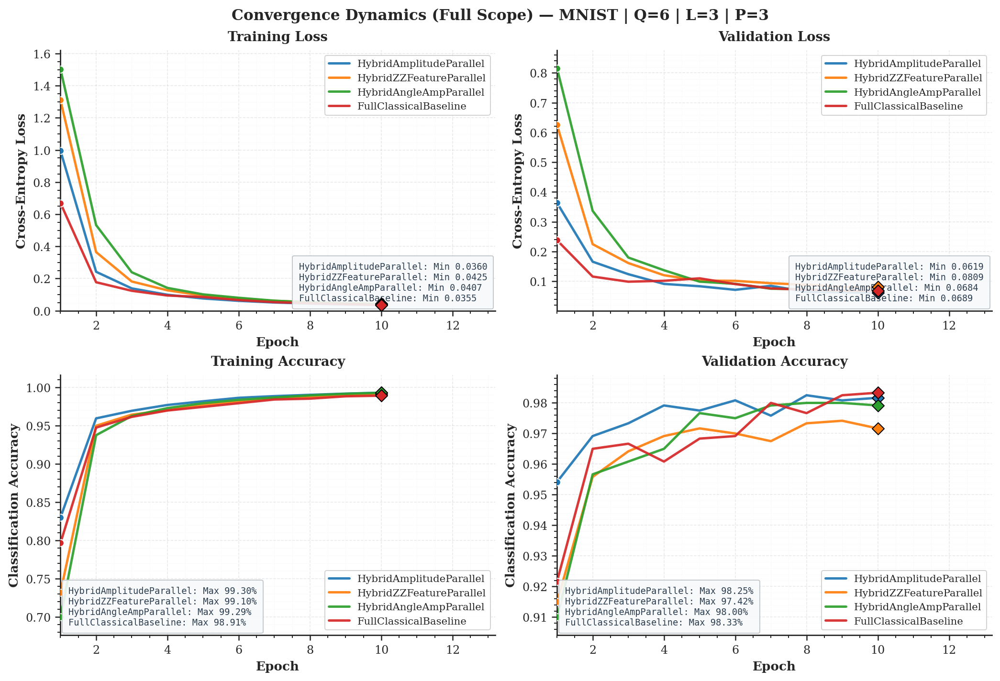

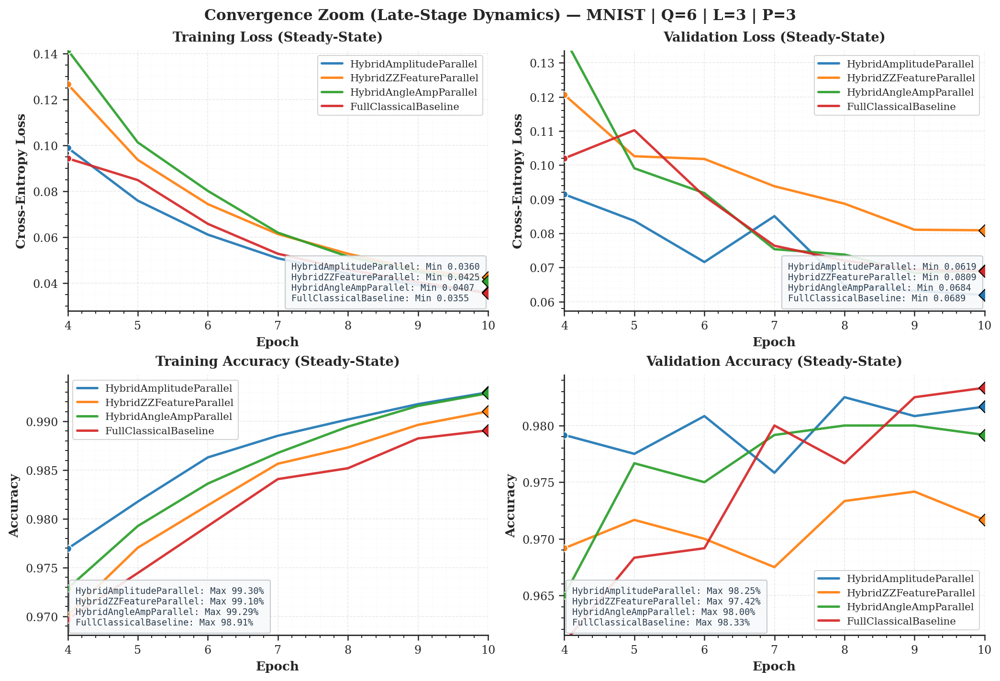

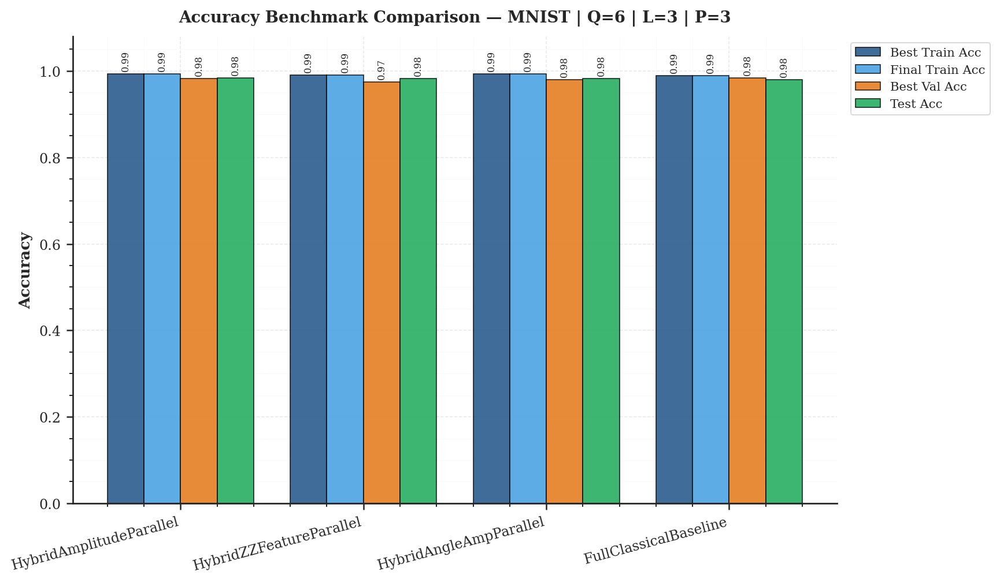

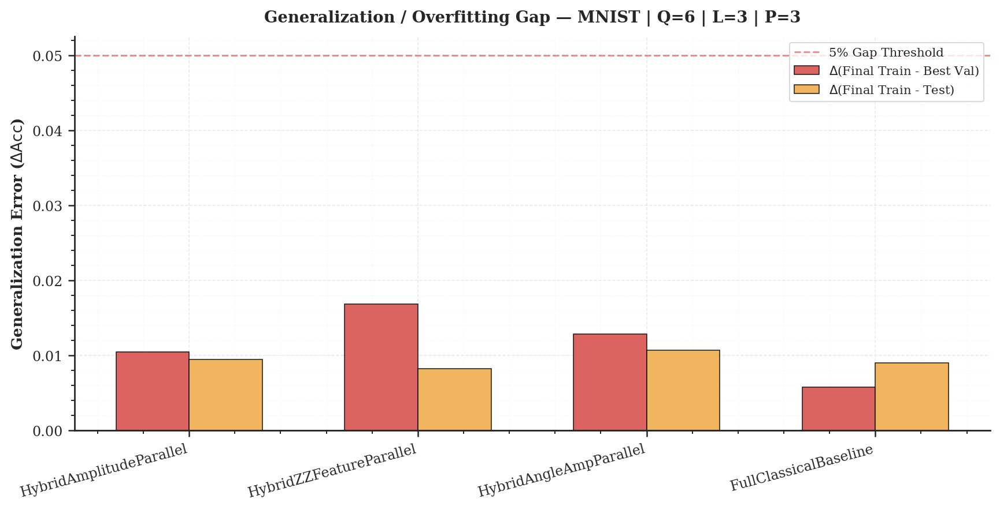

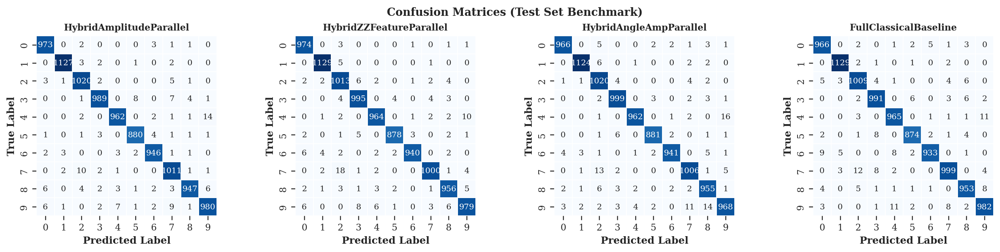


✅ Figures successfully generated at: D:\thesis\repu-of-git\hybrid_qml_image_classification\My_Quantum_Image_Project\results_hybrid_parallel\figures-Mnist\test_005


In [85]:
plot_all_results_scientific(
    all_histories=all_histories,
    all_test_results=all_test_results,
    cfg=cfg,
    save_dir=Path(cfg.save_dir) / "figures-Mnist"
)

In [164]:
# ==================== CIFAR-10 Config ====================
cfg.dataset_name = "cifar10"
cfg.data_root = "./data"
cfg.val_ratio = 0.1
cfg.batch_size = 64
cfg.epochs = 18         # CIFAR سخت‌تر است؛ می‌توانید بیشتر بگذارید
cfg.lr = 1e-3
cfg.weight_decay = 1e-3
cfg.num_workers = 2
cfg.feature_dim = 128
cfg.n_qubits = 7
cfg.n_q_layers = 4
cfg.n_parallel = 3
cfg.save_dir = "./results_hybrid_parallel_cifar10"

os.makedirs(cfg.save_dir, exist_ok=True)
os.makedirs(os.path.join(cfg.save_dir, "figures"), exist_ok=True)
os.makedirs(os.path.join(cfg.save_dir, "models"), exist_ok=True)
os.makedirs(os.path.join(cfg.save_dir, "reports"), exist_ok=True)

with open(os.path.join(cfg.save_dir, "config.json"), "w") as f:
    json.dump(asdict(cfg), f, indent=4)

print("Config updated for CIFAR-10")
print(f"save_dir = {cfg.save_dir}")
print("feature_dim:", cfg.feature_dim)
print("spatial grid:", cfg.spatial_h, "x", cfg.spatial_w)

Config updated for CIFAR-10
save_dir = ./results_hybrid_parallel_cifar10
feature_dim: 128
spatial grid: 8 x 8


In [165]:
# ساخت دیتالودرها با همان DatasetFactory
train_loader, val_loader, test_loader, in_channels, num_classes = DatasetFactory.build_loaders(cfg,selected_ratio=0.15)
cfg.num_classes = num_classes

print("in_channels :", in_channels)   # باید 3 باشد
print("num_classes :", num_classes)   # باید 10 باشد
print("Train batches:", len(train_loader))
print("Val batches  :", len(val_loader))
print("Test batches :", len(test_loader))

in_channels : 3
num_classes : 10
Train batches: 106
Val batches  : 12
Test batches : 157


In [166]:
models_cifar10 = build_all_models(in_channels, cfg)

optimizers = {}
schedulers = {}
for name, model in models_cifar10.items():
    optimizers[name] = OptimizerFactory.build_optimizer(model, cfg)
    schedulers[name] = OptimizerFactory.build_scheduler(optimizers[name], cfg)


Trainable Parameters per Model:
HybridAmplitudeParallel       : 155,814 params
HybridZZFeatureParallel       : 155,942 params
HybridDenseAngleParallel      : 155,942 params
FullClassicalBaseline         : 165,674 params


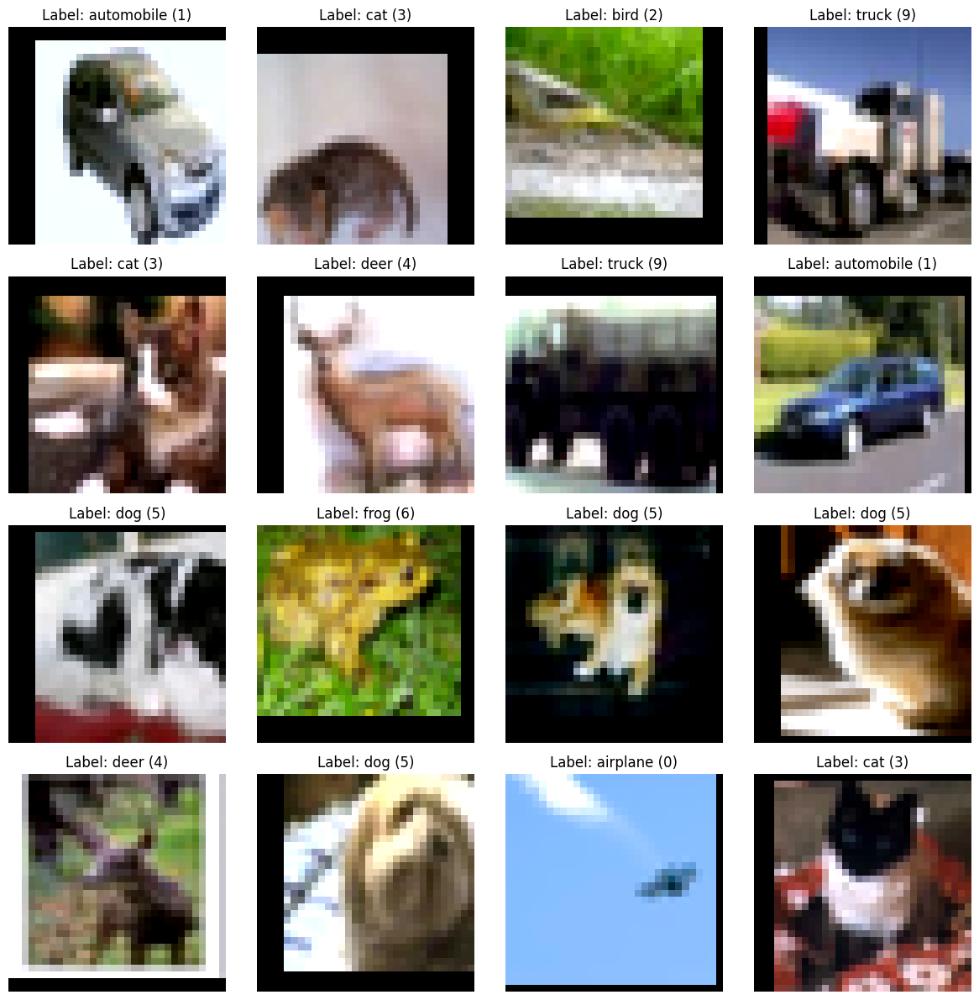

In [30]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']
image , labels = next(iter(train_loader))
n_show = min(16,image.size(0)) 
cols =4 
rows = int(np.ceil(n_show/cols))

mean = torch.tensor([0.4914, 0.4822, 0.4465]).view(3, 1, 1)
std  = torch.tensor([0.2470, 0.2435, 0.2616]).view(3, 1, 1)

fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
axes = np.array(axes).reshape(-1)

for i in range(n_show):
    img =image[i].detach().cpu() 
    
    img  = img * std + mean
    img = img.clamp(0, 1)
    
    img  = img.permute(1, 2, 0).numpy()  # (C,H,W) → (H,W,C)
    
    label_id = labels[i].item()
    label_name = class_names[label_id] if label_id < len(class_names) else str(label_id)
    
    axes[i].imshow(img)
    axes[i].set_title(f"Label: {label_name} ({label_id})")
    axes[i].axis("off")
    
    
for j in range(n_show, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()    
    

In [134]:
all_histories_cifa10 = {}
all_best_states_cifa10 = {}

In [135]:


# ----- ۱. HybridAmplitudeParallel -----
name = "HybridAmplitudeParallel"
print(f"\n{'='*80}\nTraining {name} on CIFAR-10\n{'='*80}")
history, best_state = train_one_model(
    name=name,
    model=models_cifar10[name],
    optimizer=optimizers[name],
    scheduler=schedulers[name],
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
    patience=5,          # کمی صبورتر برای CIFAR
    min_delta=1e-4
)
all_histories_cifa10[name] = history
all_best_states_cifa10[name] = best_state


Training HybridAmplitudeParallel on CIFAR-10

[HybridAmplitudeParallel] Epoch [1/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=False
    Train Part 1/5 | Batch 22/106 | Progress= 20% | loss=2.2054 | acc=0.1882 | time=12.3s
    Train Part 2/5 | Batch 43/106 | Progress= 40% | loss=2.1235 | acc=0.2242 | time=18.6s
    Train Part 3/5 | Batch 64/106 | Progress= 60% | loss=2.0632 | acc=0.2483 | time=24.5s
    Train Part 4/5 | Batch 85/106 | Progress= 80% | loss=2.0119 | acc=0.2629 | time=31.1s
    Train Part 5/5 | Batch 106/106 | Progress=100% | loss=1.9723 | acc=0.2815 | time=36.8s
  ✓ New best val_acc=0.3373  (saved)
HybridAmplitudeParallel   | train_loss=1.9723 | train_acc=0.2815 | val_loss=1.8382 | val_acc=0.3373 | val_macro_f1=0.3027 | time=45.0s

[HybridAmplitudeParallel] Epoch [2/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=F

In [136]:
# ----- ۱. HybridZZFeatureParallel -----
name = "HybridZZFeatureParallel"
print(f"\n{'='*80}\nTraining {name} on CIFAR-10\n{'='*80}")
history, best_state = train_one_model(
    name=name,
    model=models_cifar10[name],
    optimizer=optimizers[name],
    scheduler=schedulers[name],
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
    patience=5,          # کمی صبورتر برای CIFAR
    min_delta=1e-4
)
all_histories_cifa10[name] = history
all_best_states_cifa10[name] = best_state


Training HybridZZFeatureParallel on CIFAR-10

[HybridZZFeatureParallel] Epoch [1/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=False
    Train Part 1/5 | Batch 22/106 | Progress= 20% | loss=2.3026 | acc=0.1243 | time=17.8s
    Train Part 2/5 | Batch 43/106 | Progress= 40% | loss=2.2888 | acc=0.1352 | time=28.9s
    Train Part 3/5 | Batch 64/106 | Progress= 60% | loss=2.2554 | acc=0.1611 | time=40.1s
    Train Part 4/5 | Batch 85/106 | Progress= 80% | loss=2.2115 | acc=0.1858 | time=51.4s
    Train Part 5/5 | Batch 106/106 | Progress=100% | loss=2.1700 | acc=0.2052 | time=62.5s
  ✓ New best val_acc=0.3373  (saved)
HybridZZFeatureParallel   | train_loss=2.1700 | train_acc=0.2052 | val_loss=1.9736 | val_acc=0.3373 | val_macro_f1=0.2923 | time=71.9s

[HybridZZFeatureParallel] Epoch [2/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=F

In [167]:
# ----- ۱. HybridDenseAngleParallel -----
name = "HybridDenseAngleParallel"
print(f"\n{'='*80}\nTraining {name} on CIFAR-10\n{'='*80}")
history, best_state = train_one_model(
    name=name,
    model=models_cifar10[name],
    optimizer=optimizers[name],
    scheduler=schedulers[name],
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
    patience=5,          # کمی صبورتر برای CIFAR
    min_delta=1e-4
)
all_histories_cifa10[name] = history
all_best_states_cifa10[name] = best_state


Training HybridDenseAngleParallel on CIFAR-10

[HybridDenseAngleParallel] Epoch [1/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=False


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x000001887F39D620>
Traceback (most recent call last):
  File "c:\Users\Acer\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\data\dataloader.py", line 1663, in __del__
    self._shutdown_workers()
  File "c:\Users\Acer\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\data\dataloader.py", line 1621, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
                                   ^^^^^^^^^^^^^^^^^^^^
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


    Train Part 1/5 | Batch 22/106 | Progress= 20% | loss=2.3043 | acc=0.0952 | time=19.8s
    Train Part 2/5 | Batch 43/106 | Progress= 40% | loss=2.3034 | acc=0.1083 | time=32.8s
    Train Part 3/5 | Batch 64/106 | Progress= 60% | loss=2.2975 | acc=0.1223 | time=45.8s
    Train Part 4/5 | Batch 85/106 | Progress= 80% | loss=2.2841 | acc=0.1390 | time=59.3s
    Train Part 5/5 | Batch 106/106 | Progress=100% | loss=2.2603 | acc=0.1520 | time=72.2s
  ✓ New best val_acc=0.1840  (saved)
HybridDenseAngleParallel  | train_loss=2.2603 | train_acc=0.1520 | val_loss=2.1067 | val_acc=0.1840 | val_macro_f1=0.0830 | time=81.8s

[HybridDenseAngleParallel] Epoch [2/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=False


KeyboardInterrupt: 

In [138]:
# ----- ۴. FullClassicalBaseline -----
name = "FullClassicalBaseline"
print(f"\n{'='*80}\nTraining {name} on CIFAR-10\n{'='*80}")
history, best_state = train_one_model(
    name=name,
    model=models_cifar10[name],
    optimizer=optimizers[name],
    scheduler=schedulers[name],
    train_loader=train_loader,
    val_loader=val_loader,
    cfg=cfg,
    device=DEVICE,
    patience=5,
    min_delta=1e-4
)
all_histories_cifa10[name] = history
all_best_states_cifa10[name] = best_state


Training FullClassicalBaseline on CIFAR-10

[FullClassicalBaseline] Epoch [1/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=False
    Train Part 1/5 | Batch 22/106 | Progress= 20% | loss=2.1597 | acc=0.1882 | time=6.2s
    Train Part 2/5 | Batch 43/106 | Progress= 40% | loss=2.0388 | acc=0.2253 | time=6.4s
    Train Part 3/5 | Batch 64/106 | Progress= 60% | loss=1.9563 | acc=0.2571 | time=6.5s
    Train Part 4/5 | Batch 85/106 | Progress= 80% | loss=1.9036 | acc=0.2746 | time=6.7s
    Train Part 5/5 | Batch 106/106 | Progress=100% | loss=1.8542 | acc=0.2963 | time=6.8s
  ✓ New best val_acc=0.4027  (saved)
FullClassicalBaseline     | train_loss=1.8542 | train_acc=0.2963 | val_loss=1.6269 | val_acc=0.4027 | val_macro_f1=0.3636 | time=13.8s

[FullClassicalBaseline] Epoch [2/18]
--------------------------------------------------------------------------------
    Training started | batches=106 | amp=False
    Tr

In [32]:
print(models_cifar10.keys())

dict_keys(['HybridAmplitudeParallel', 'HybridZZFeatureParallel', 'HybridDenseAngleParallel', 'FullClassicalBaseline'])


In [139]:
all_test_results = {}

for name in ['HybridAmplitudeParallel', 'HybridZZFeatureParallel', 'HybridDenseAngleParallel', 'FullClassicalBaseline']:
    print(f"\n{'=' * 80}")
    print(f"Evaluating {name} on CIFAR-10 test set")
    print(f"{'=' * 80}")

    test_result = evaluate_one_model_on_test(
        name=name,
        model=models_cifar10[name],
        best_state=all_best_states_cifa10[name],
        test_loader=test_loader,
        cfg=cfg,
        device=DEVICE,
    )

    all_test_results[name] = test_result

print("\nTest evaluation completed.")
print("Test results:", list(all_test_results.keys()))



Evaluating HybridAmplitudeParallel on CIFAR-10 test set

TEST RESULT: HybridAmplitudeParallel
Loss       : 1.0859
Accuracy   : 0.6212
Macro F1   : 0.6183
Weighted F1: 0.6183

Evaluating HybridZZFeatureParallel on CIFAR-10 test set

TEST RESULT: HybridZZFeatureParallel
Loss       : 1.1104
Accuracy   : 0.6172
Macro F1   : 0.6116
Weighted F1: 0.6116

Evaluating HybridDenseAngleParallel on CIFAR-10 test set

TEST RESULT: HybridDenseAngleParallel
Loss       : 1.1678
Accuracy   : 0.6004
Macro F1   : 0.5962
Weighted F1: 0.5962

Evaluating FullClassicalBaseline on CIFAR-10 test set

TEST RESULT: FullClassicalBaseline
Loss       : 0.9945
Accuracy   : 0.6418
Macro F1   : 0.6404
Weighted F1: 0.6404

Test evaluation completed.
Test results: ['HybridAmplitudeParallel', 'HybridZZFeatureParallel', 'HybridDenseAngleParallel', 'FullClassicalBaseline']


In [140]:
import json
import torch
from pathlib import Path

save_root = Path(cfg.save_dir)
checkpoint_dir = save_root / "checkpoints"
report_dir = save_root / "reports"

checkpoint_dir.mkdir(parents=True, exist_ok=True)
report_dir.mkdir(parents=True, exist_ok=True)

# ذخیره بهترین وزن هر مدل
for name in all_best_states_cifa10:
    torch.save(
        {
            "model_name": name,
            "best_state_dict": all_best_states_cifa10[name],
            "history": all_histories_cifa10[name],
        },
        checkpoint_dir / f"{name}_best_cifar10.pt"
    )

# ذخیره نتایج تست
results_to_save = {
    name: {
        "loss": float(res["loss"]),
        "acc": float(res["acc"]),
        "macro_f1": float(res["macro_f1"]),
        "weighted_f1": float(res["weighted_f1"]),
        "classification_report": res["classification_report"],
        "confusion_matrix": res["confusion_matrix"].tolist(),
    }
    for name, res in all_test_results.items()
}

with open(report_dir / "test_results_cifar10.json", "w", encoding="utf-8") as f:
    json.dump(results_to_save, f, indent=4, ensure_ascii=False)

# ذخیره تاریخچه epochها
histories_to_save = {
    name: {
        metric_name: [float(value) for value in values]
        for metric_name, values in history.items()
    }
    for name, history in all_histories_cifa10.items()
}

with open(report_dir / "histories_cifar10.json", "w", encoding="utf-8") as f:
    json.dump(histories_to_save, f, indent=4, ensure_ascii=False)

print(f"Checkpoints saved in: {checkpoint_dir}")
print(f"Reports saved in: {report_dir}")


Checkpoints saved in: results_hybrid_parallel_cifar10\checkpoints
Reports saved in: results_hybrid_parallel_cifar10\reports


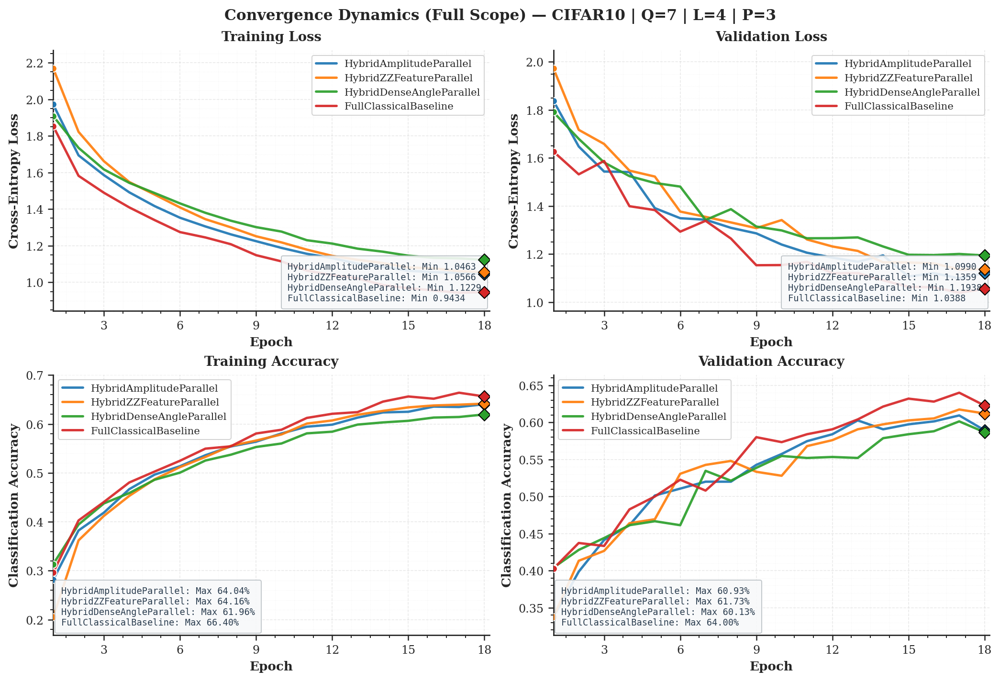

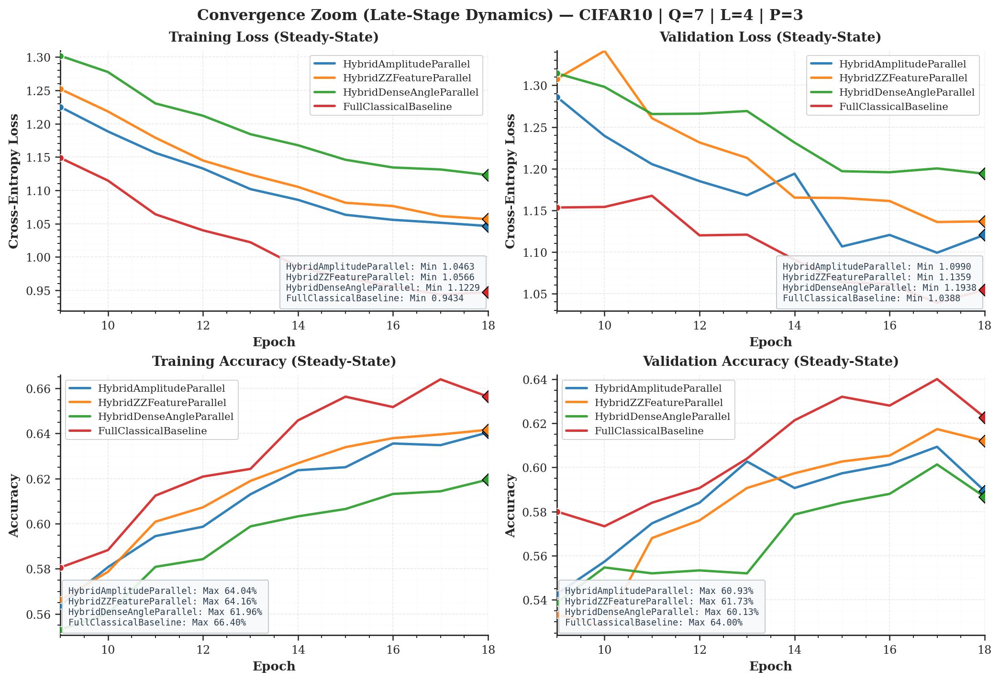

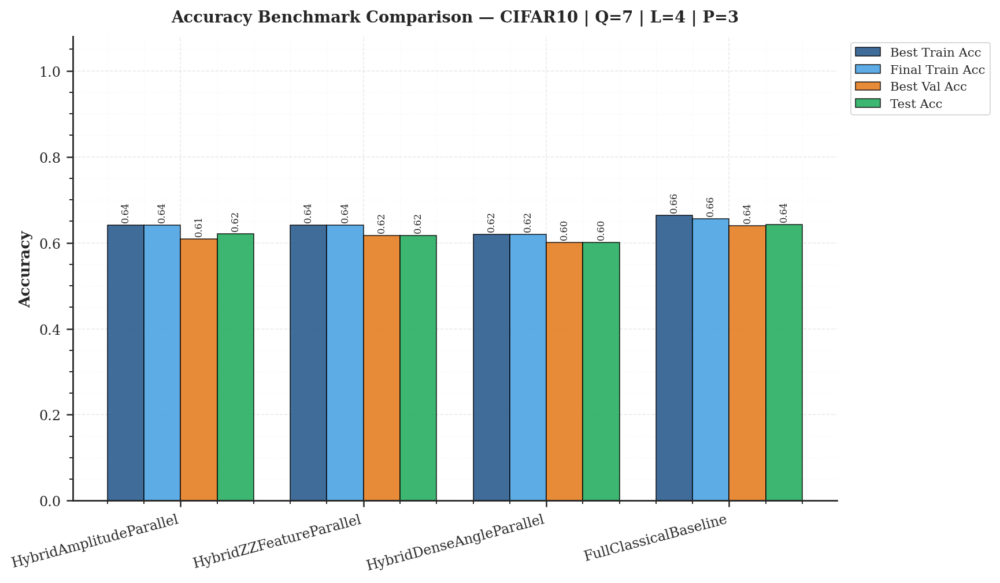

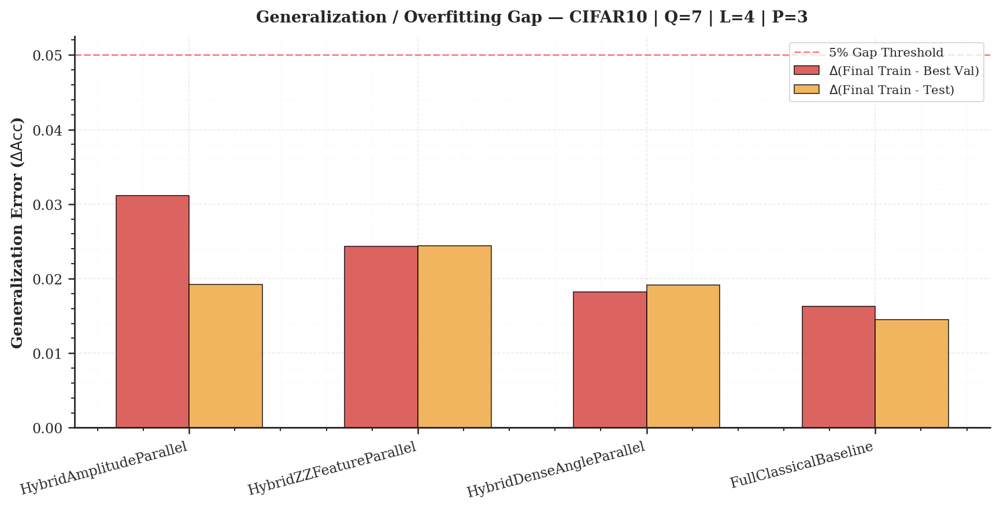

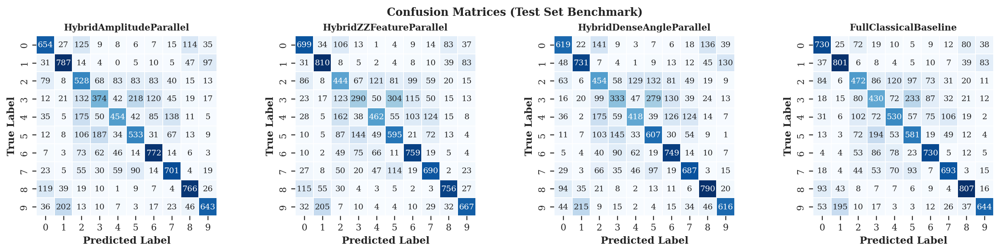


✅ Figures successfully generated at: D:\thesis\repu-of-git\hybrid_qml_image_classification\My_Quantum_Image_Project\results_hybrid_parallel_cifar10\figures\test_007


In [141]:
plot_all_results_scientific(
    all_histories=all_histories_cifa10,
    all_test_results=all_test_results,
    cfg=cfg,
    save_dir=Path(cfg.save_dir) / "figures"
)

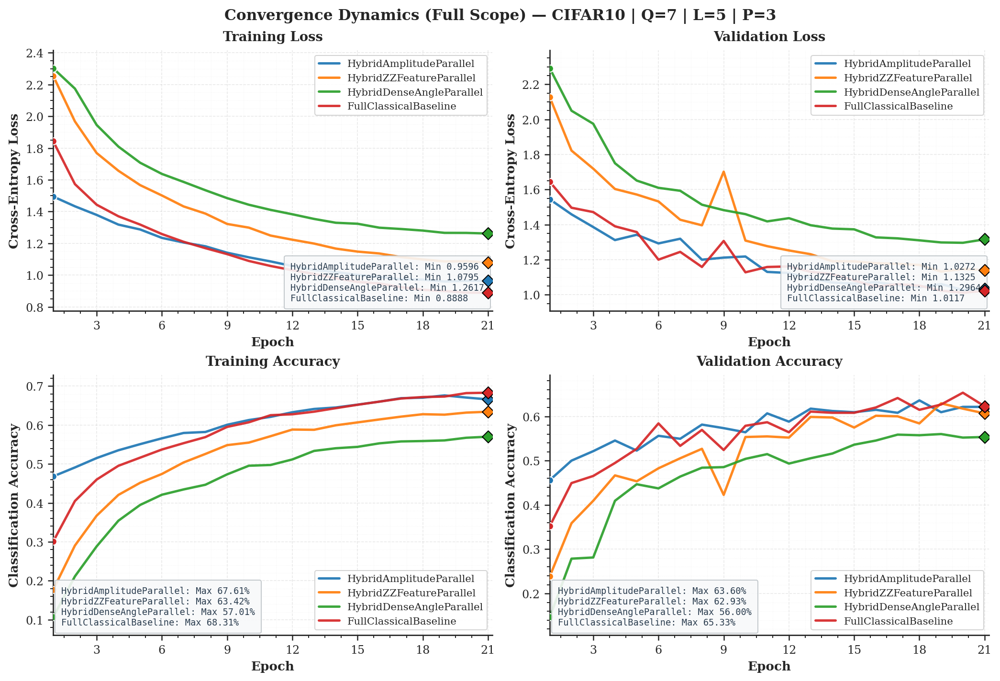

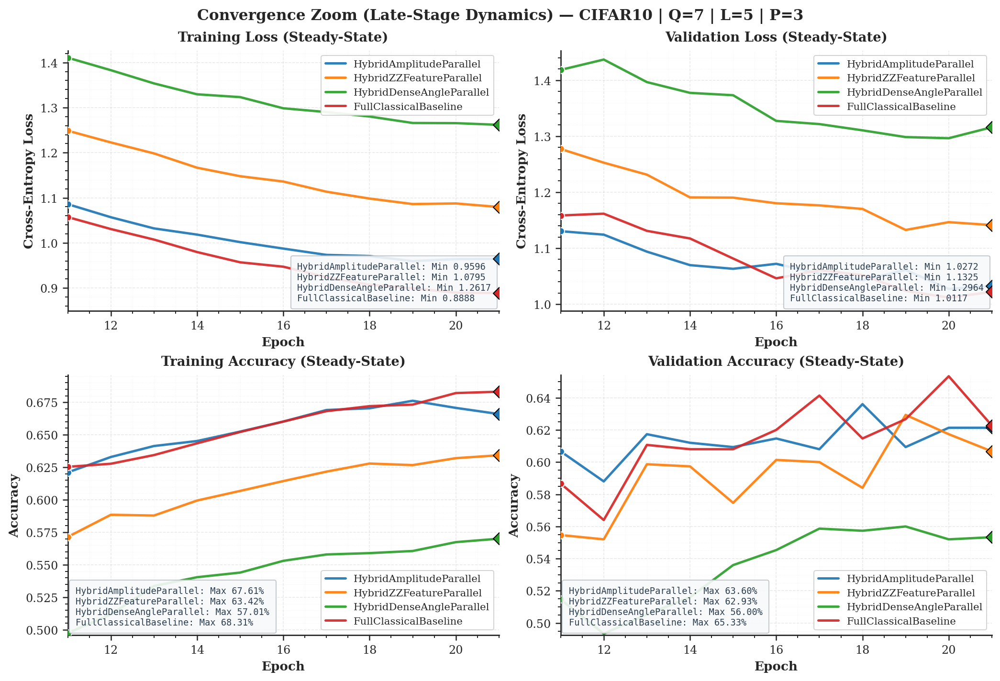

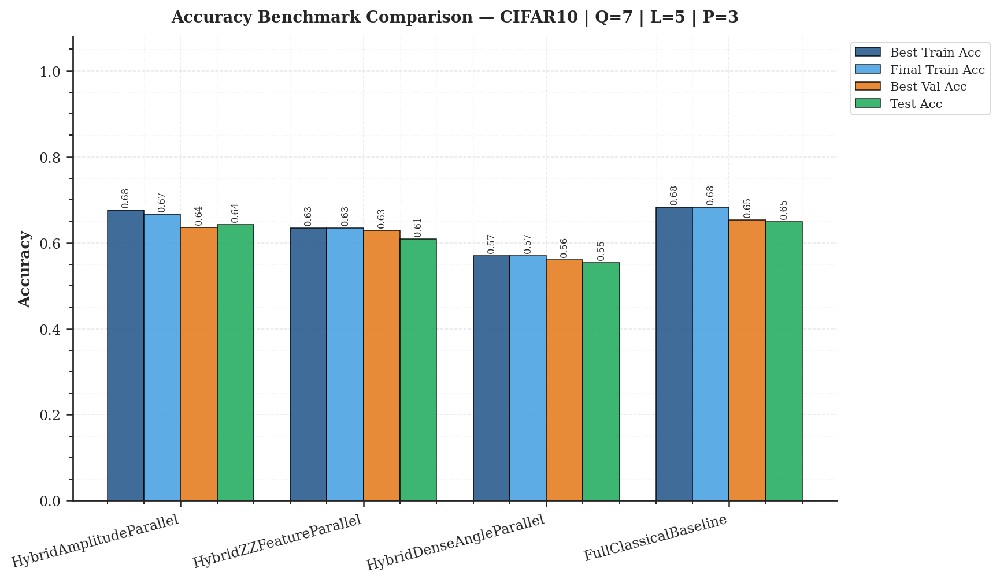

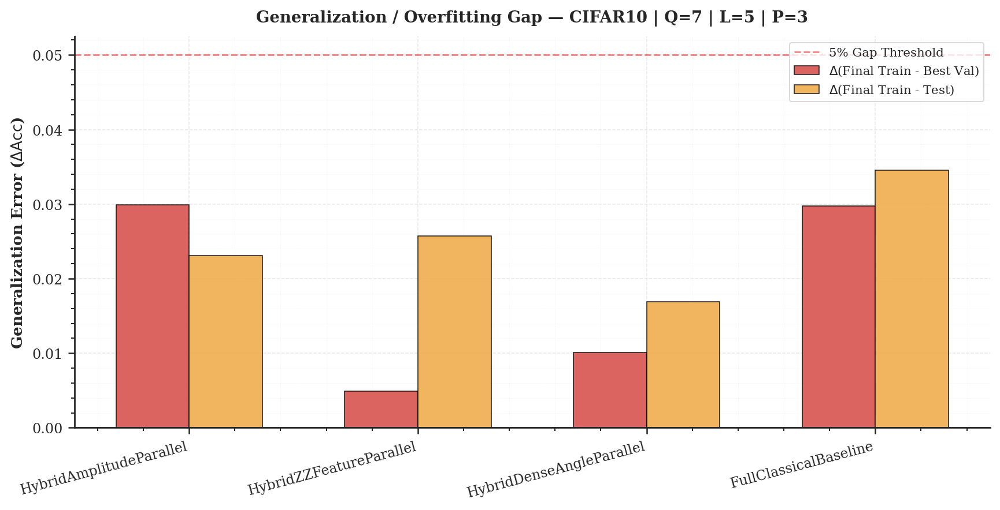

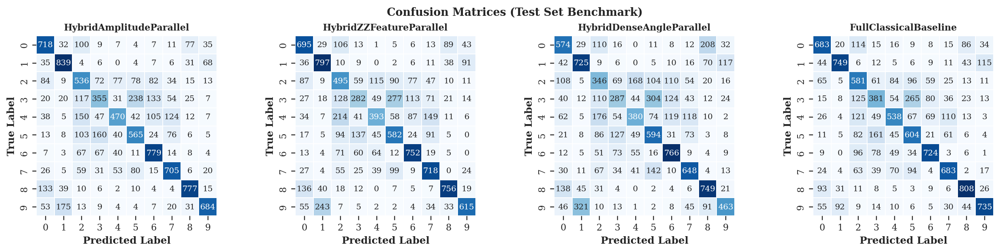


✅ Figures successfully generated at: D:\thesis\repu-of-git\hybrid_qml_image_classification\My_Quantum_Image_Project\results_hybrid_parallel_cifar10\figures\test_006


In [127]:
plot_all_results_scientific(
    all_histories=all_histories_cifa10,
    all_test_results=all_test_results,
    cfg=cfg,
    save_dir=Path(cfg.save_dir) / "figures"
)

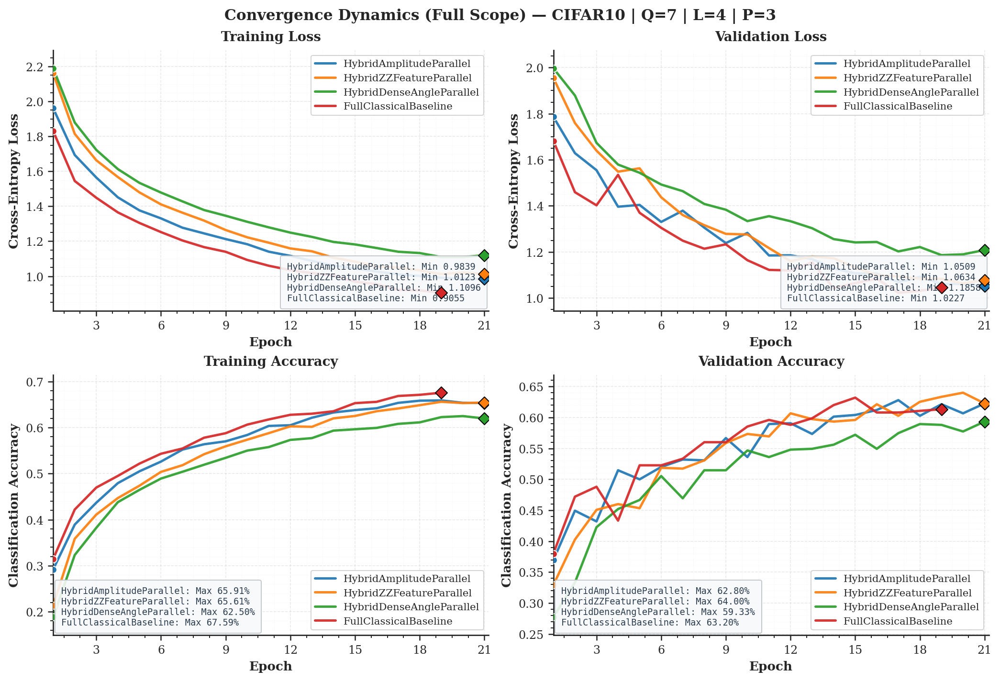

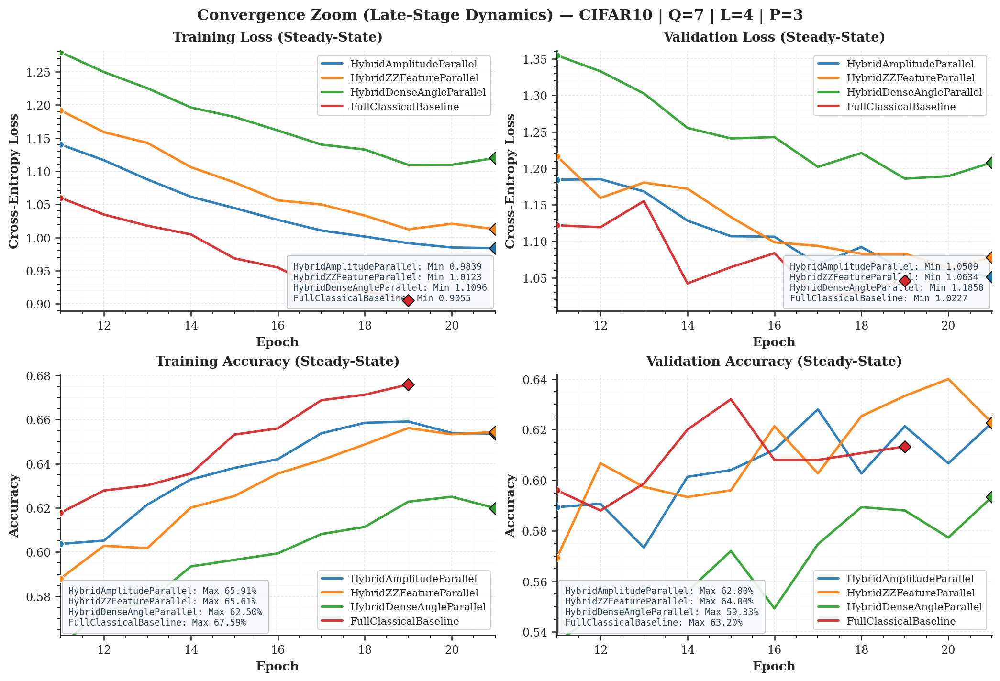

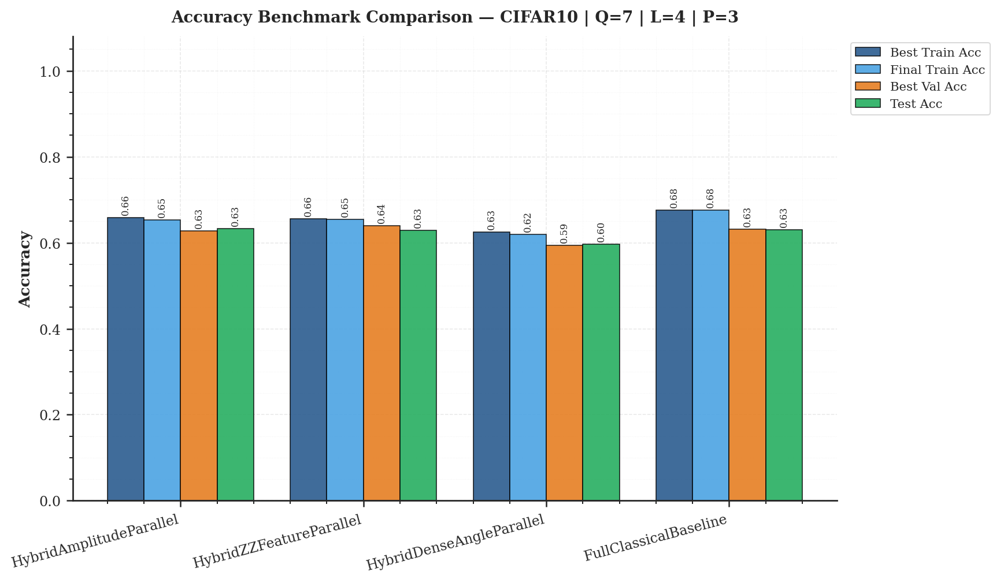

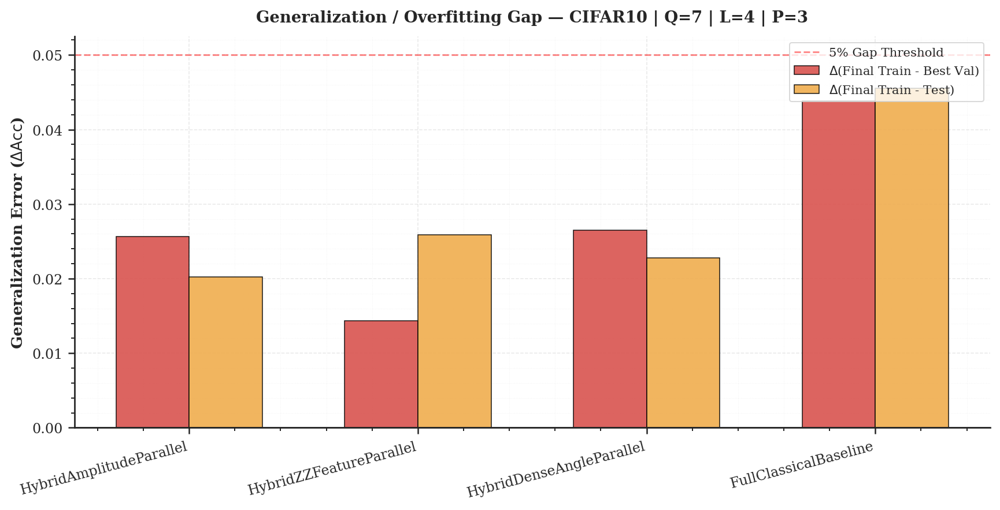

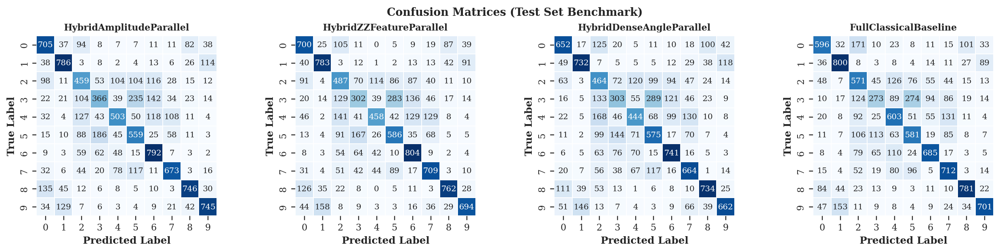


✅ Figures successfully generated at: D:\thesis\repu-of-git\hybrid_qml_image_classification\My_Quantum_Image_Project\results_hybrid_parallel_cifar10\figures\test_005


In [48]:
plot_all_results_scientific(
    all_histories=all_histories_cifa10,
    all_test_results=all_test_results,
    cfg=cfg,
    save_dir=Path(cfg.save_dir) / "figures"
)

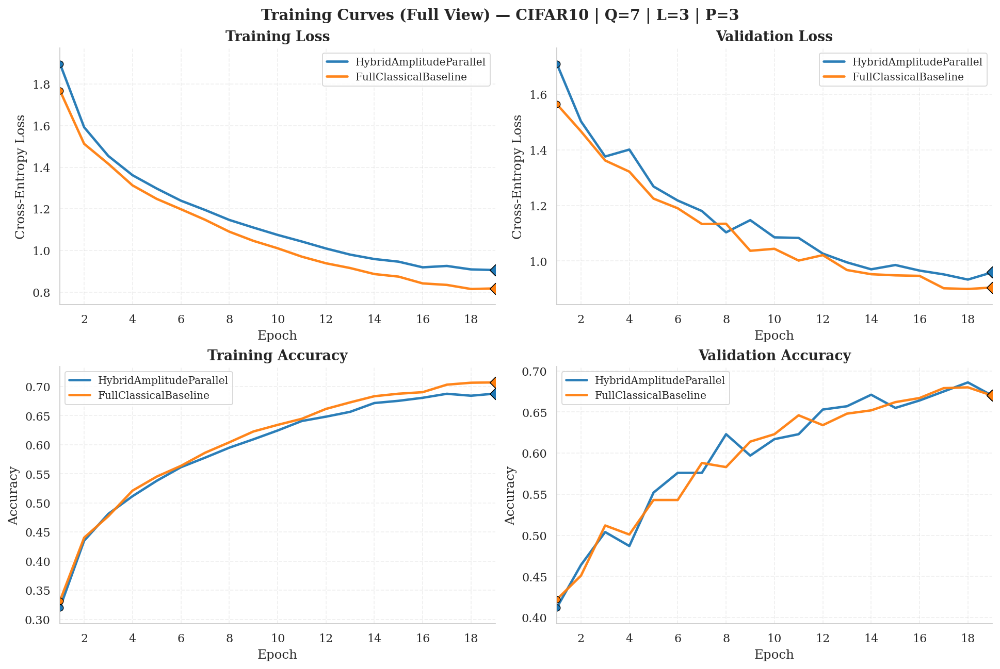

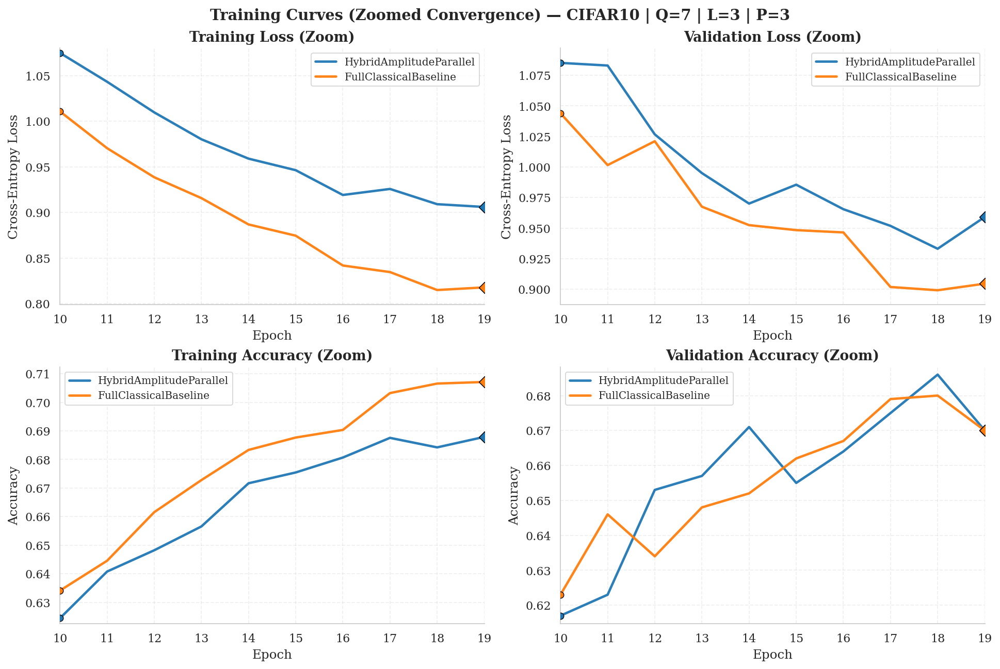

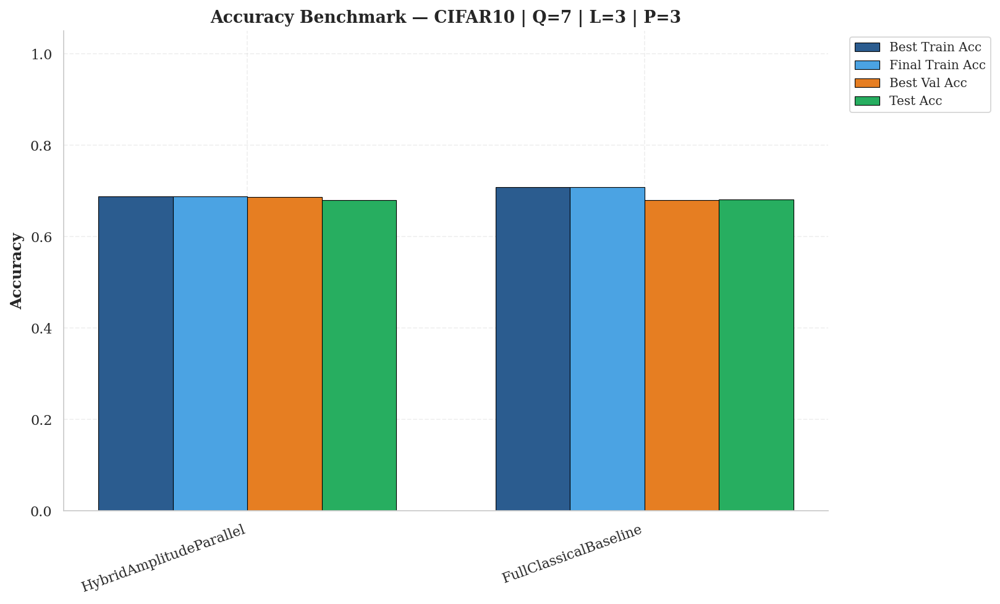

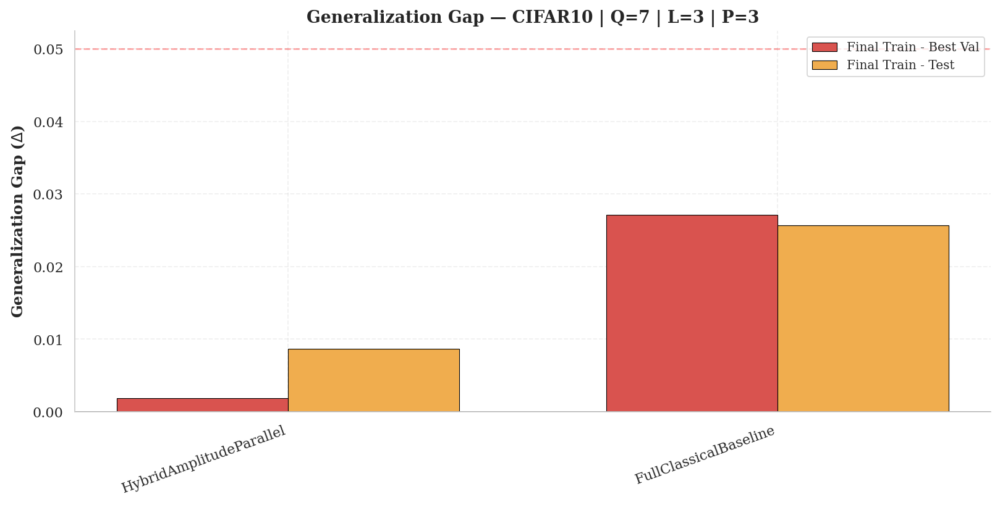

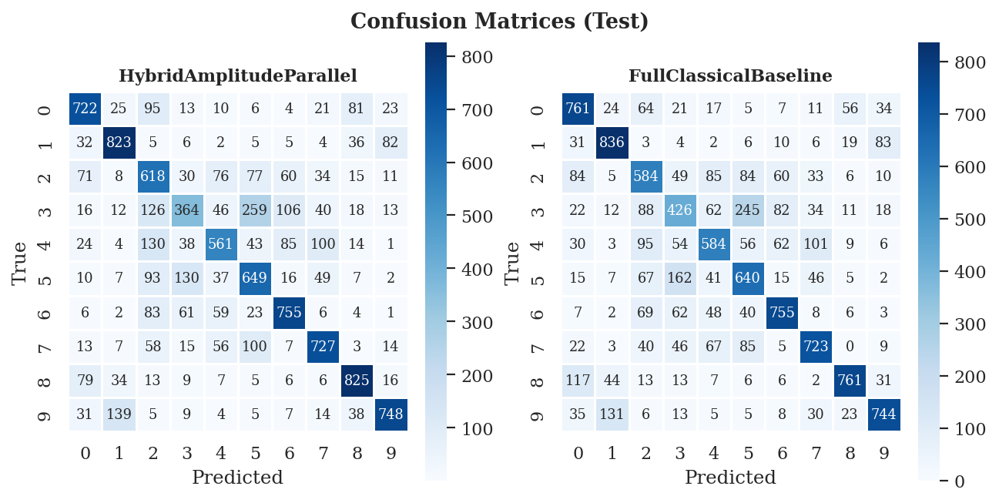


✅ Saved to: D:\thesis\repu-of-git\hybrid_qml_image_classification\My_Quantum_Image_Project\results_hybrid_parallel_cifar10\figures\test_001


In [256]:
plot_all_results_scientific(
    all_histories=all_histories_cifa10,
    all_test_results=all_test_results,
    cfg=cfg,
    save_dir=Path(cfg.save_dir) / "figures"
)


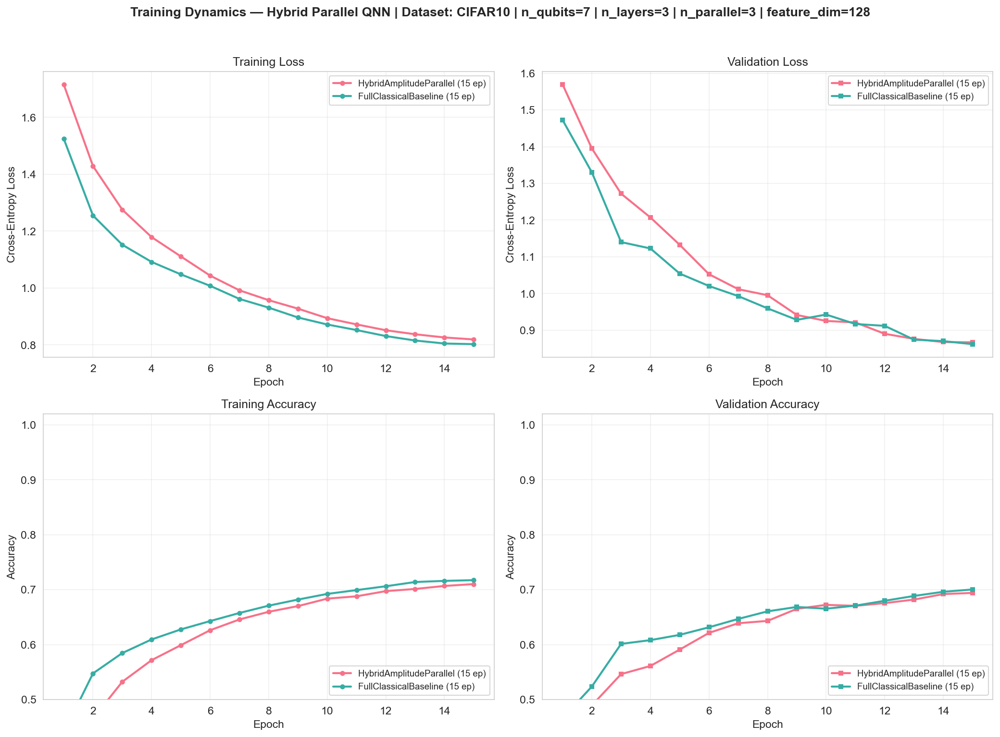

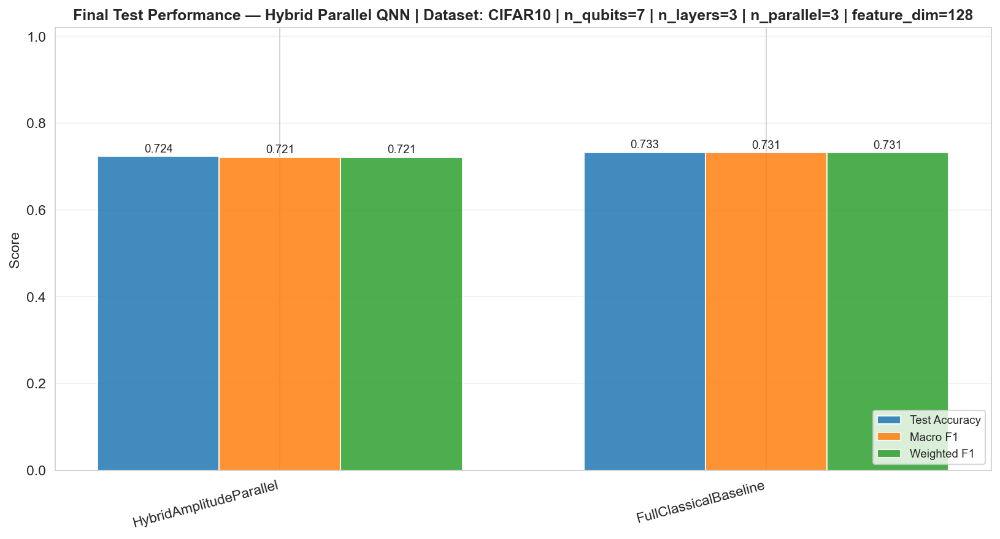

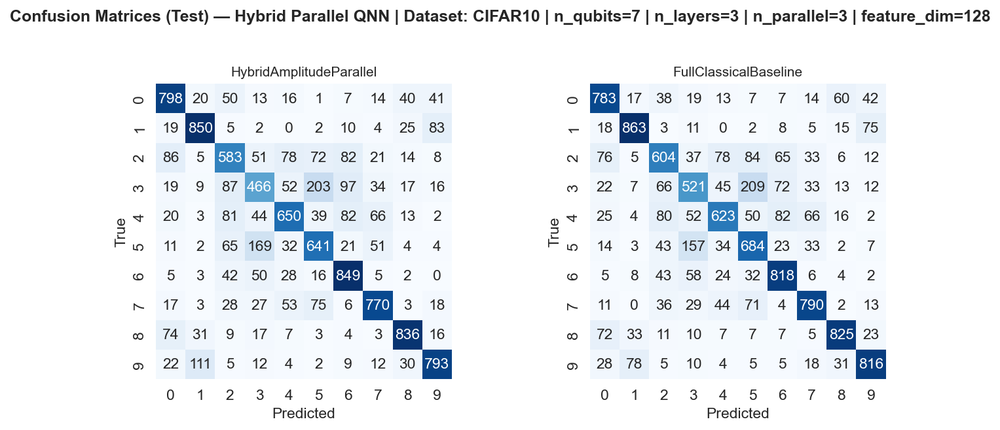

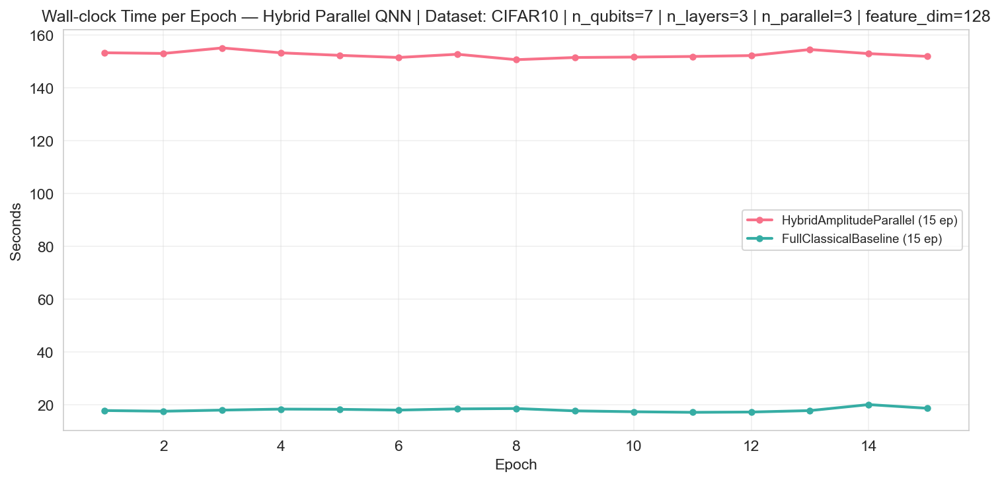


FINAL SUMMARY TABLE (copy-ready for paper)
Hybrid Parallel QNN | Dataset: CIFAR10 | n_qubits=7 | n_layers=3 | n_parallel=3 | feature_dim=128
Model                            |  Test Acc |  Macro-F1 |      W-F1 |  Test Loss | Best Val Acc | Epochs
------------------------------------------------------------------------------------------------------------
HybridAmplitudeParallel          |    0.7236 |    0.7211 |    0.7211 |     0.7965 |       0.6942 |     15
FullClassicalBaseline            |    0.7327 |    0.7314 |    0.7314 |     0.7605 |       0.7004 |     15

All figures saved to: results_hybrid_parallel_cifar10\figures
Circuit diagrams → figures/circuits/
Architecture schematic → figures/architecture/


In [106]:
plot_all_results_scientific(
    all_histories=all_histories_cifa10,
    all_test_results=all_test_results,
    cfg=cfg,
    save_dir=Path(cfg.save_dir) / "figures"
)
